In [11]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tf_util.systems import system_from_str
from train_dsn import train_dsn

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


w_0 2.23606797749979
zeta 0.22360679774997896


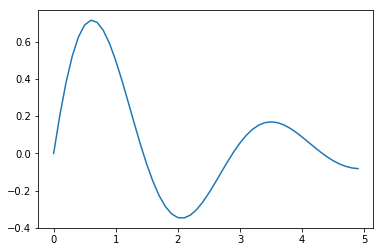

In [12]:
T = 50;
dt = .1;

k = 5.0;
c = 1.0;
m  = 1.0;

bounds = [0.0, 20.0];

w_0 = np.sqrt(k/m);
zeta = c/(2*np.sqrt(m*k));

print('w_0', w_0);
print('zeta', zeta);

A = 1.0;
theta = 0.0;
t = np.linspace(0,dt*(T-1),T);
x = A*np.exp(-(zeta*w_0*t))*np.sin(np.sqrt(1-np.square(zeta))*w_0*t + theta);

dxdt = A*(-zeta*w_0*np.exp(-zeta*w_0*t)*np.sin(np.sqrt(1.0-np.square(zeta))*w_0*t + theta) + \
          np.exp(-zeta*w_0*t)*np.cos(np.sqrt(1-np.square(zeta))*w_0*t + theta)*(np.sqrt(1-np.square(zeta))*w_0));

plt.figure();
plt.plot(t,x);
#plt.plot(t,dxdt);
#plt.legend(['x', 'dxdt']);
plt.show();

init_conds = np.array([0.0, dxdt[0]]);

[0.         0.22222222 0.44444444 0.66666667 0.88888889 1.11111111
 1.33333333 1.55555556 1.77777778 2.        ]


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in double_scalars
  app.launch_new_instance()
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars


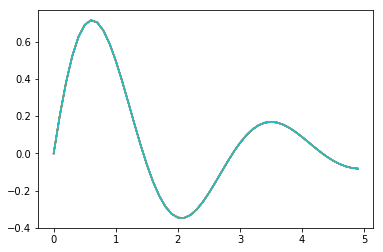

w_0 2.23606797749979
zeta 0.22360679774997896


In [13]:
# show that the degenerate solution space is just a scaling of c, m, and k
num_s = 10;
s = np.linspace(0,2,num_s);
print(s)

ks = [];
cs = [];
ms = [];
plt.figure();
for i in range(num_s):
    s_i = s[i];
    k_i = s_i*k;
    c_i = s_i*c;
    m_i = s_i*m;
    
    w_0 = np.sqrt(k_i/m_i);
    zeta = c_i/(2*np.sqrt(m_i*k_i));

    x_i = A*np.exp(-(zeta*w_0*t))*np.sin(np.sqrt(1-np.square(zeta))*w_0*t + theta);
    
    plt.plot(t, x_i);
    
    ks.append(k_i);
    cs.append(c_i);
    ms.append(m_i);
    
    dxdt = A*(-zeta*w_0*np.exp(-zeta*w_0*t)*np.sin(np.sqrt(1.0-np.square(zeta))*w_0*t + theta) + \
          np.exp(-zeta*w_0*t)*np.cos(np.sqrt(1-np.square(zeta))*w_0*t + theta)*(np.sqrt(1-np.square(zeta))*w_0));

    init_conds = np.array([0.0, dxdt[0]]);
    
plt.show();

print('w_0', w_0);
print('zeta', zeta);


In [14]:
D = 2;
system_str = 'damped_harmonic_oscillator'

behavior_str = 'steady_state';

system_class = system_from_str(system_str);
system = system_class(behavior_str, T, dt, init_conds, bounds);
print(system.name)

damped_harmonic_oscillator


In [15]:
K = 1;
M = num_s;
num_params = 3;
phi = tf.placeholder(dtype=tf.float64, shape=(K, M, num_params, 1));

X = system.simulate(phi);

_phi = np.expand_dims(np.expand_dims(np.array([ks,cs,ms]).T, 0), 3);
print(_phi.shape);

phi (1, 10, 3, 1)
(1, 10, 3, 1)


(1, 10, 2, 50)


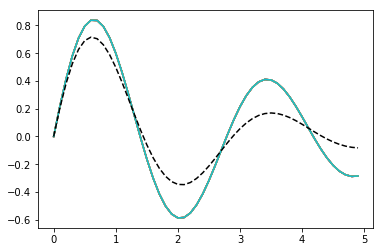

In [16]:
with tf.Session() as sess:
    _X = sess.run(X, {phi:_phi});

print(_X.shape);
t = np.linspace(0.0, dt*(T-1), T);

plt.figure();
for i in range(num_s):
    plt.plot(t, _X[0,i,0,:]);
plt.plot(t, x_i, 'k--');
plt.show();

In [17]:
# behavioral constraints
mu = x
Sigma = .0001*np.ones((T,));

{'mu': array([ 0.        ,  0.20567829,  0.38203797,  0.52351255,  0.62671824,
        0.69040656,  0.71532034,  0.70396894,  0.66034133,  0.58957623,
        0.49760918,  0.39081555,  0.2756665 ,  0.15841332,  0.04481209,
       -0.0601019 , -0.15218417, -0.22829266, -0.28634118, -0.32529783,
       -0.34513355, -0.34672806, -0.33174167, -0.30246238, -0.26163768,
       -0.21230069, -0.1575992 , -0.10063567, -0.04432447,  0.00872826,
        0.05631878,  0.09671188,  0.12867853,  0.15150593,  0.16498215,
        0.16935852,  0.16529365,  0.15378342,  0.13608175,  0.11361661,
        0.08790576,  0.06047635,  0.03279162,  0.00618766, -0.01817779,
       -0.03936323, -0.05666745, -0.06963986, -0.07807801, -0.08201356]), 'Sigma': array([0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001,
       0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001,
       0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001,
       0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.

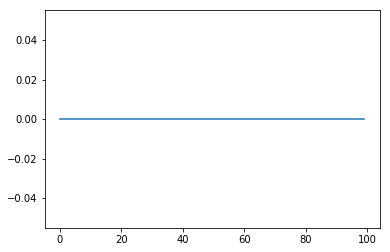

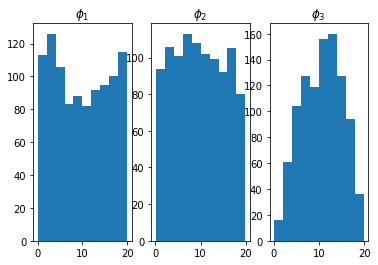

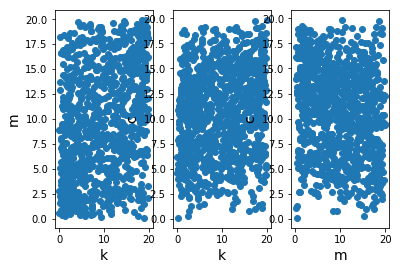

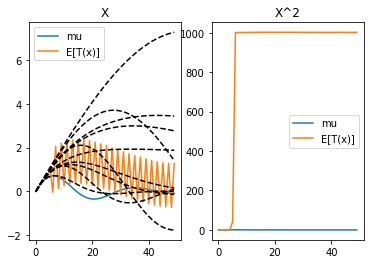

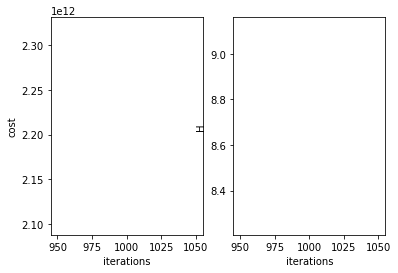

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 2000 
H 8.68243580245063
cost 25465251363941.625
system.D 3


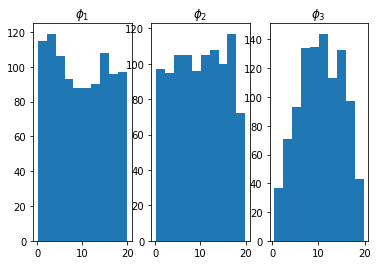

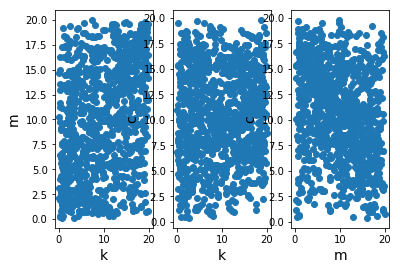

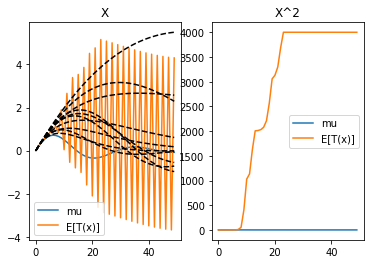

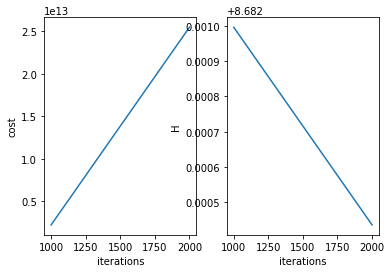

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 3000 
H 8.688047189466714
cost 18184346101755.934
system.D 3


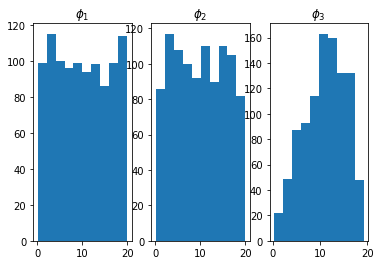

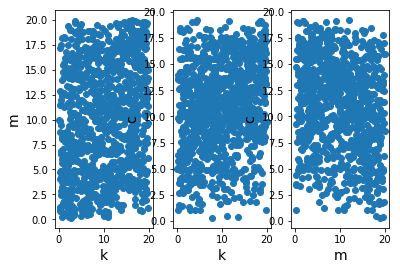

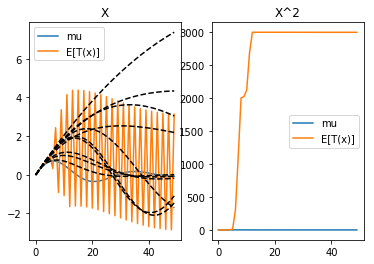

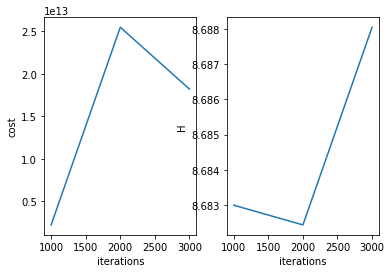

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 4000 
H 8.696253144005654
cost 1997940248156.9163
system.D 3


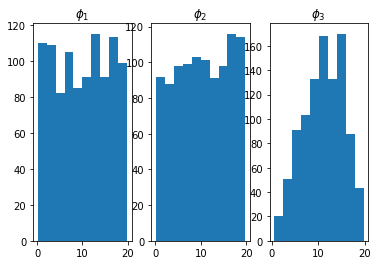

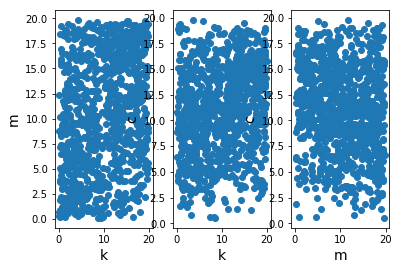

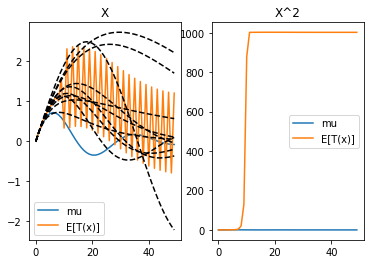

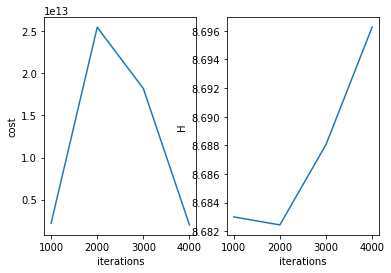

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 5000 
H 8.679050150371811
cost 2828224346091.7188
system.D 3


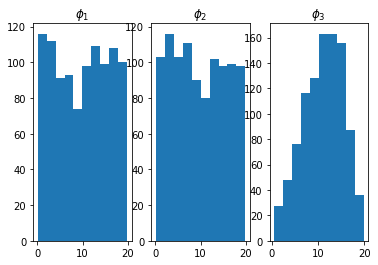

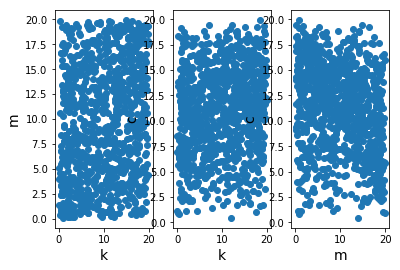

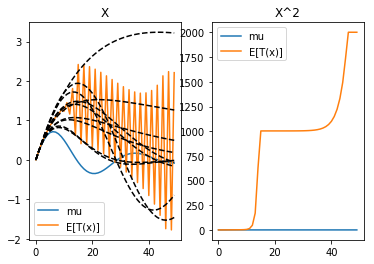

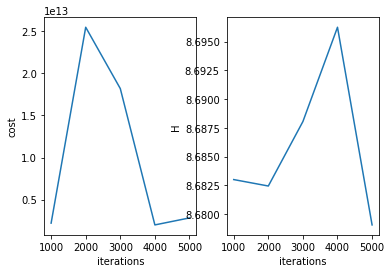

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 6000 
H 8.611322346744469
cost 12038947.768345436
system.D 3


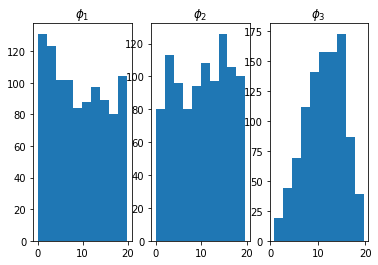

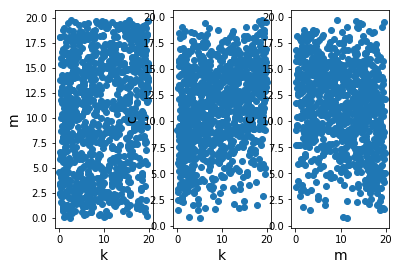

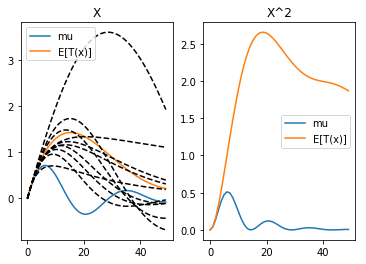

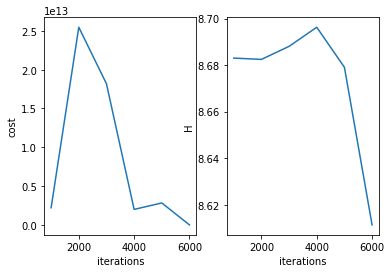

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 7000 
H 8.578032616580694
cost 2208598281246.6177
system.D 3


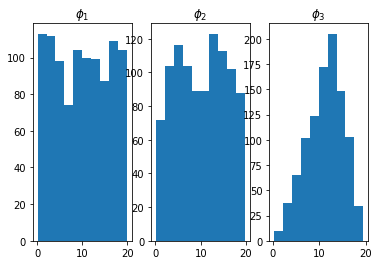

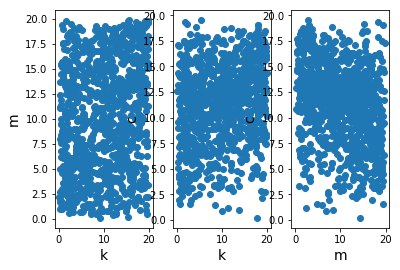

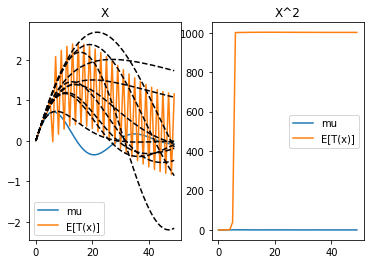

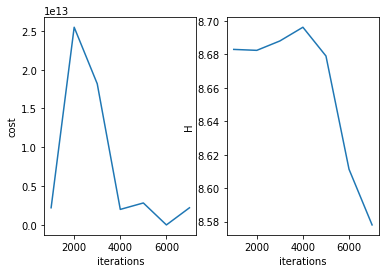

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 8000 
H 8.600746539528457
cost 1468725763305.4348
system.D 3


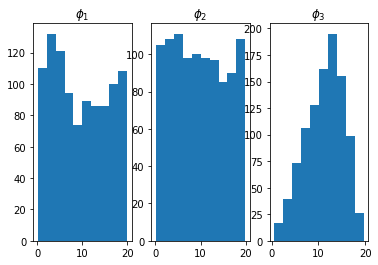

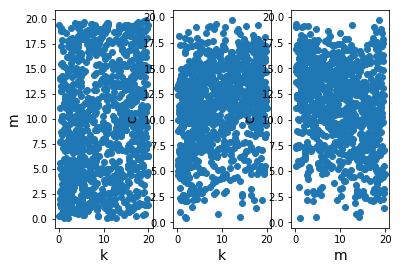

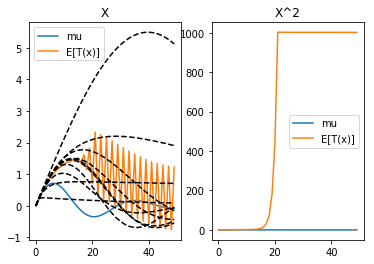

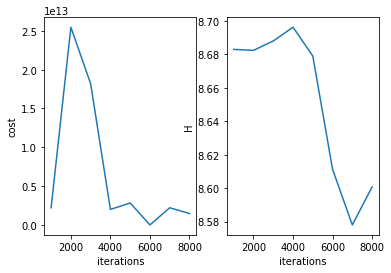

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 9000 
H 8.598063199322302
cost 1034034476222.7374
system.D 3


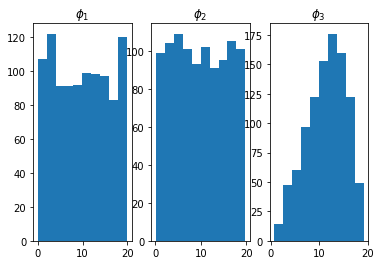

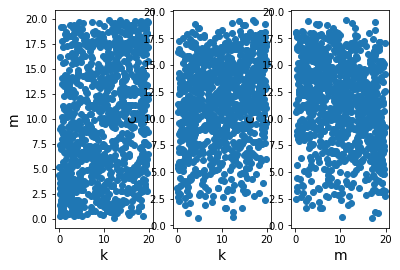

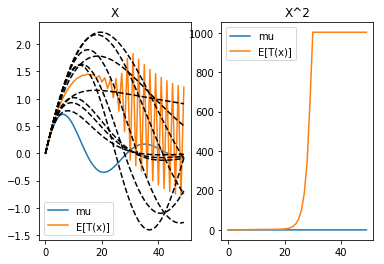

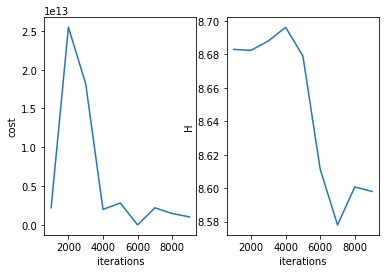

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 10000 
H 8.537437059694607
cost 11427978.38560163
system.D 3


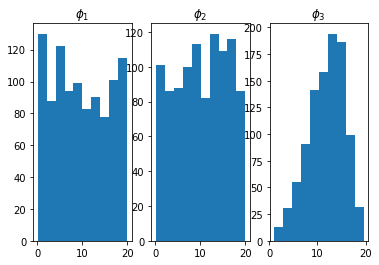

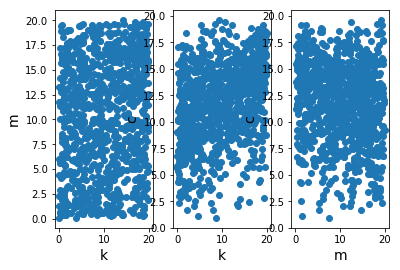

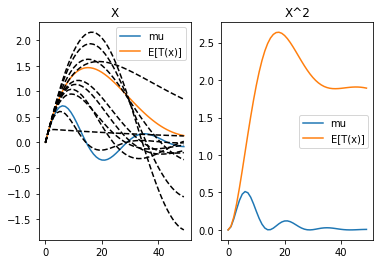

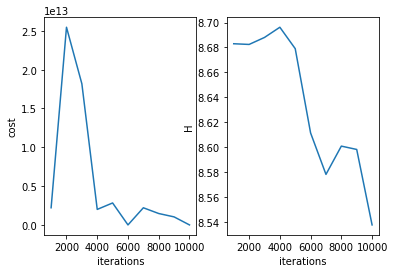

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 2
resetting optimizer
aug lag it 1
lambda [ 0.00000000e+00  1.22666558e+03  3.05564204e+03  6.30930761e+03
  1.14902912e+04  1.88452222e+04  2.84003374e+04  3.99935461e+04
  5.33081482e+04  6.79086608e+04  8.32777946e+04  9.88531712e+04
  1.14062308e+05  1.28354508e+05  1.41228525e+05  1.52255125e+05
  1.61094007e+05  1.67504811e+05  1.71352274e+05  1.72605852e+05
  1.71334327e+05  1.67696153e+05  1.61926385e+05  1.54321123e+05
  1.45220452e+05  1.34990805e+05  1.24007650e+05  1.12639259e+05
  1.01232249e+05  9.00993777e+04  7.95099682e+04  6.96831584e+04
  6.07840212e+04  5.29224655e+04  4.61547031e+04  4.04869679e+04
  3.58810977e+04  3.22615381e+04  2.95233035e+04  2.75404317e+04
  2.61744867e+04  2.52827097e+04  2.47254690e+04  2.43727312e+04
  2.41093448e+04  2.38390085e+04  2.34

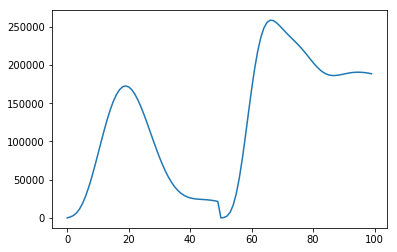

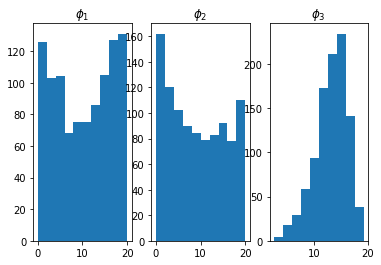

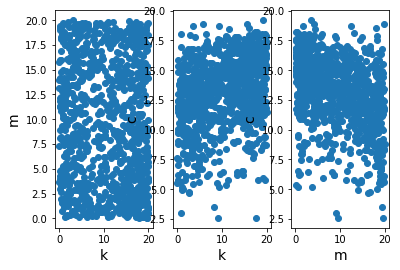

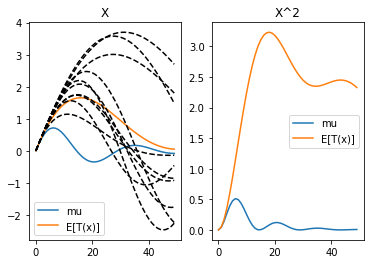

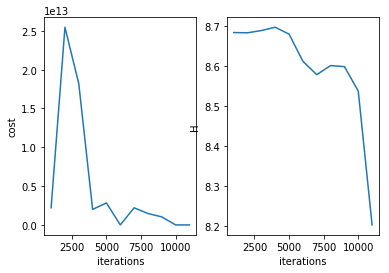

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 12000 
H 8.124318509034964
cost 212150148.2096286
system.D 3


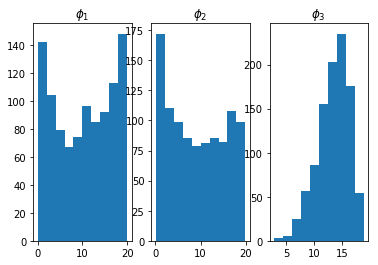

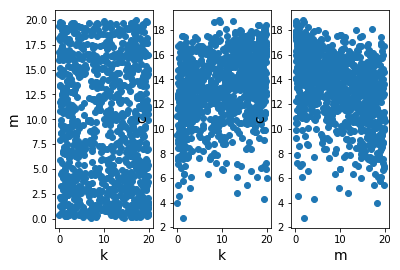

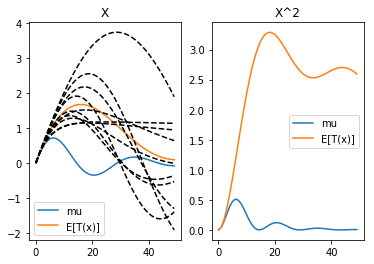

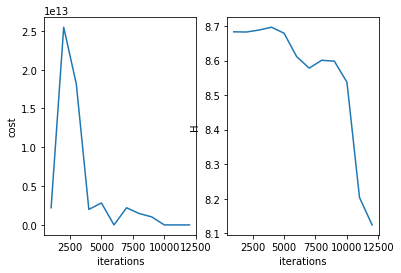

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 13000 
H 8.180154662899712
cost 229184229.3533371
system.D 3


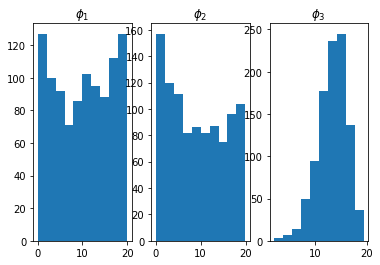

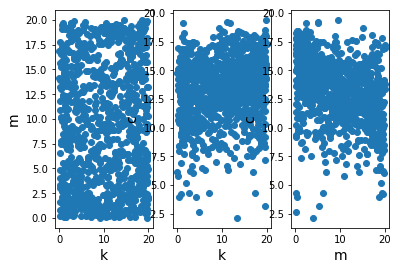

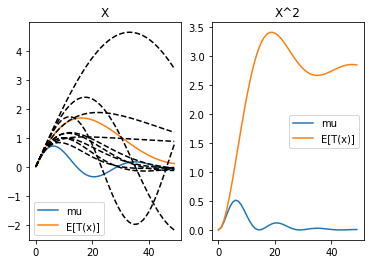

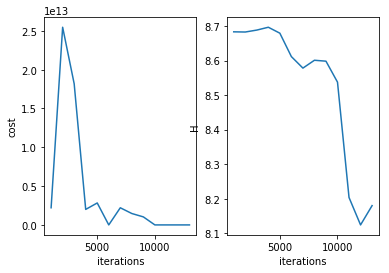

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 14000 
H 8.125819735862578
cost 207045745.0443459
system.D 3


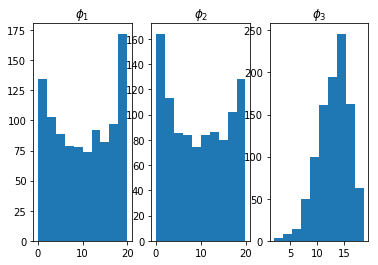

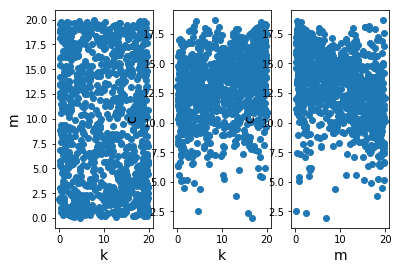

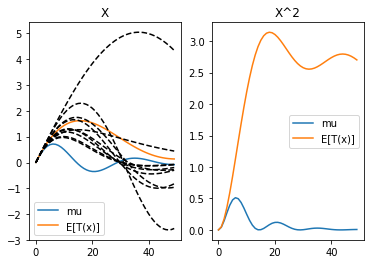

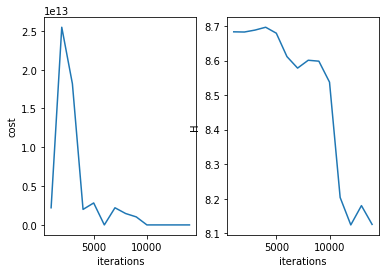

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 15000 
H 8.160253730504579
cost 196783464.13146853
system.D 3


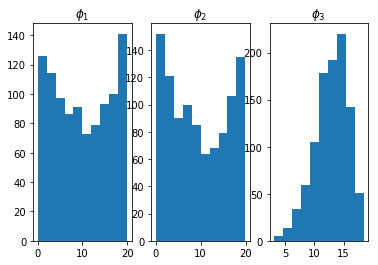

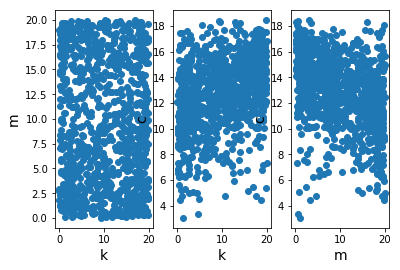

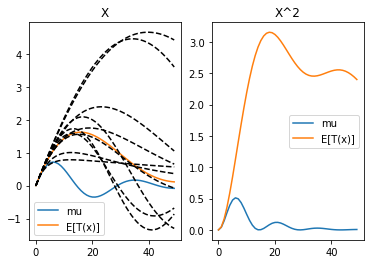

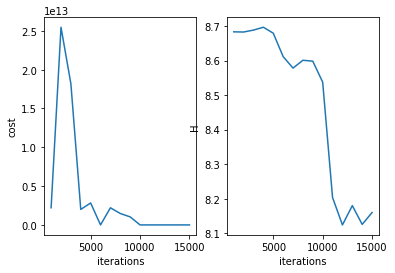

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 16000 
H 8.081342107717143
cost 200261697.38379538
system.D 3


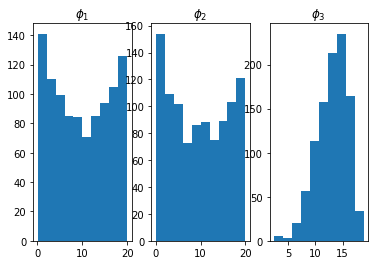

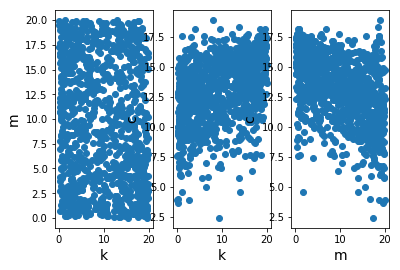

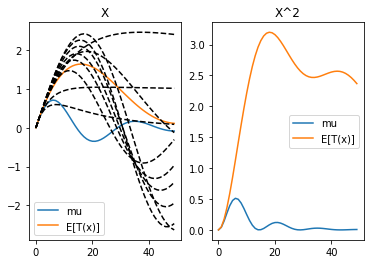

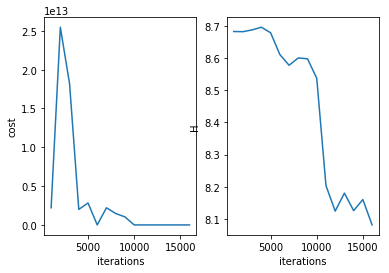

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 17000 
H 8.046674782875133
cost 207129285.08094802
system.D 3


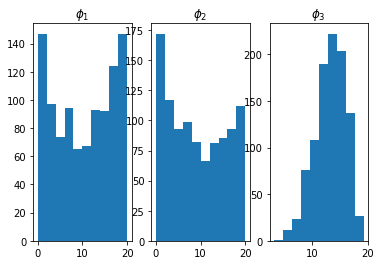

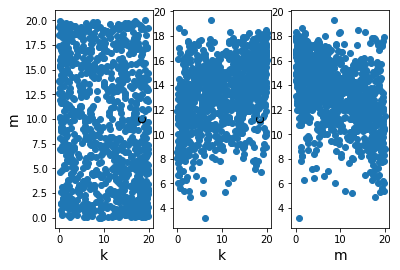

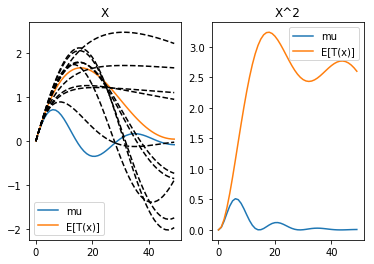

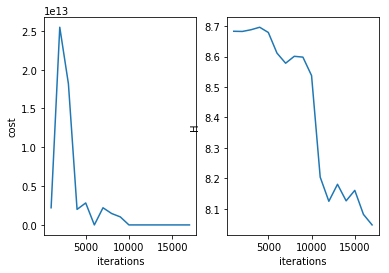

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 18000 
H 8.087281959209768
cost 208908050.9119212
system.D 3


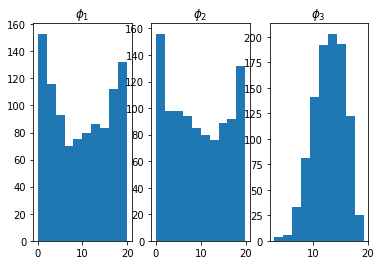

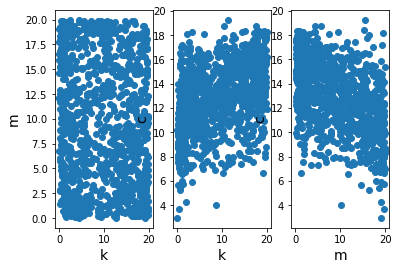

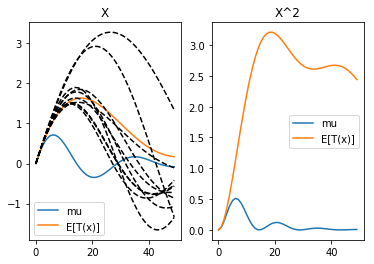

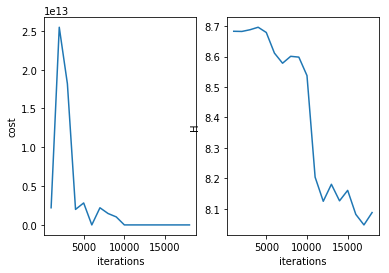

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 19000 
H 8.086148357912103
cost 161250788.44941497
system.D 3


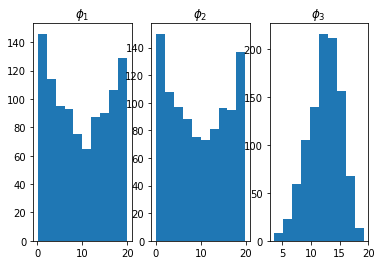

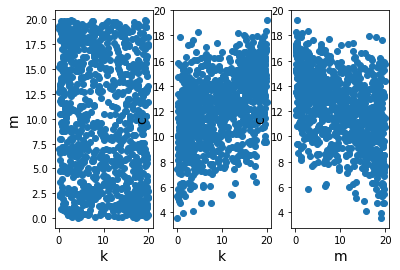

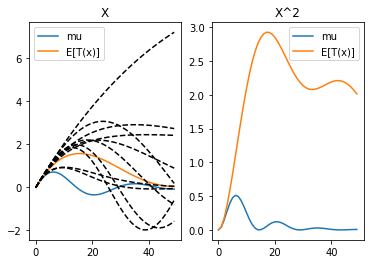

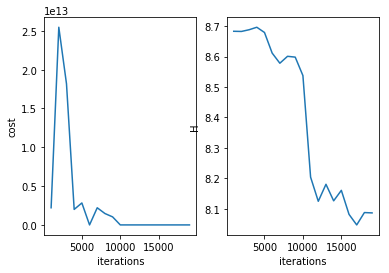

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 20000 
H 8.120851887705895
cost 151248772.0429333
system.D 3


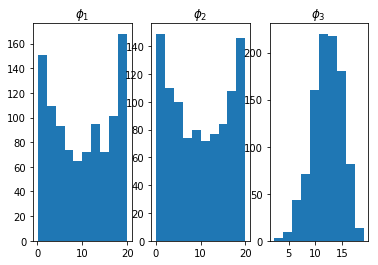

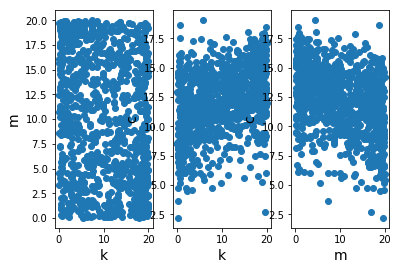

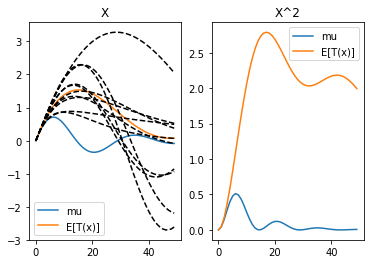

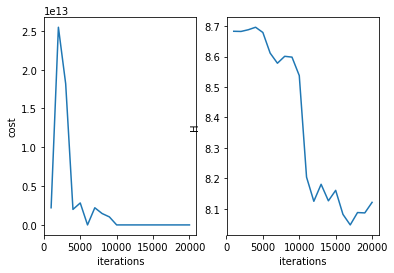

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 3
resetting optimizer
aug lag it 2
lambda [ 0.00000000e+00  1.34933214e+04  3.65011893e+04  7.69293528e+04
  1.39719411e+05  2.27199207e+05  3.39348909e+05  4.74109249e+05
  6.27737789e+05  7.95199949e+05  9.70577155e+05  1.14747371e+06
  1.31940492e+06  1.48015091e+06  1.62406338e+06  1.74631583e+06
  1.84309080e+06  1.91170171e+06  1.95064957e+06  1.95961822e+06
  1.93941403e+06  1.89185806e+06  1.81964026e+06  1.72614607e+06
  1.61526591e+06  1.49119834e+06  1.35825626e+06  1.22068518e+06
  1.08250057e+06  9.47350266e+05  8.18405554e+05  6.98283567e+05
  5.89001279e+05  4.91960270e+05  4.07959913e+05  3.37235563e+05
  2.79517497e+05  2.34105787e+05  1.99956019e+05  1.75770760e+05
  1.60091915e+05  1.51389547e+05  1.48143357e+05  1.48913738e+05
  1.52400128e+05  1.57485231e+05  1.63

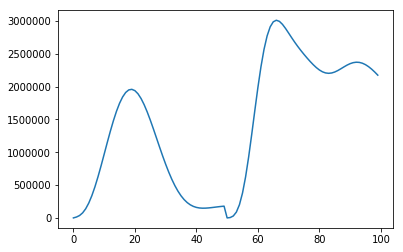

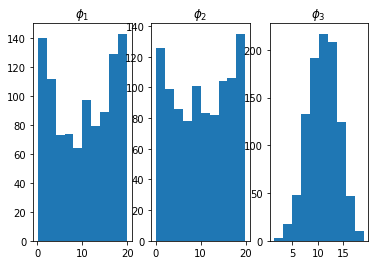

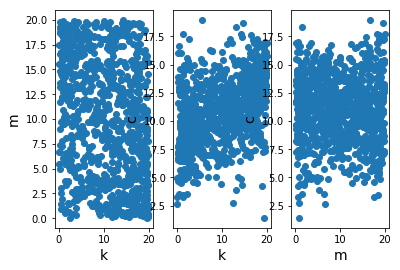

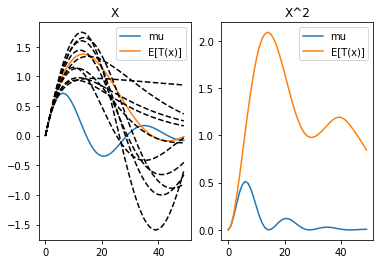

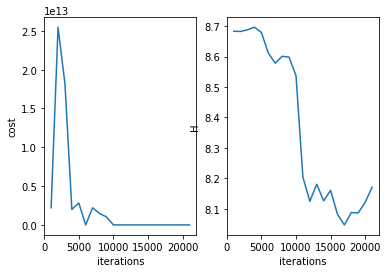

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 22000 
H 8.11422180573206
cost 610109686.6670865
system.D 3


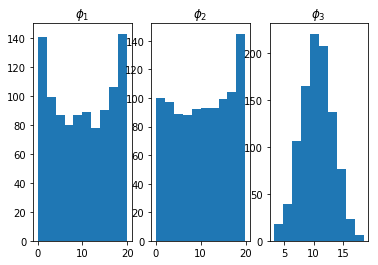

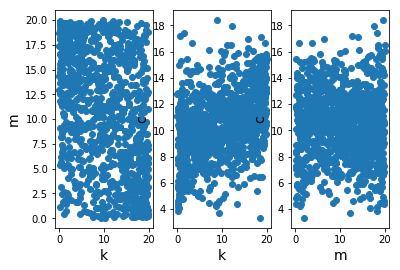

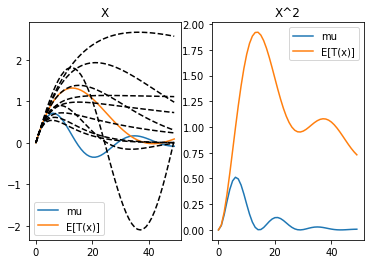

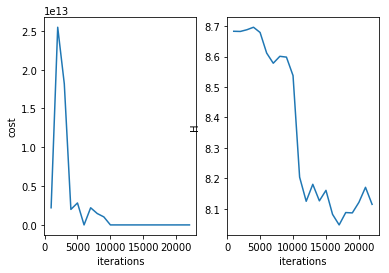

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 23000 
H 8.160143889802045
cost 558285891.3879786
system.D 3


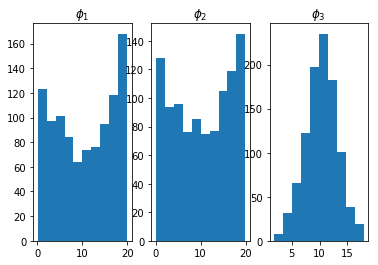

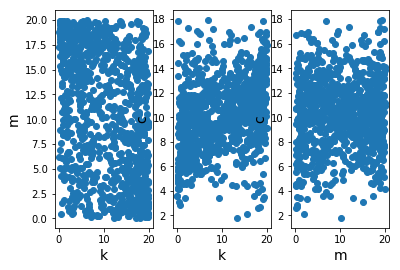

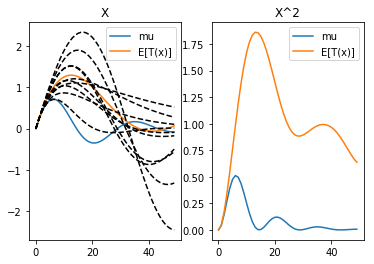

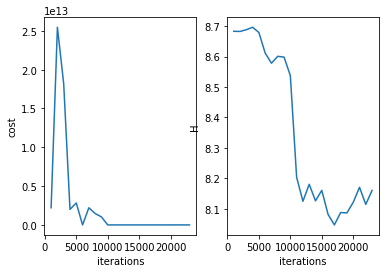

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 24000 
H 8.08651167127654
cost 733033900.9002714
system.D 3


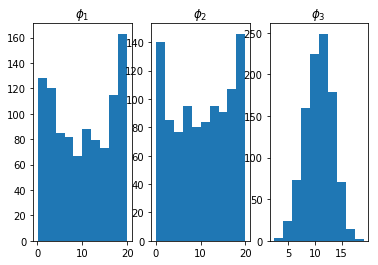

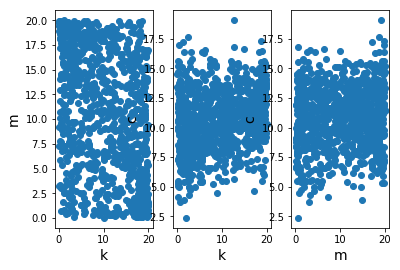

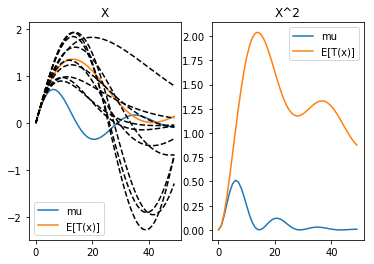

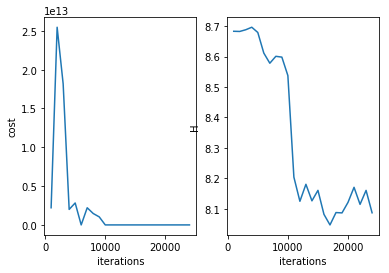

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 25000 
H 8.044770742281523
cost 549404697.6250807
system.D 3


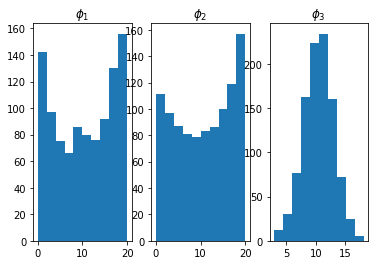

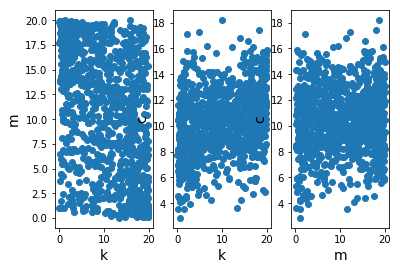

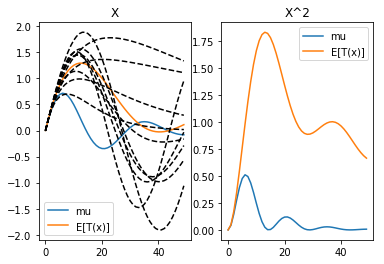

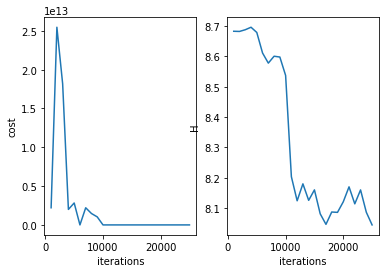

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 26000 
H 8.073059285356116
cost 435554335.74749064
system.D 3


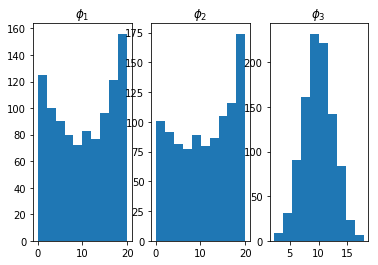

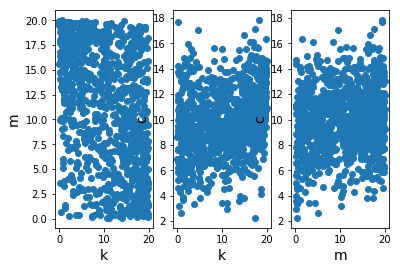

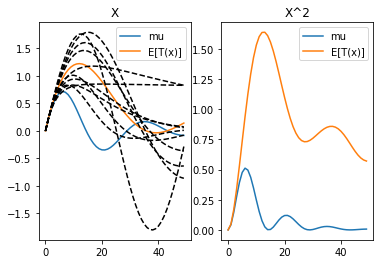

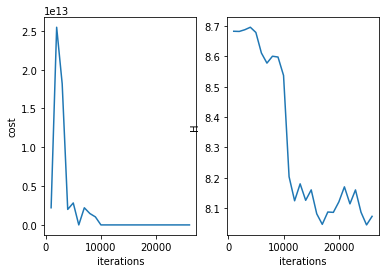

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 27000 
H 8.13854508267164
cost 375201702.8270659
system.D 3


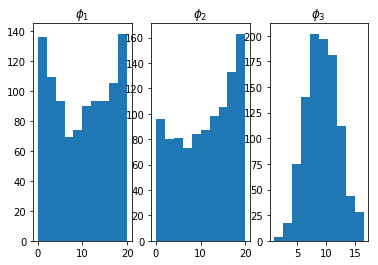

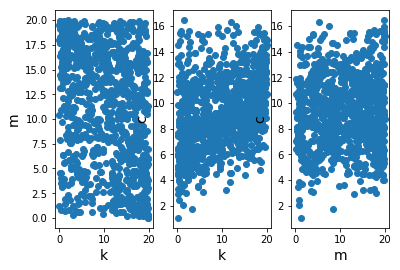

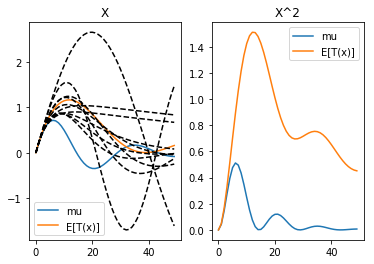

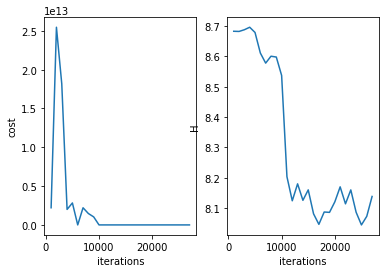

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 28000 
H 8.068389218714442
cost 200773921.5880217
system.D 3


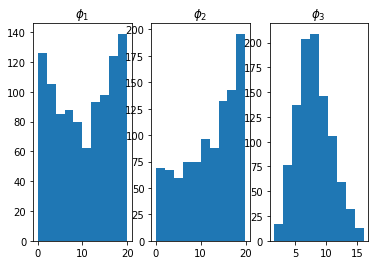

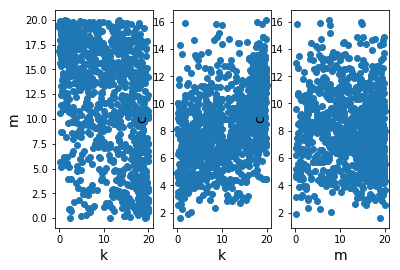

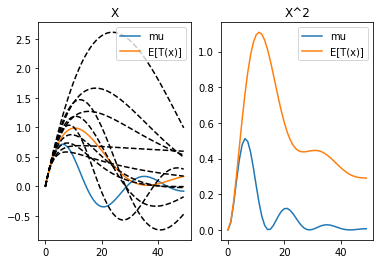

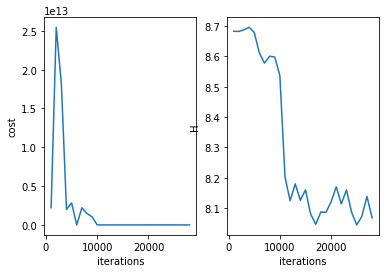

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 29000 
H 7.993042217405659
cost 284234197.0934723
system.D 3


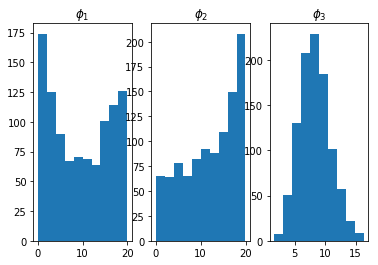

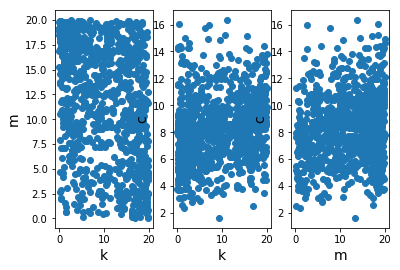

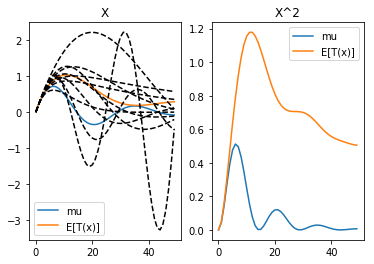

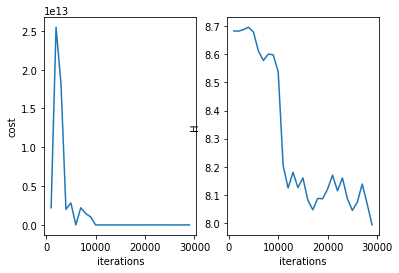

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 30000 
H 7.979564303262325
cost 278547279.86751187
system.D 3


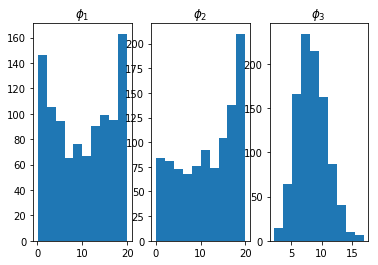

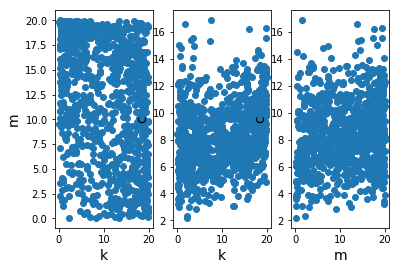

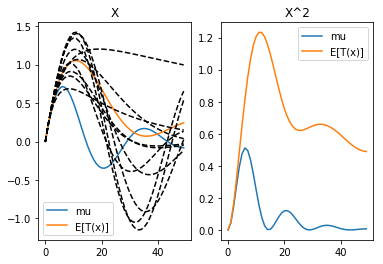

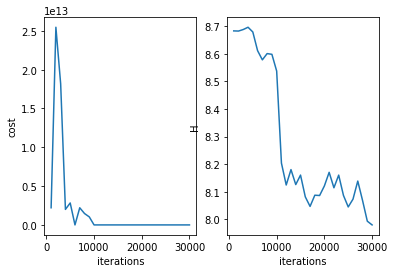

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 4
resetting optimizer
aug lag it 3
lambda [ 0.00000000e+00  1.36159879e+05  2.46901667e+05  4.36825019e+05
  7.75604128e+05  1.30233861e+06  2.02951878e+06  2.94708226e+06
  4.02666301e+06  5.22598471e+06  6.49328178e+06  7.77160242e+06
  9.00284438e+06  1.01313858e+07  1.11071962e+07  1.18883403e+07
  1.24428222e+07  1.27497478e+07  1.27998167e+07  1.25951849e+07
  1.21487630e+07  1.14830359e+07  1.06285027e+07  9.62184734e+06
  8.50394788e+06  7.31783580e+06  6.10670423e+06  4.91205551e+06
  3.77206285e+06  2.72020429e+06  1.78420937e+06  9.85340747e+05
  3.38015502e+05 -1.50245289e+05 -4.78564148e+05 -6.52189172e+05
 -6.81756373e+05 -5.82384353e+05 -3.72656243e+05 -7.35440626e+04
  2.92671751e+05  7.03439414e+05  1.13688762e+06  1.57265794e+06
  1.99259216e+06  2.38125785e+06  2.72

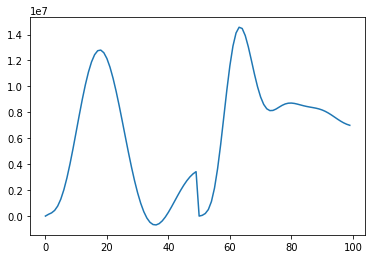

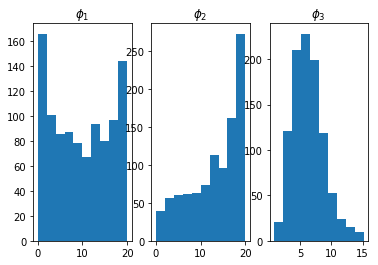

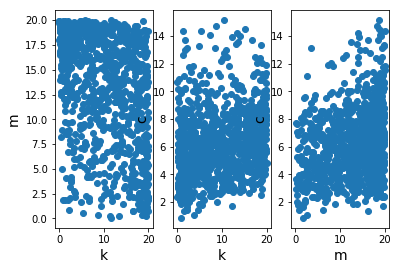

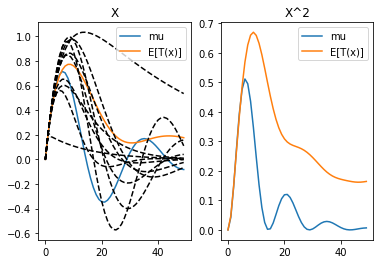

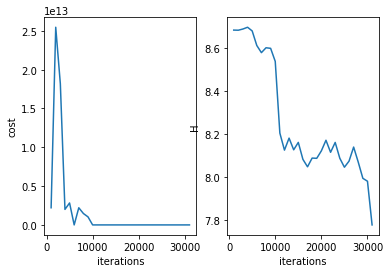

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 32000 
H 7.817229433015211
cost 793397172.7449534
system.D 3


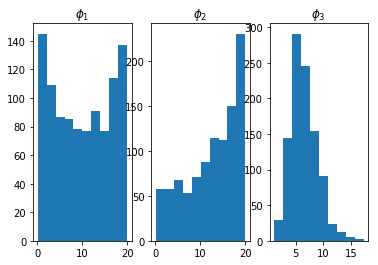

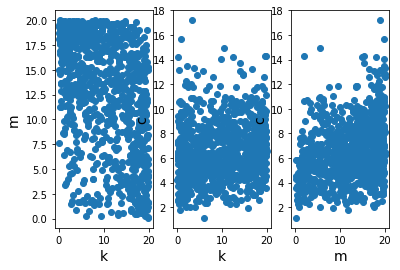

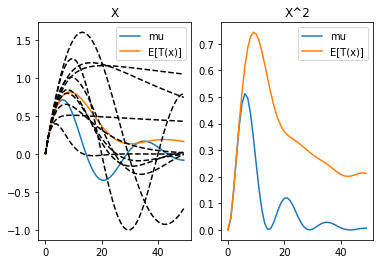

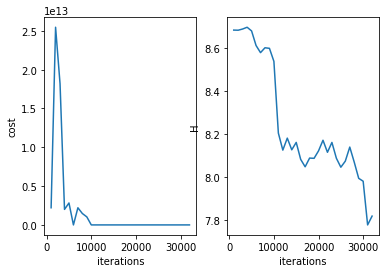

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 33000 
H 7.755591032766428
cost 849219918.192596
system.D 3


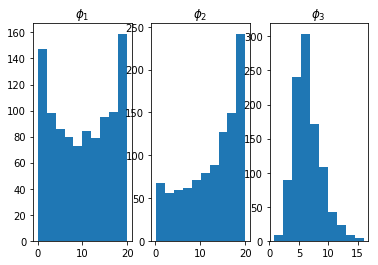

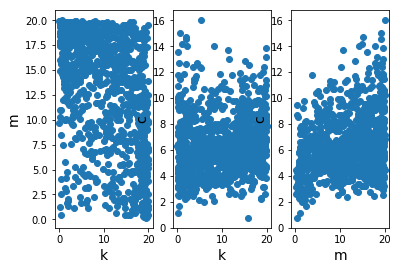

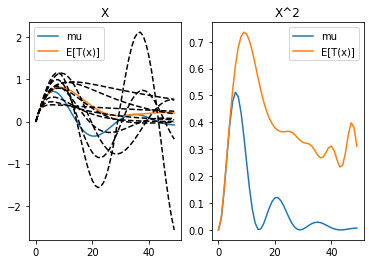

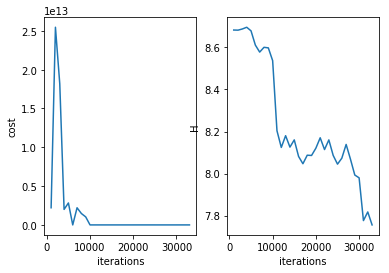

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 34000 
H 7.745271684552126
cost 752197683.6073163
system.D 3


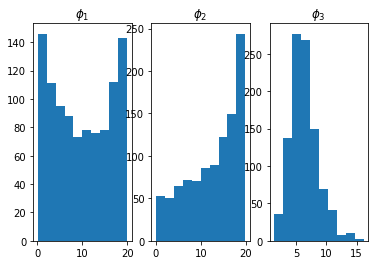

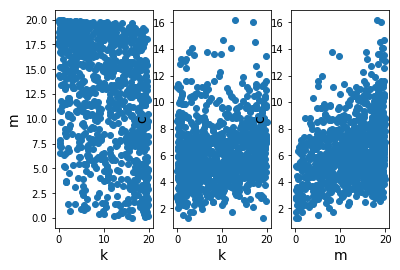

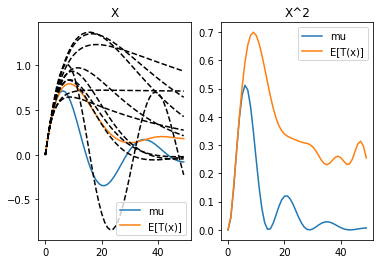

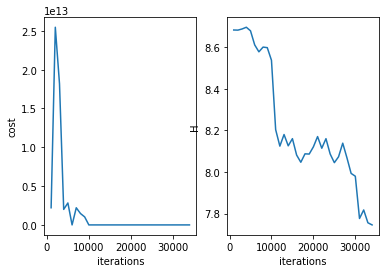

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 35000 
H 7.7140814036264205
cost 462512643.11587155
system.D 3


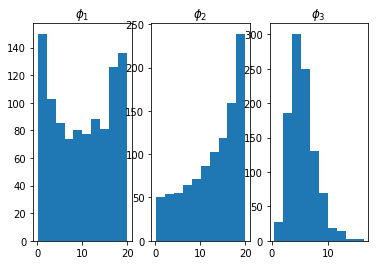

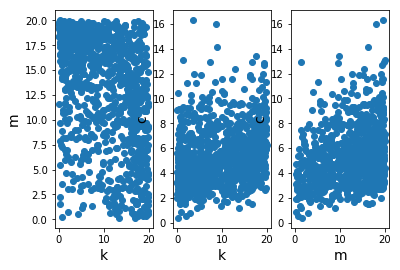

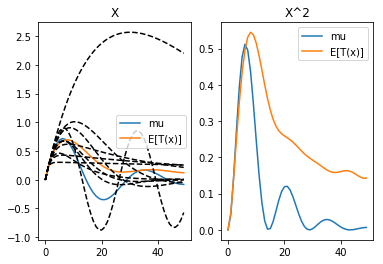

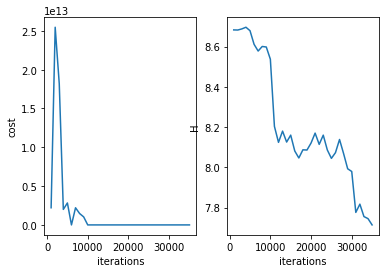

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 36000 
H 7.614191687055312
cost 554019999.0357006
system.D 3


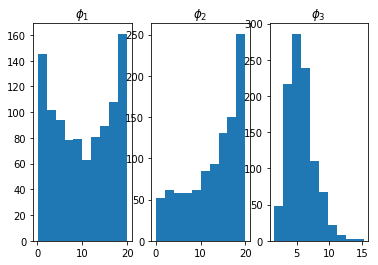

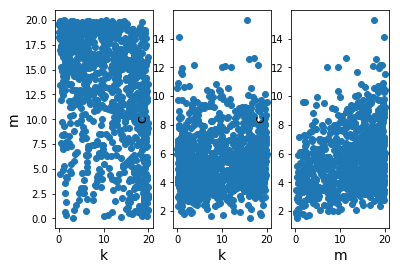

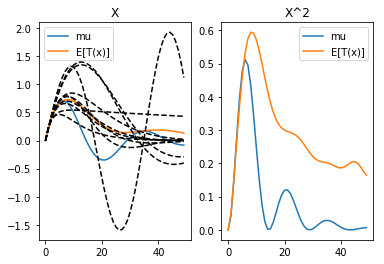

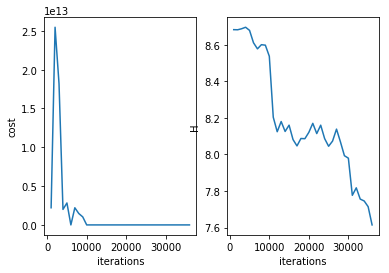

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 37000 
H 7.619523912351352
cost 608192102.3304172
system.D 3


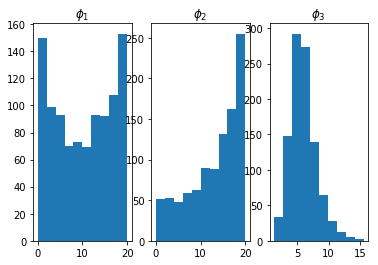

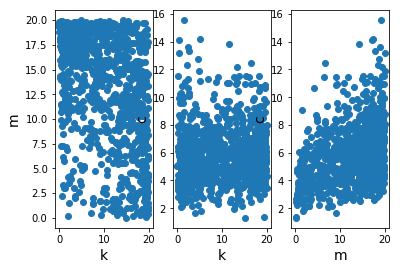

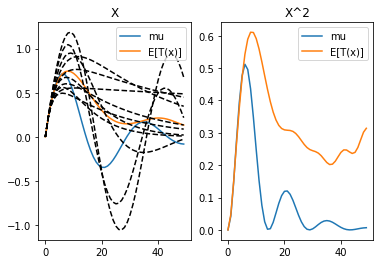

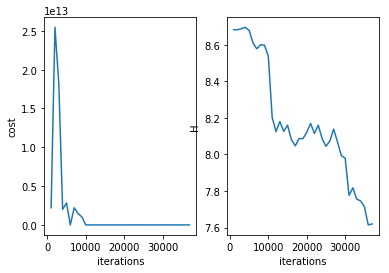

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 38000 
H 7.677631744647446
cost 736254471.2437788
system.D 3


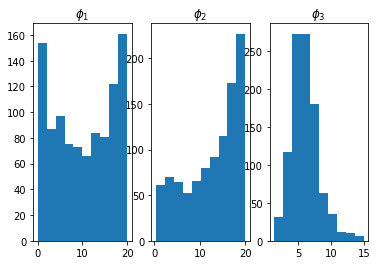

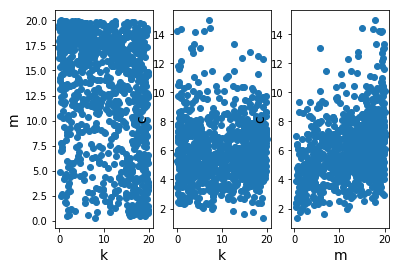

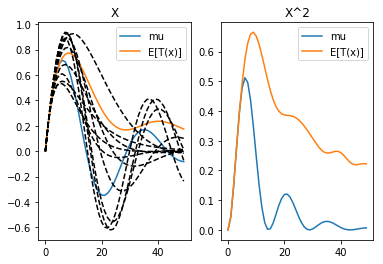

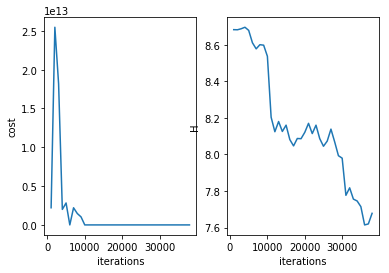

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 39000 
H 7.563521117872505
cost 611787634.2200626
system.D 3


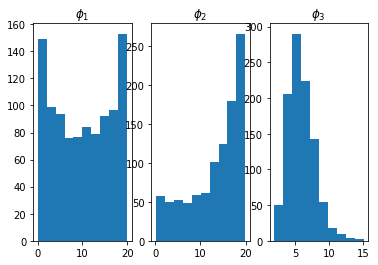

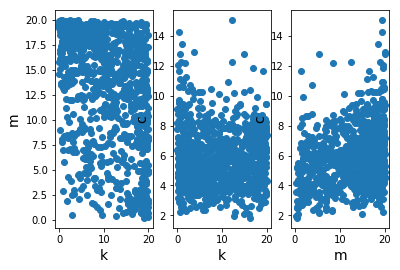

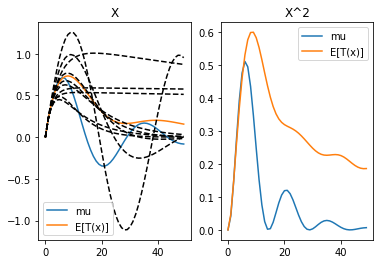

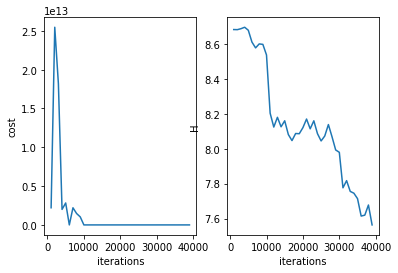

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 40000 
H 7.502816355590813
cost 426519884.310868
system.D 3


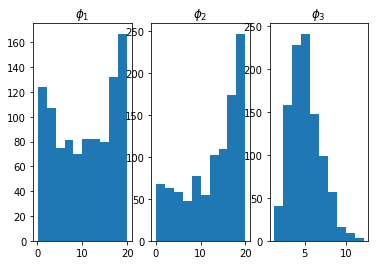

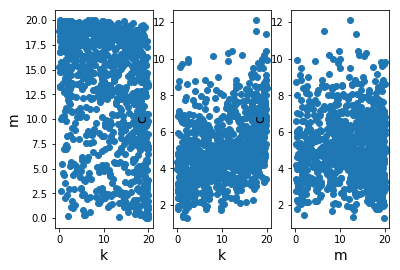

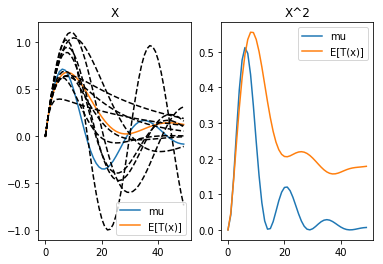

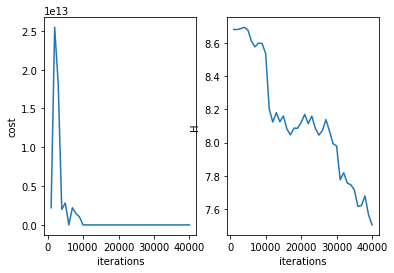

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 5
resetting optimizer
aug lag it 4
lambda [ 0.00000000e+00  1.36282546e+06 -7.30904315e+05 -3.41928401e+06
 -5.26231215e+06 -5.44415911e+06 -3.60381365e+06  3.15958247e+05
  6.13594555e+06  1.35125052e+07  2.19890590e+07  3.10469878e+07
  4.01480182e+07  4.87722750e+07  5.64493210e+07  6.27828660e+07
  6.74683246e+07  7.03035089e+07  7.11925825e+07  7.01438810e+07
  6.72623171e+07  6.27373234e+07  5.68273759e+07  4.98422219e+07
  4.21239275e+07  3.40278196e+07  2.59042938e+07  1.80823285e+07
  1.08553800e+07  4.47015287e+06 -8.81450842e+05 -5.06708337e+06
 -8.01546142e+06 -9.71484556e+06 -1.02088307e+07 -9.58988998e+06
 -7.99118399e+06 -5.57718338e+06 -2.53366023e+06  9.42419474e+05
  4.65261578e+06  8.40592682e+06  1.20265527e+07  1.53602602e+07
  1.82791888e+07  2.06850297e+07  2.25

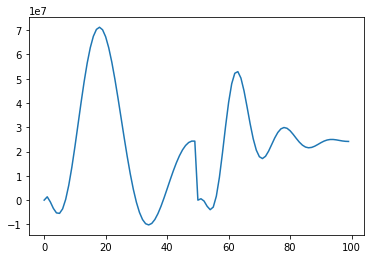

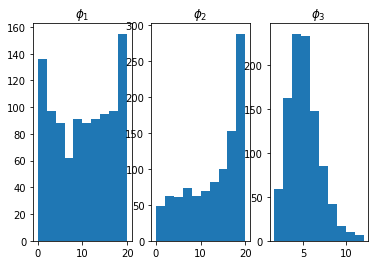

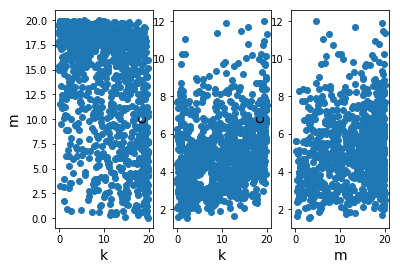

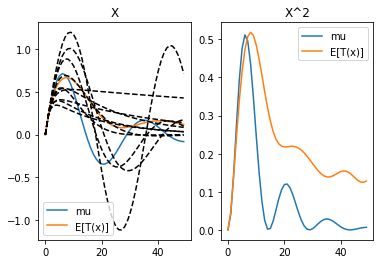

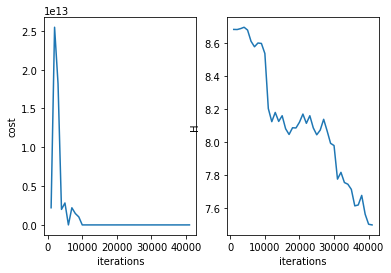

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 42000 
H 7.498203225848676
cost 2743586306.418097
system.D 3


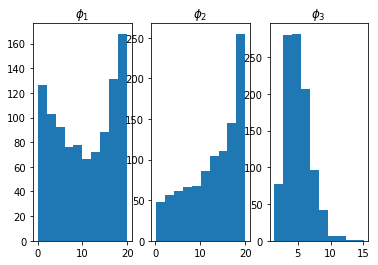

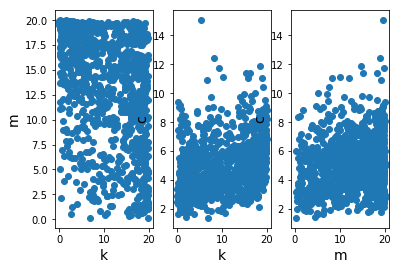

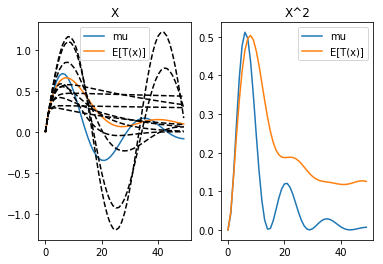

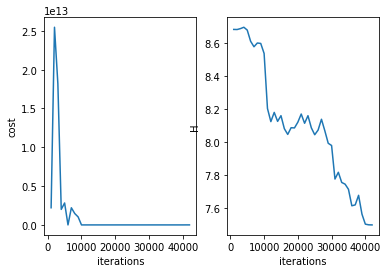

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 43000 
H 7.487101992145259
cost 2805619590.5751925
system.D 3


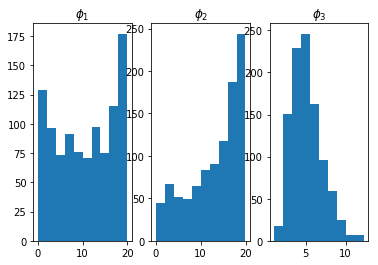

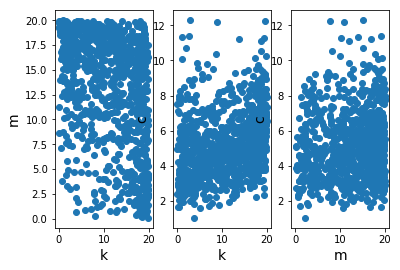

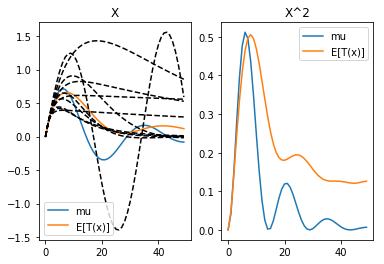

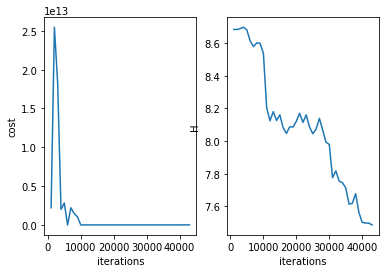

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 44000 
H 7.494955686363637
cost 2937365694.49068
system.D 3


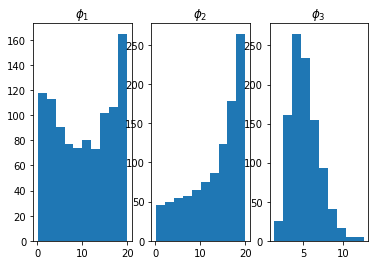

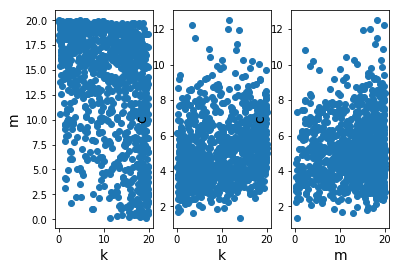

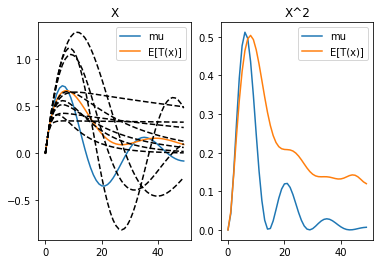

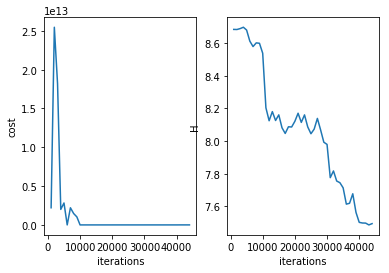

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 45000 
H 7.494920098339484
cost 3372999694.383125
system.D 3


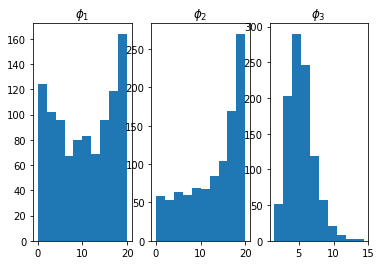

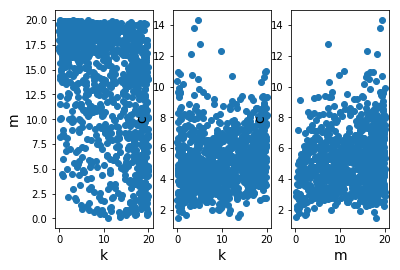

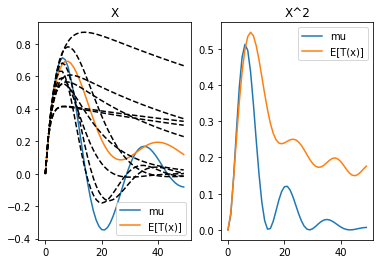

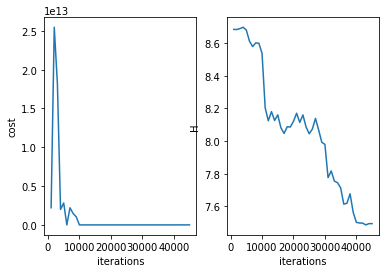

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 46000 
H 7.4936814429889465
cost 3689623855.642276
system.D 3


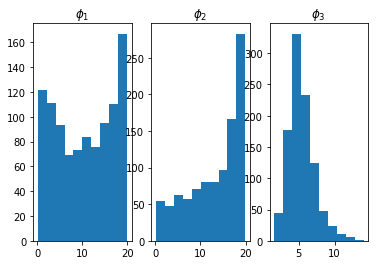

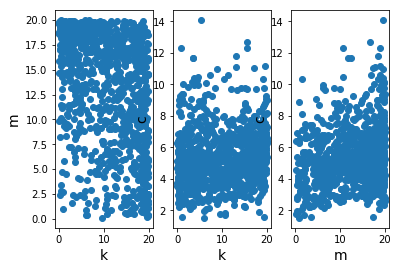

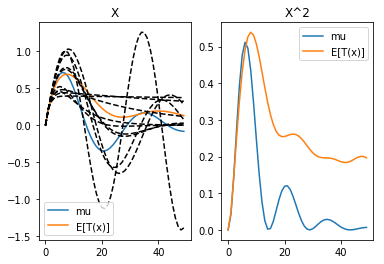

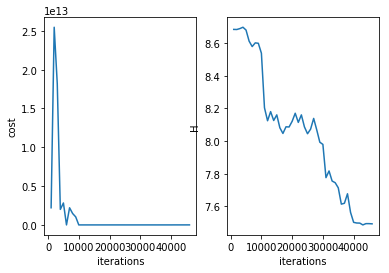

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 47000 
H 7.448399824901124
cost 3786835404.0812893
system.D 3


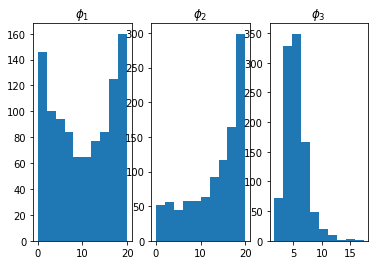

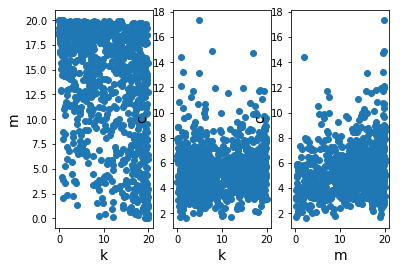

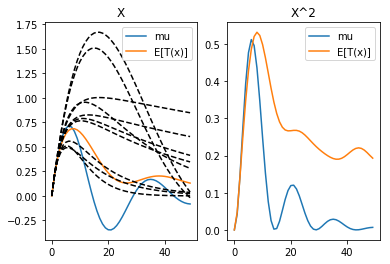

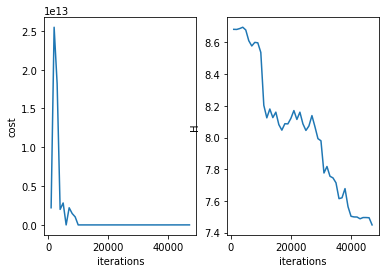

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 48000 
H 7.537723757495542
cost 3219914199.70566
system.D 3


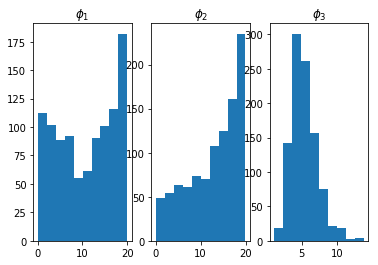

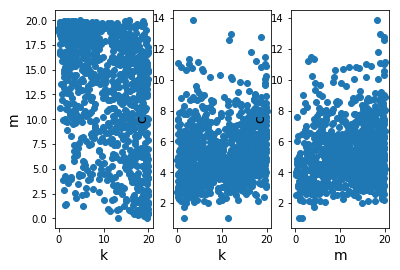

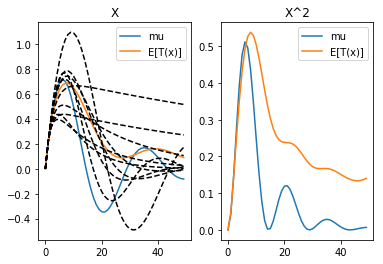

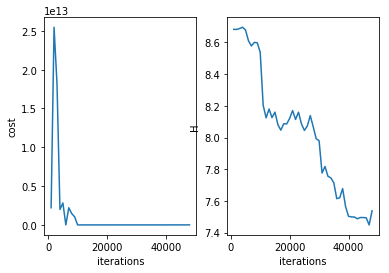

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 49000 
H 7.463117545399238
cost 3015185474.2429113
system.D 3


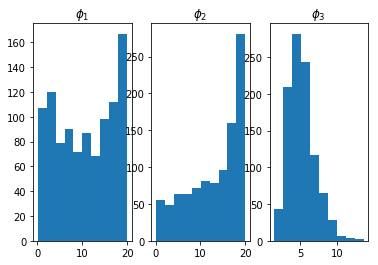

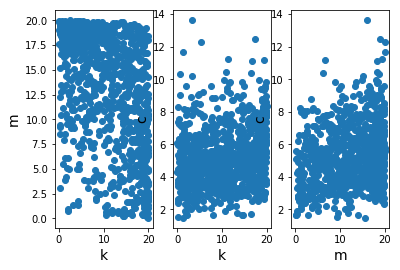

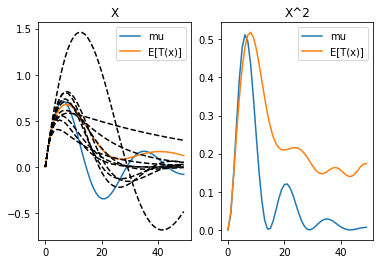

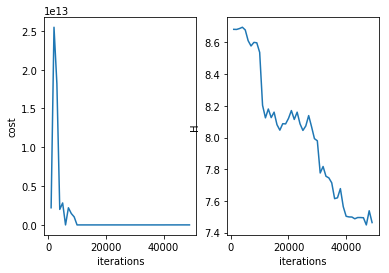

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 50000 
H 7.487856561205271
cost 3159557957.7666163
system.D 3


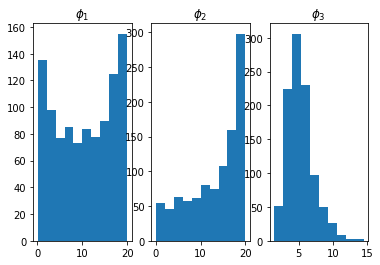

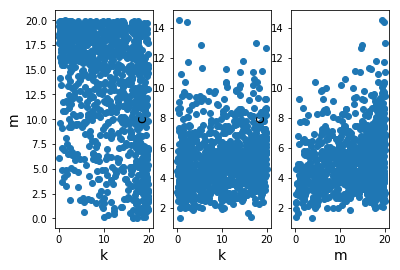

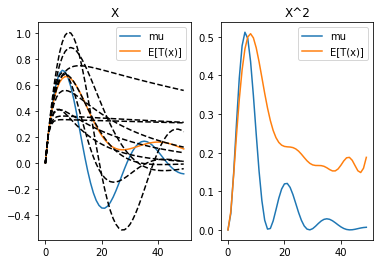

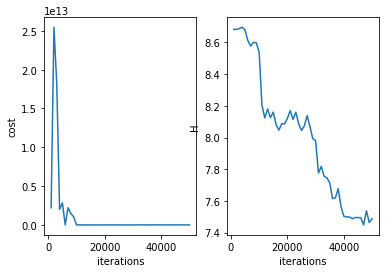

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 6
resetting optimizer
aug lag it 5
lambda [ 0.00000000e+00  1.36294813e+07 -8.38267976e+06 -3.95018252e+07
 -6.45560111e+07 -7.48037335e+07 -6.59224443e+07 -3.67845092e+07
  1.13591952e+07  7.55437465e+07  1.51645016e+08  2.34870691e+08
  3.20187214e+08  4.02686766e+08  4.77889140e+08  5.41976891e+08
  5.91962214e+08  6.25787189e+08  6.42361103e+08  6.41541058e+08
  6.24063816e+08  5.91438220e+08  5.45808257e+08  4.89797009e+08
  4.26341357e+08  3.58526530e+08  2.89428420e+08  2.21970236e+08
  1.58798562e+08  1.02182423e+08  5.39375111e+07  1.53764645e+07
 -1.27150158e+07 -3.00773563e+07 -3.69534811e+07 -3.40448243e+07
 -2.24499067e+07 -3.58877042e+06  2.08831246e+07  4.91676789e+07
  7.94195274e+07  1.09839788e+08  1.38763912e+08  1.64739474e+08
  1.86590006e+08  2.03461529e+08  2.14

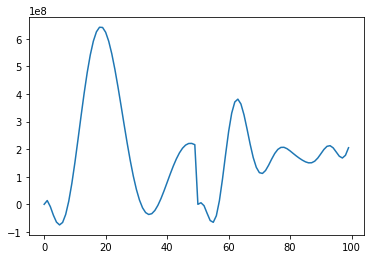

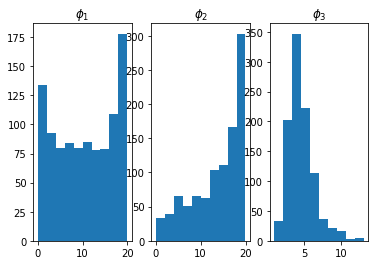

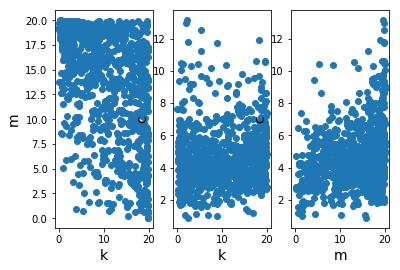

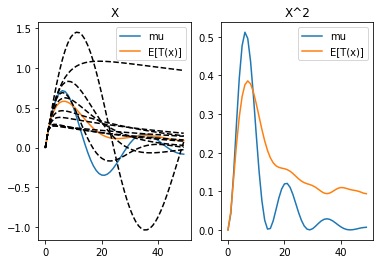

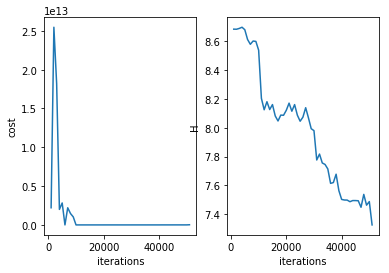

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 52000 
H 7.322276610927349
cost 20516923915.654057
system.D 3


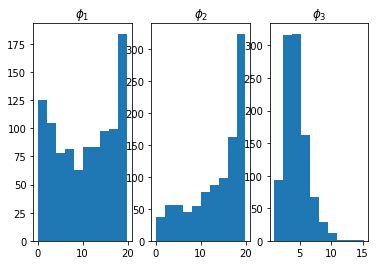

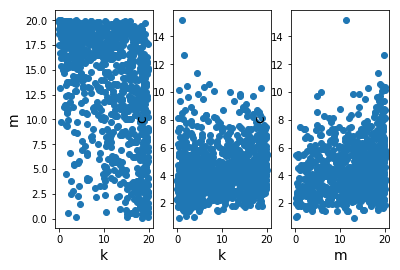

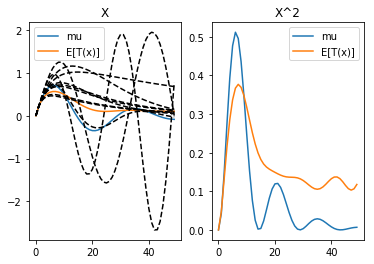

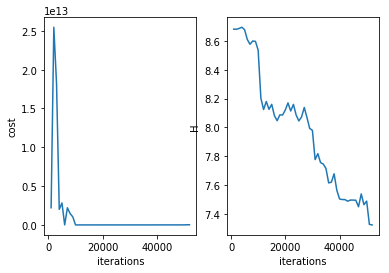

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 53000 
H 7.250122050813523
cost 23025377829.742775
system.D 3


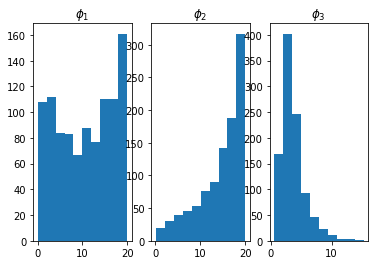

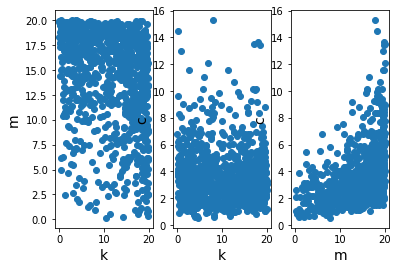

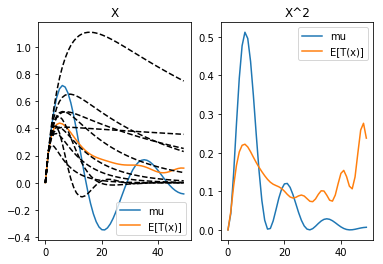

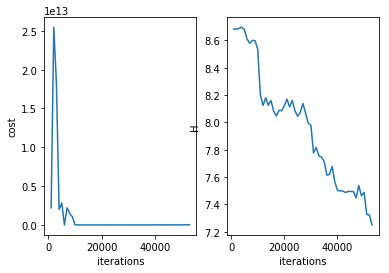

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 54000 
H 7.175423609675283
cost 33298329169.71708
system.D 3


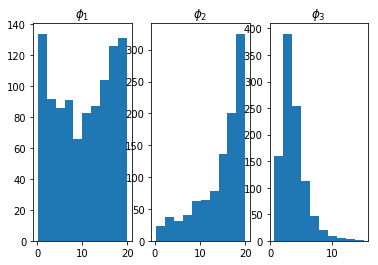

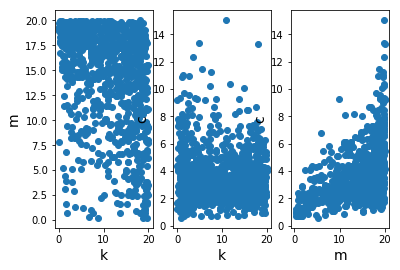

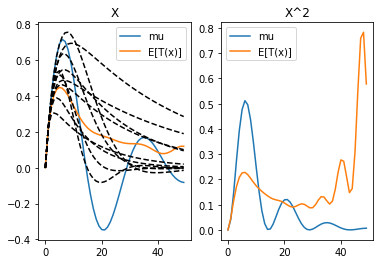

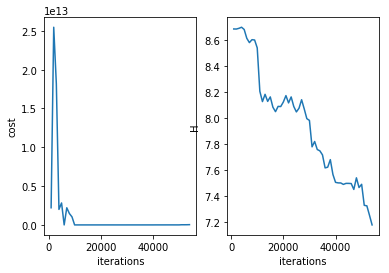

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 55000 
H 7.142295432820496
cost 23218316829.604008
system.D 3


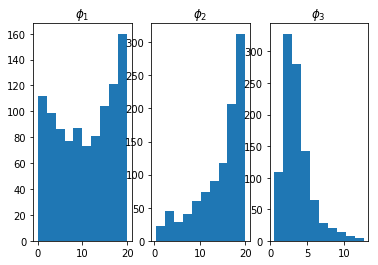

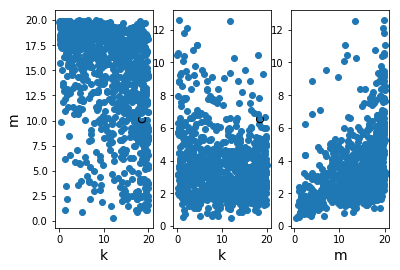

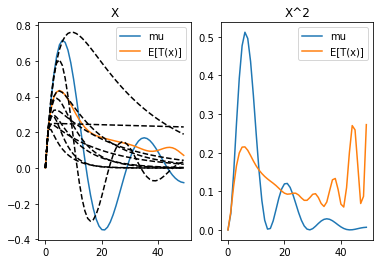

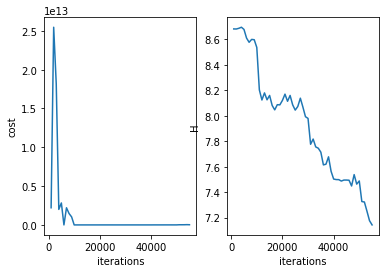

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 56000 
H 7.227408453227251
cost 23402737668.893078
system.D 3


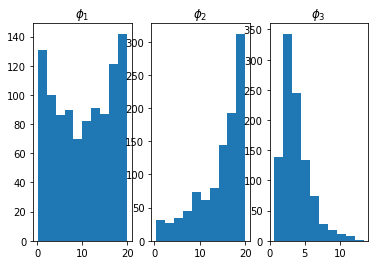

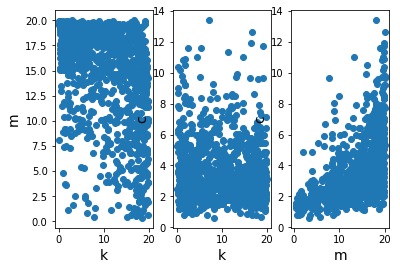

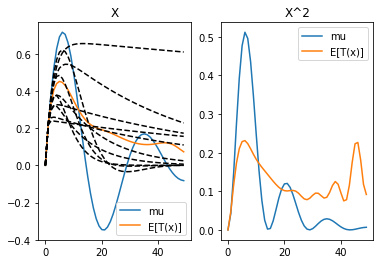

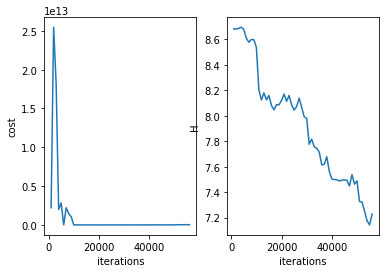

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 57000 
H 7.301574675257464
cost 18477026017.798424
system.D 3


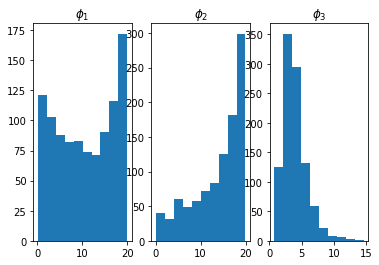

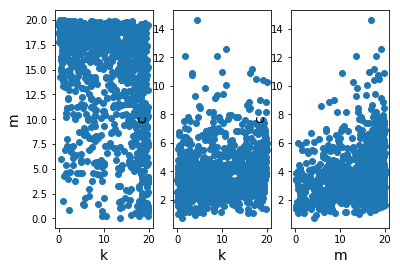

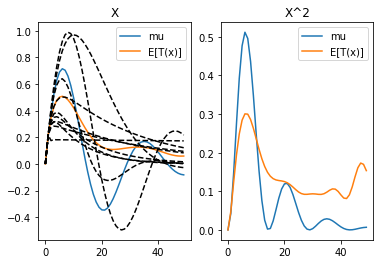

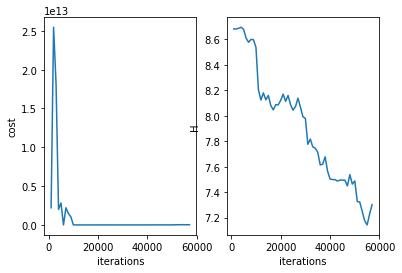

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 58000 
H 7.251430046289636
cost 19117269416.548145
system.D 3


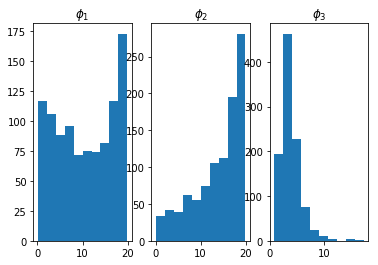

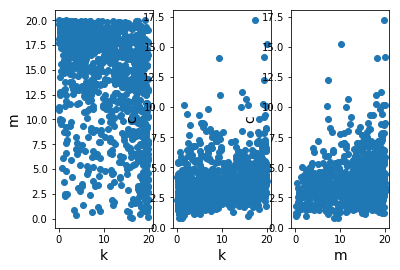

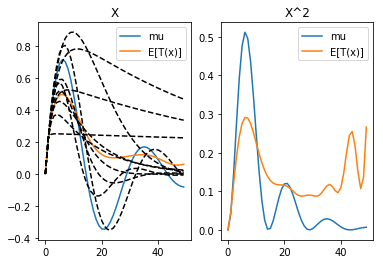

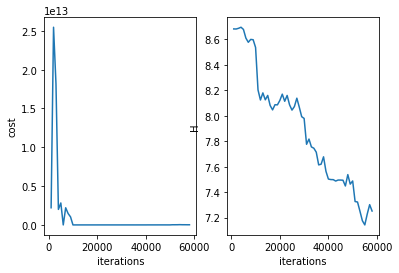

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 59000 
H 7.275412829355115
cost 19178906779.22353
system.D 3


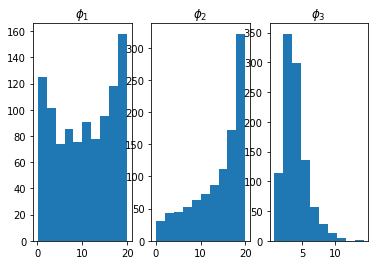

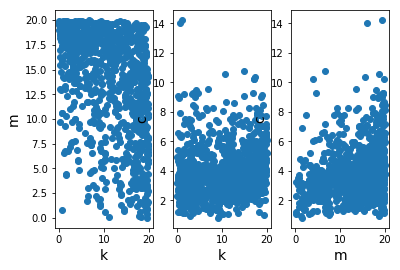

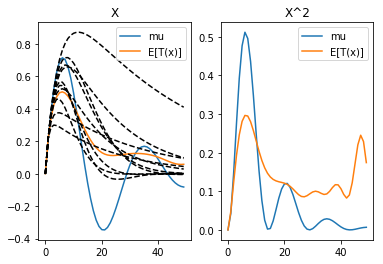

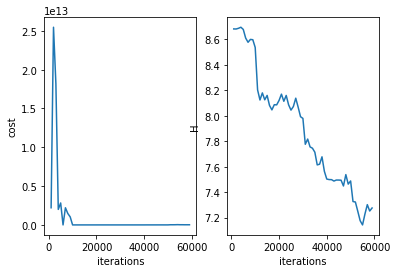

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 60000 
H 7.329369383813463
cost 1.8555306032906835e+17
system.D 3


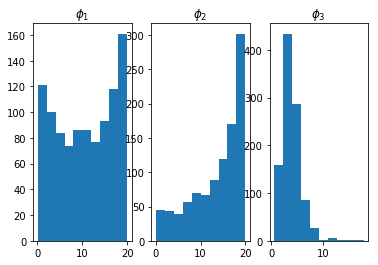

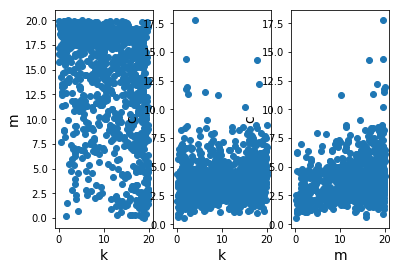

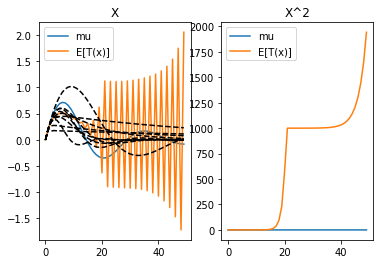

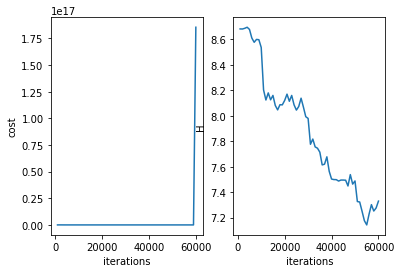

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 7
resetting optimizer
aug lag it 6
lambda [ 0.00000000e+00  1.36296039e+08 -3.66716210e+08 -9.87203767e+08
 -1.57233286e+09 -1.95583360e+09 -2.16345001e+09 -2.06433357e+09
 -1.83609079e+09 -1.24945632e+09 -7.32380880e+08  2.68374529e+08
  7.77561126e+08  2.18357233e+09  2.19885019e+09  4.28091527e+09
  2.91443230e+09  6.66080297e+09  2.01462851e+09  1.01513691e+10
 -2.24665855e+09  1.53040098e+10 -5.07155790e+09  1.46680863e+10
 -5.99770893e+09  1.36185775e+10 -7.24570778e+09  1.23996382e+10
 -8.57026218e+09  1.12667924e+10 -9.74761889e+09  1.04334748e+10
 -1.06259020e+10  1.00322051e+10 -1.11552052e+10  1.01024201e+10
 -1.13894228e+10  1.06086723e+10 -1.14624250e+10  1.14816220e+10
 -1.15522038e+10  1.26657143e+10 -1.18520702e+10  1.41570103e+10
 -1.25641611e+10  1.60237614e+10 -1.39

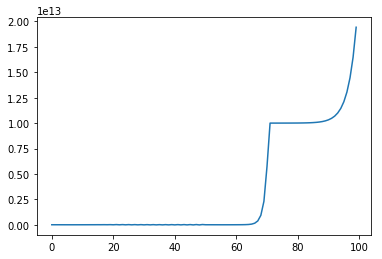

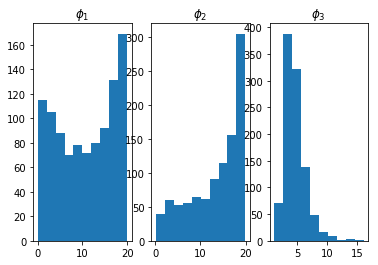

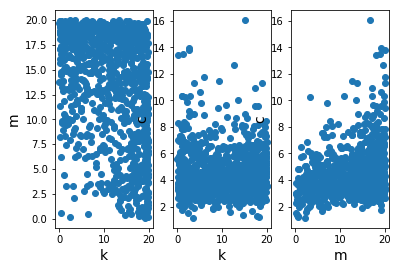

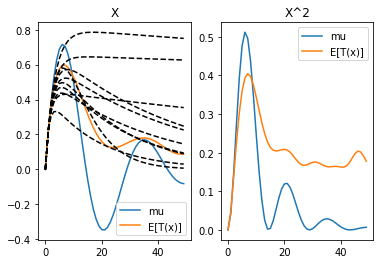

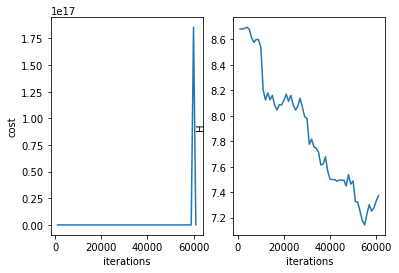

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 62000 
H 7.331496645077217
cost 33091413501606.195
system.D 3


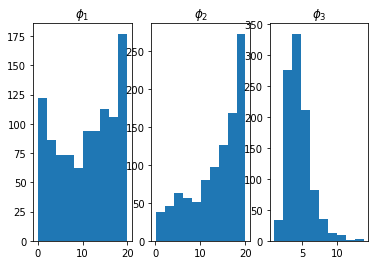

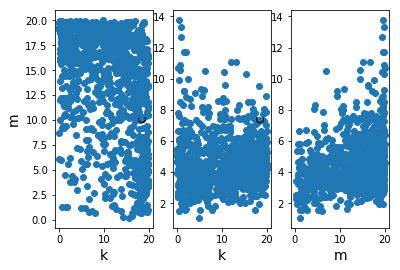

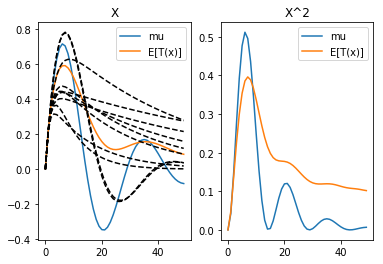

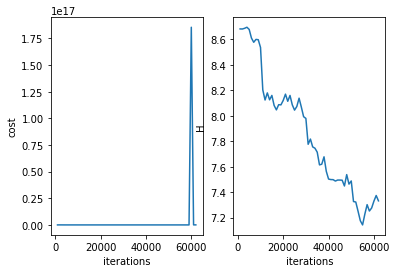

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 63000 
H 7.354545191838338
cost 30473283814856.438
system.D 3


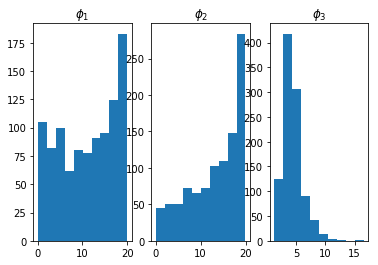

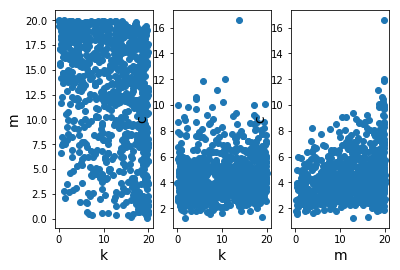

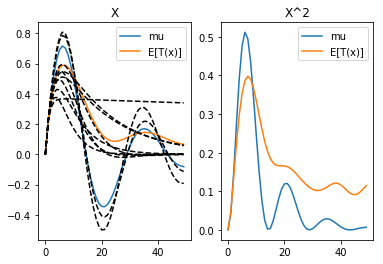

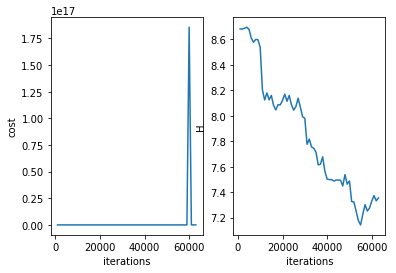

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 64000 
H 7.361620334331457
cost 35374793163331.34
system.D 3


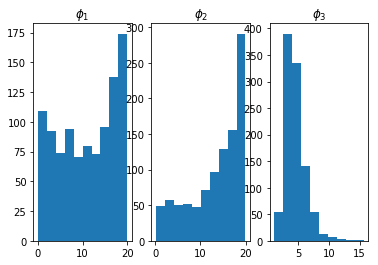

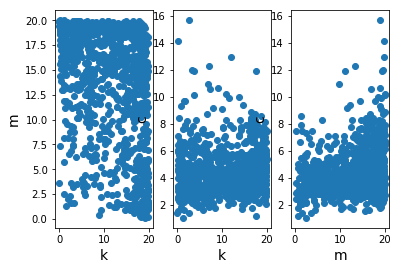

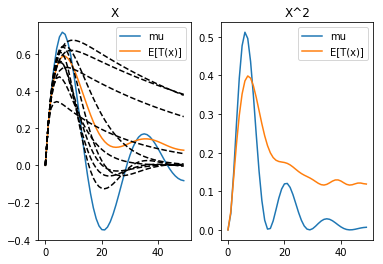

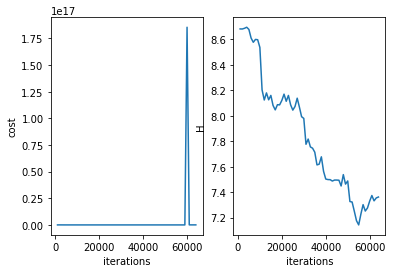

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 65000 
H 7.283741271566141
cost 34968554656414.53
system.D 3


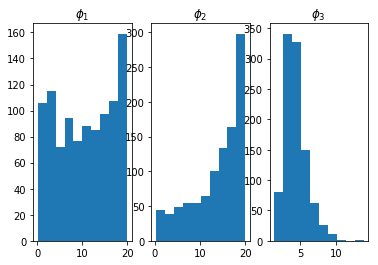

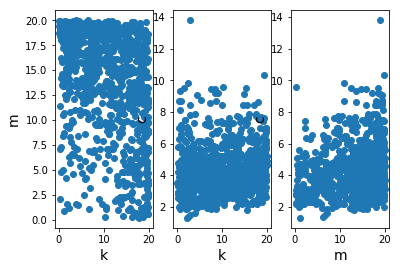

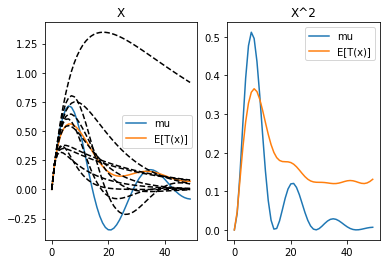

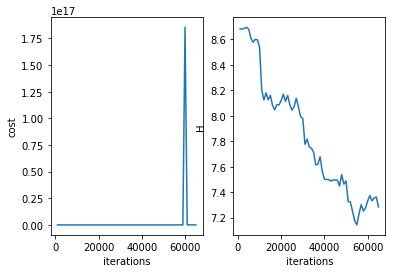

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 66000 
H 7.419253400176902
cost 47338377958947.5
system.D 3


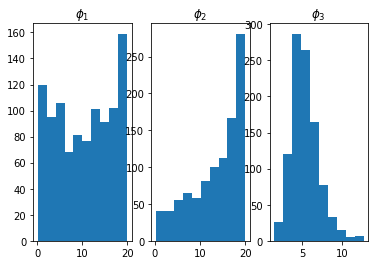

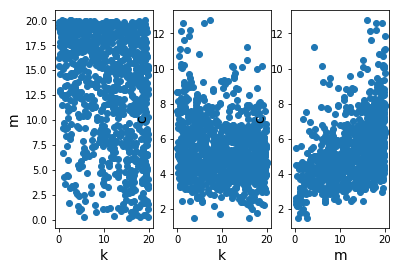

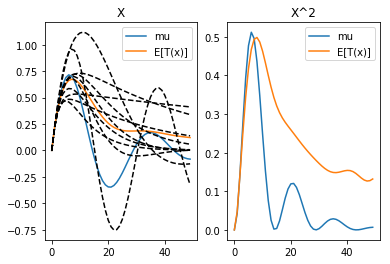

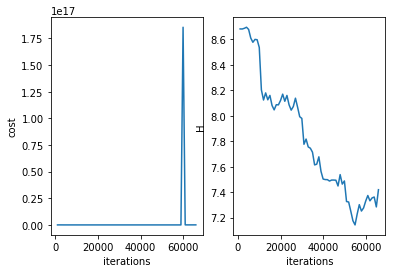

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 67000 
H 7.366968134432887
cost 64374445323415.33
system.D 3


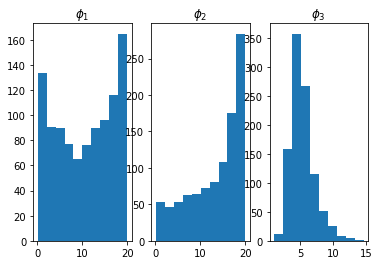

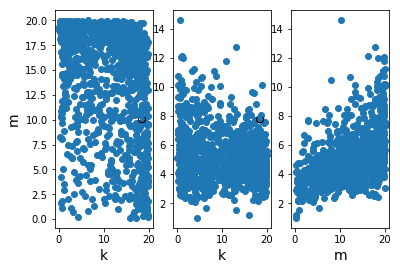

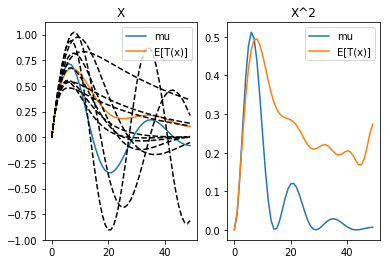

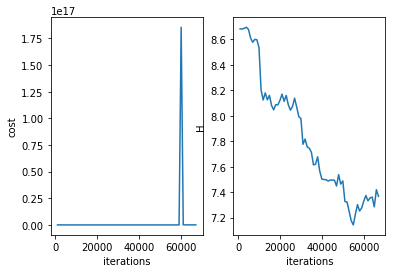

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 68000 
H 7.334803755063542
cost 53861586545489.2
system.D 3


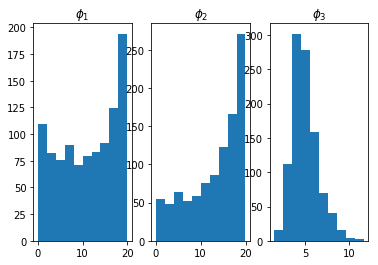

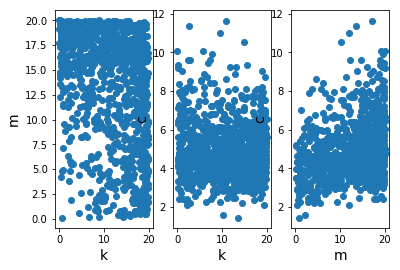

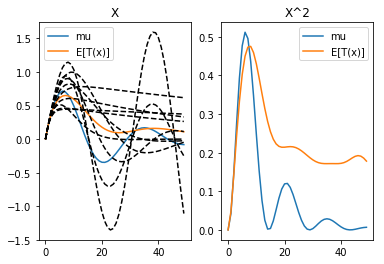

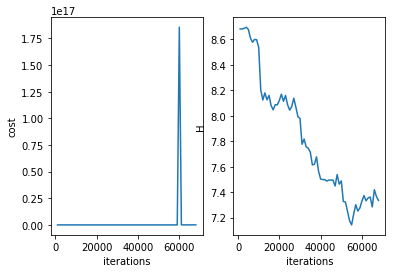

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 69000 
H 7.317856994938636
cost 37388137693818.6
system.D 3


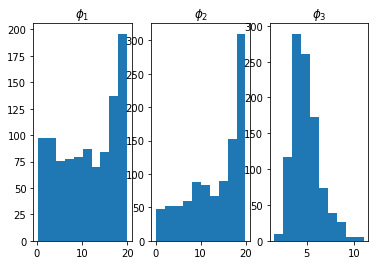

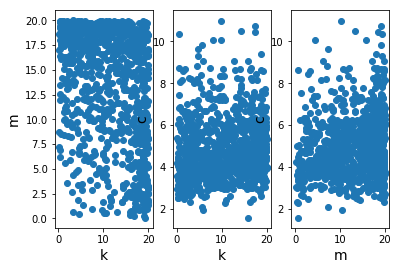

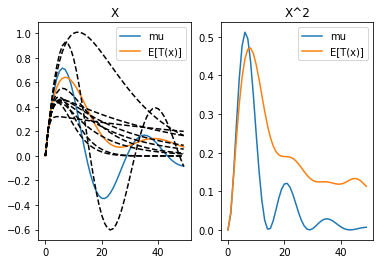

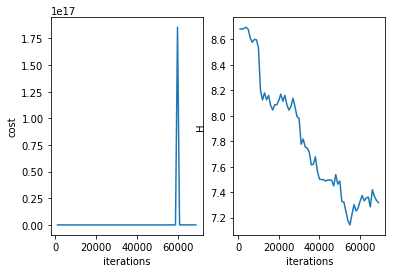

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 70000 
H 7.23367370933461
cost 35975726451303.78
system.D 3


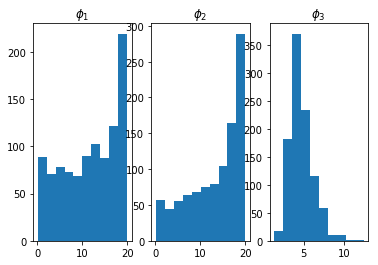

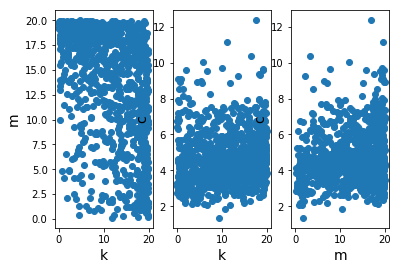

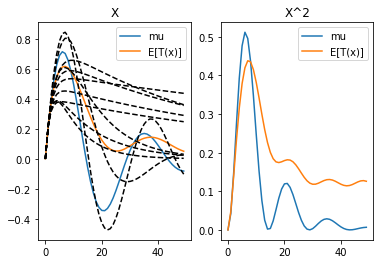

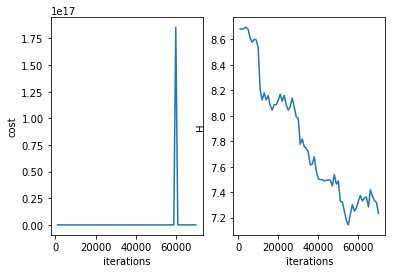

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 8
resetting optimizer
aug lag it 7
lambda [ 0.00000000e+00  1.36296162e+09 -1.59047412e+09 -5.79394893e+09
 -9.58774779e+09 -1.19265416e+10 -1.23833387e+10 -1.06822706e+10
 -7.08212720e+09 -1.59794064e+09  4.98756011e+09  1.28078342e+10
  2.04423428e+10  2.88423957e+10  3.53193534e+10  4.29873343e+10
  4.60607537e+10  5.29132898e+10  4.99379349e+10  5.82929850e+10
  4.47218109e+10  5.98372097e+10  3.59491387e+10  5.13249584e+10
  2.56955676e+10  4.00103444e+10  1.37643282e+10  2.81883256e+10
  2.37012681e+09  1.79082714e+10 -6.72138529e+09  1.06173202e+10
 -1.24678853e+10  6.98114751e+09 -1.46378495e+10  6.89264934e+09
 -1.37217408e+10  9.63928576e+09 -1.07138230e+10  1.41692478e+10
 -6.83498060e+09  1.93824815e+10 -3.27145751e+09  2.43789622e+10
 -9.88860064e+08  2.86213796e+10 -6.50

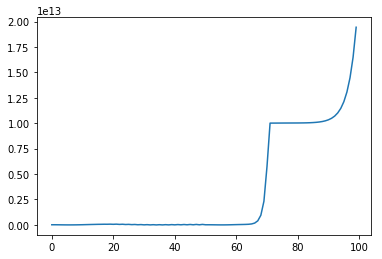

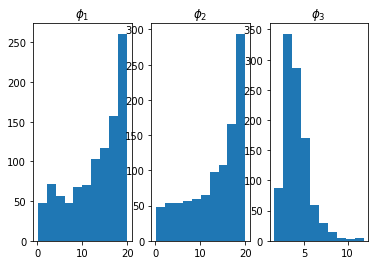

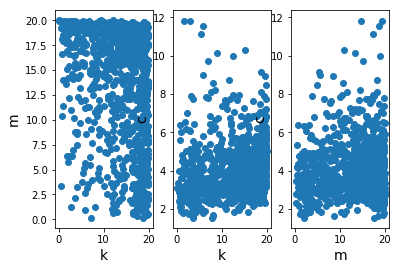

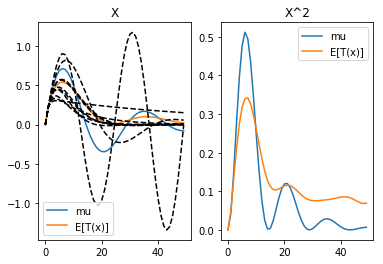

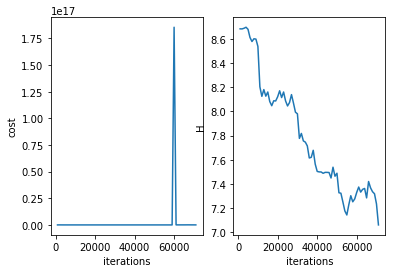

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 72000 
H 7.076350493983297
cost 20884576449269.402
system.D 3


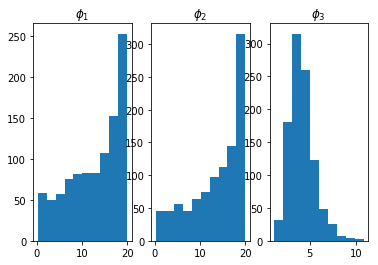

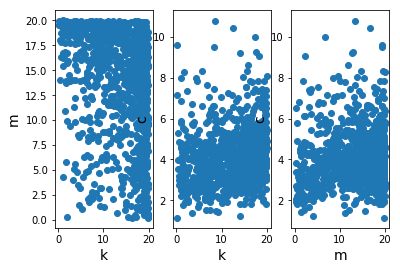

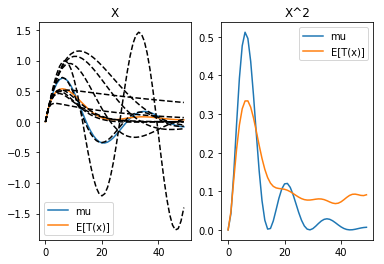

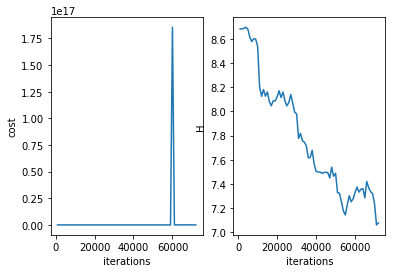

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 73000 
H 7.026067454558615
cost 21973862561574.18
system.D 3


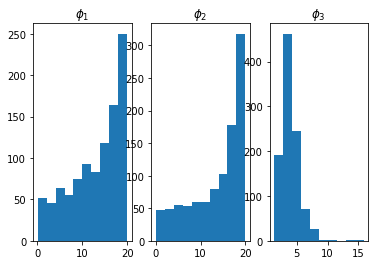

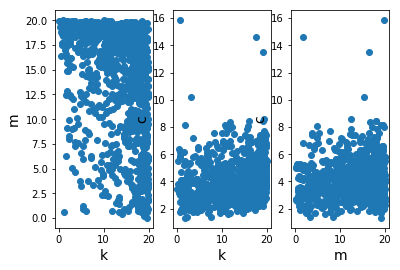

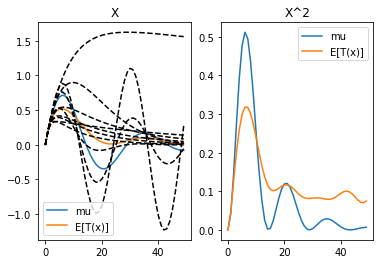

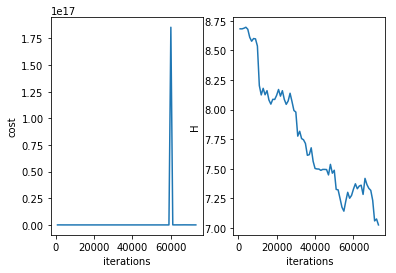

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 74000 
H 7.055288609531794
cost 31589163398583.32
system.D 3


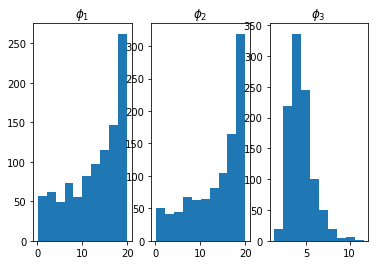

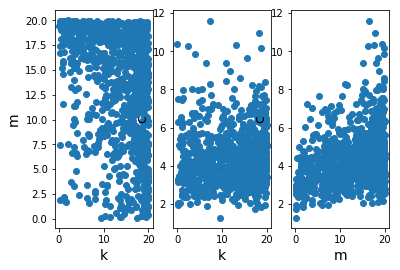

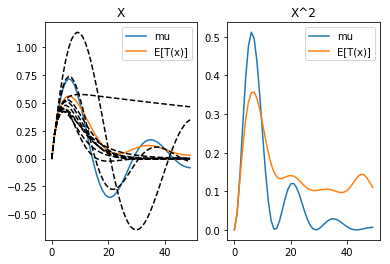

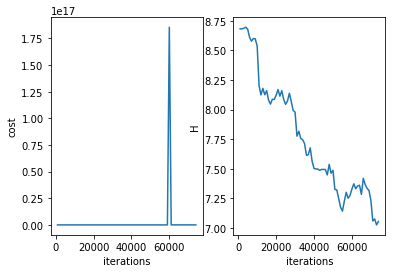

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 75000 
H 7.092541380914774
cost 27260912295264.914
system.D 3


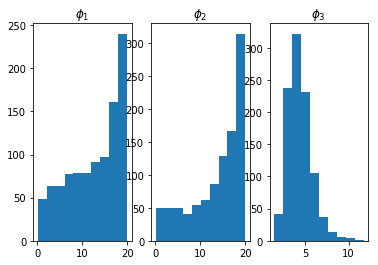

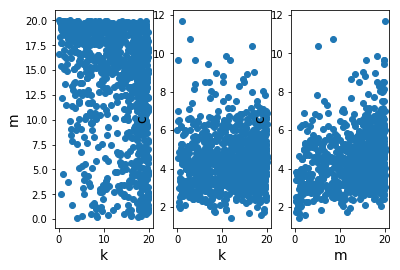

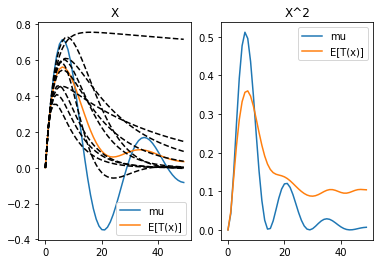

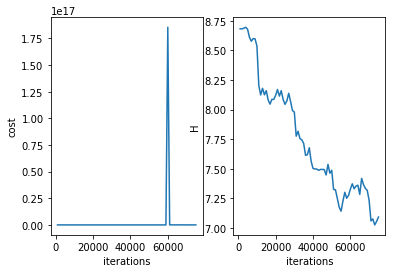

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 76000 
H 6.9971000057373915
cost 21789302000516.48
system.D 3


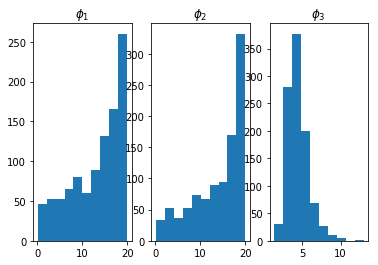

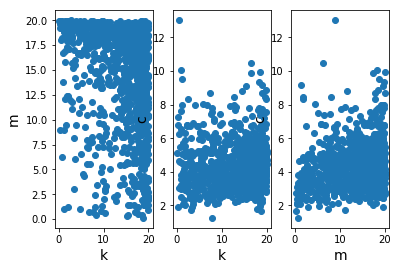

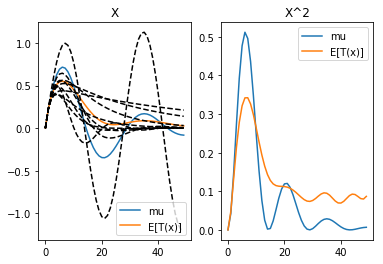

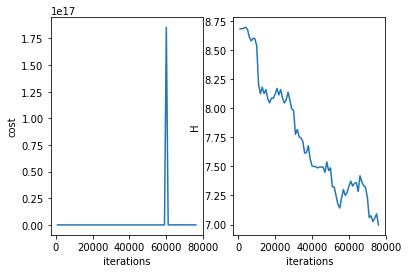

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 77000 
H 7.100330490100145
cost 33481672875808.55
system.D 3


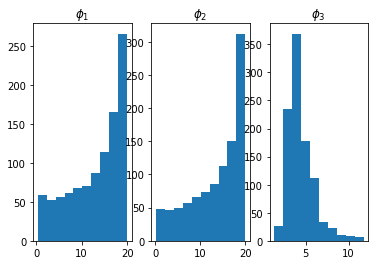

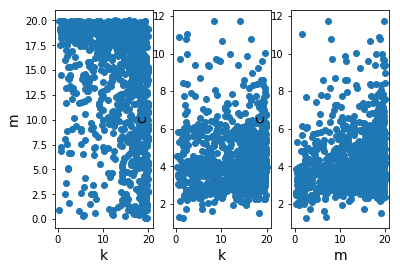

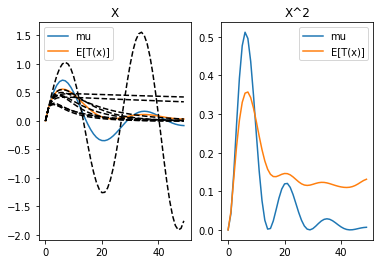

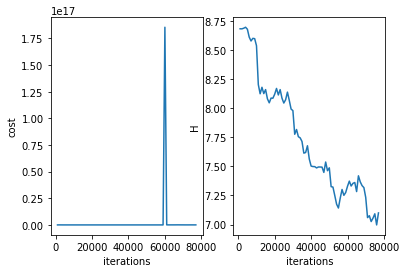

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 78000 
H 7.0561013098384056
cost 19245555048263.156
system.D 3


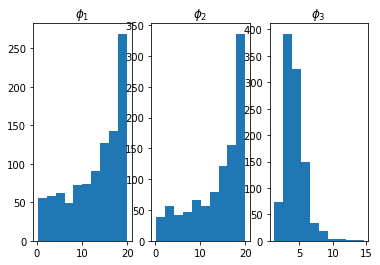

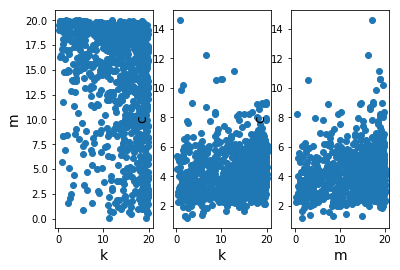

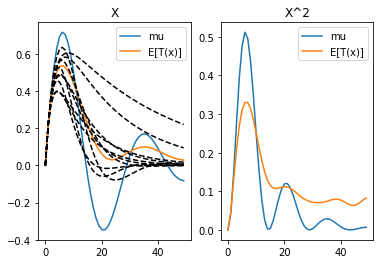

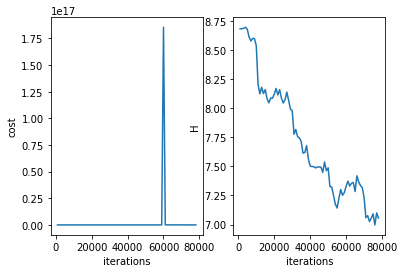

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 79000 
H 7.013719014142094
cost 22565355150207.617
system.D 3


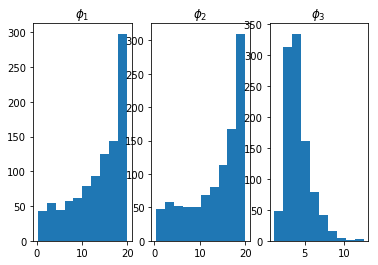

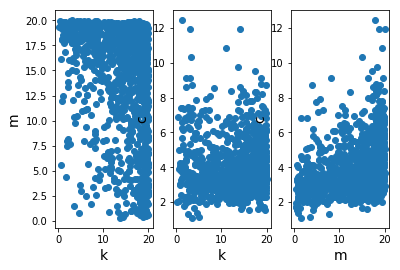

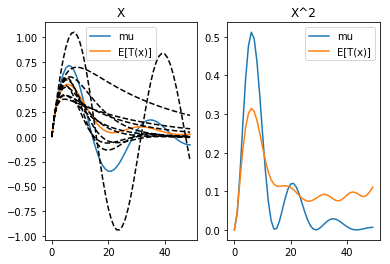

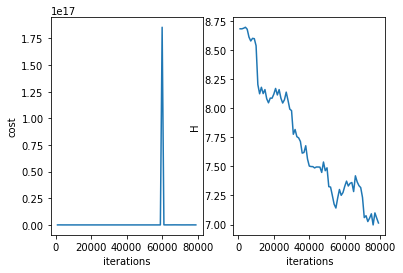

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 80000 
H 6.990379924154016
cost 22480393026130.324
system.D 3


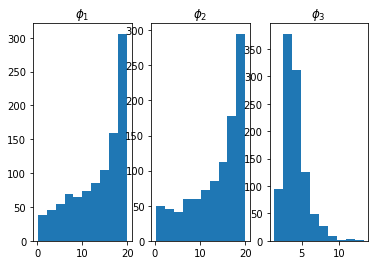

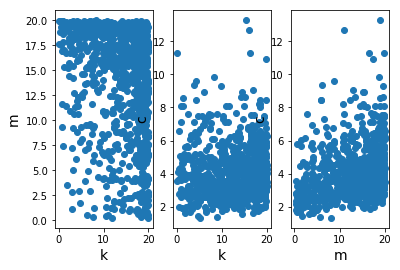

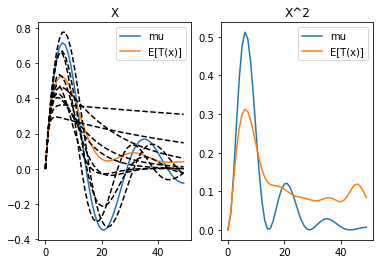

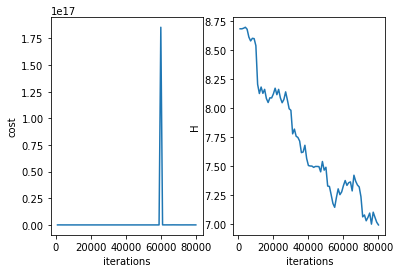

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 9
resetting optimizer
aug lag it 8
lambda [ 0.00000000e+00  1.36296174e+10 -2.55711287e+10 -8.29873555e+10
 -1.38712581e+11 -1.81049300e+11 -2.03834566e+11 -2.04482004e+11
 -1.83404090e+11 -1.42533501e+11 -8.57789050e+10 -1.68789403e+10
  5.85177125e+10  1.37104511e+11  2.12170651e+11  2.83249602e+11
  3.41564747e+11  3.93181856e+11  4.22912764e+11  4.51061181e+11
  4.44205643e+11  4.53418148e+11  4.12005145e+11  3.99667558e+11
  3.37900078e+11  3.09638497e+11  2.36483277e+11  2.01793579e+11
  1.26722362e+11  9.47954416e+10  2.62153988e+10  4.59406095e+09
 -5.12748498e+10 -5.75639233e+10 -9.73387677e+10 -8.61826974e+10
 -1.09522472e+11 -8.16848941e+10 -9.10937940e+10 -4.97822236e+10
 -5.00581313e+10 -1.41309139e+08  2.46592937e+09  5.55182512e+10
  5.43303293e+10  1.05662460e+11  9.46

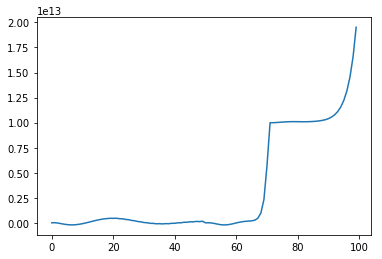

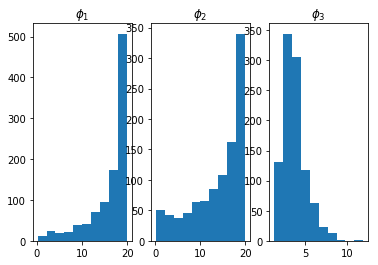

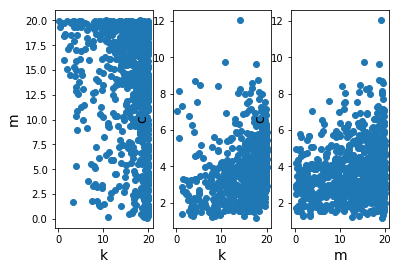

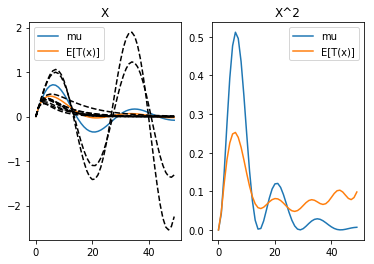

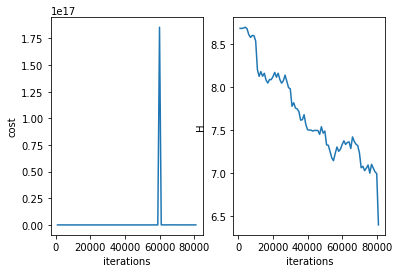

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 82000 
H 6.495926730332668
cost 29058105312526.598
system.D 3


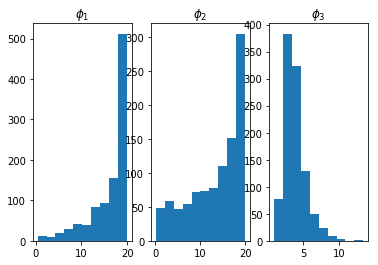

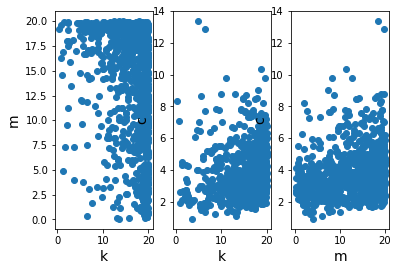

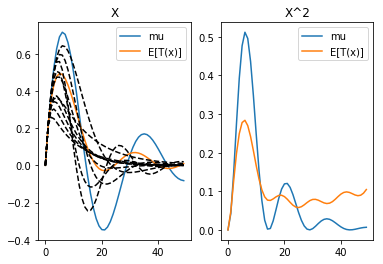

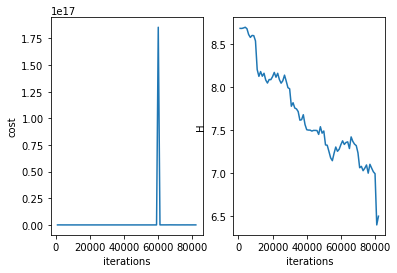

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 83000 
H 6.546603349602612
cost 41858515771422.2
system.D 3


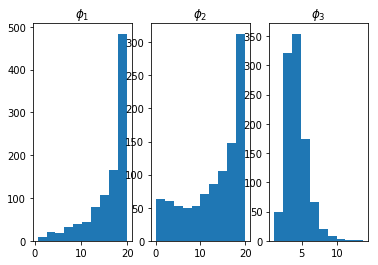

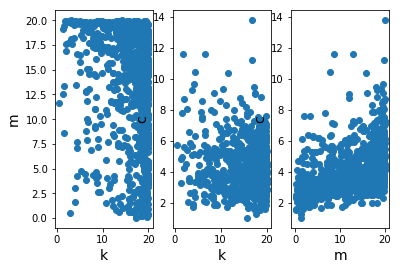

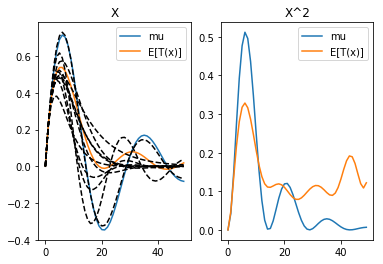

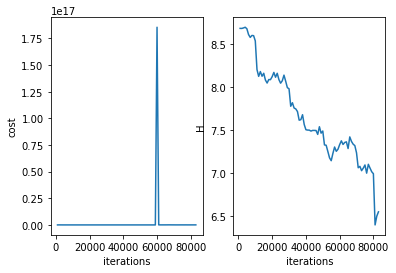

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 84000 
H 6.561224795000098
cost 25968885987646.363
system.D 3


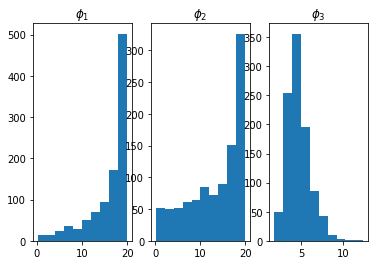

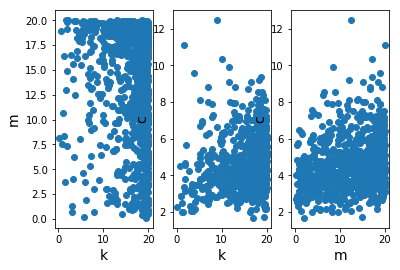

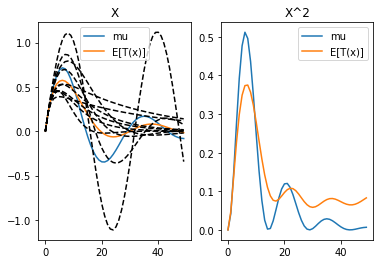

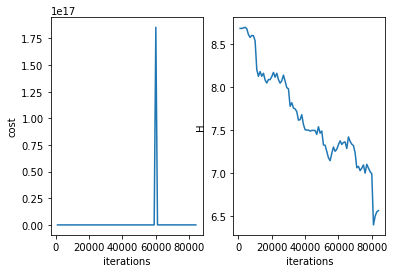

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 85000 
H 6.648430119546754
cost 36753985599311.43
system.D 3


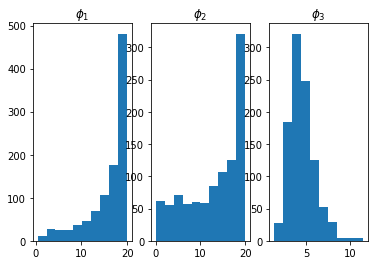

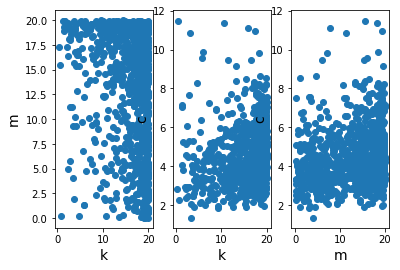

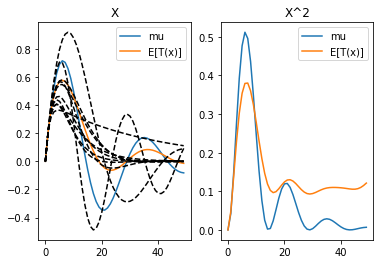

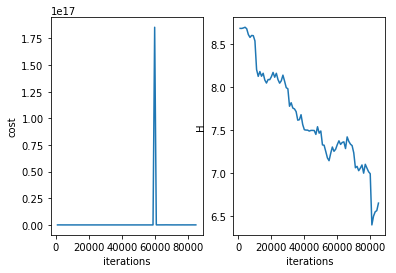

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 86000 
H 6.59293097478188
cost 28218337954961.035
system.D 3


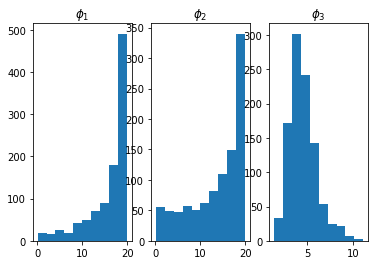

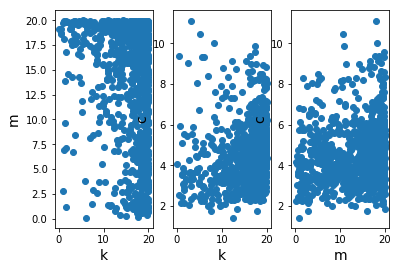

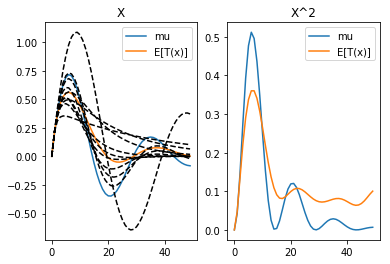

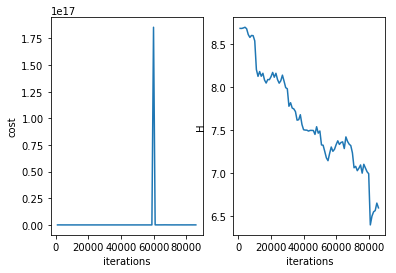

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 87000 
H 6.570069008938565
cost 35869269216737.6
system.D 3


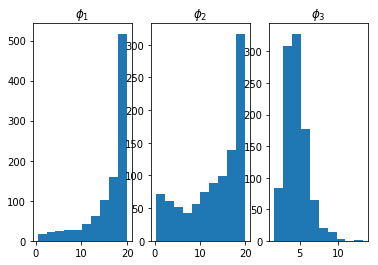

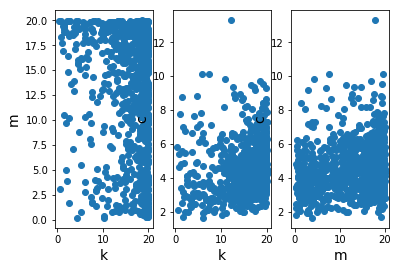

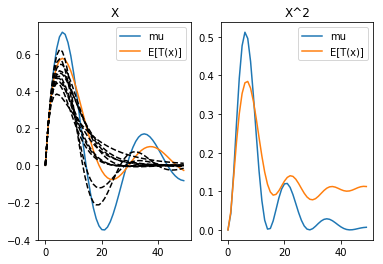

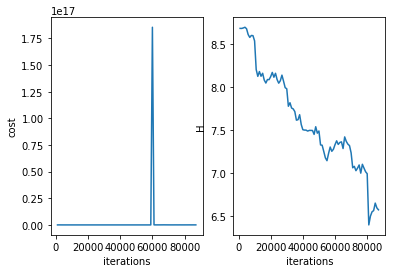

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 88000 
H 6.444821282730187
cost 29616051210923.33
system.D 3


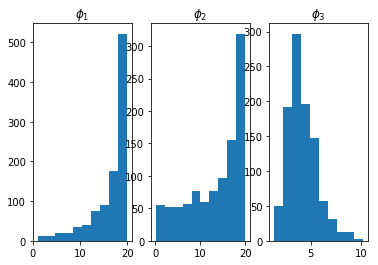

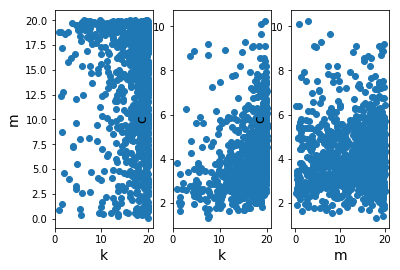

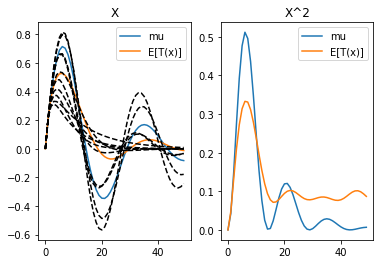

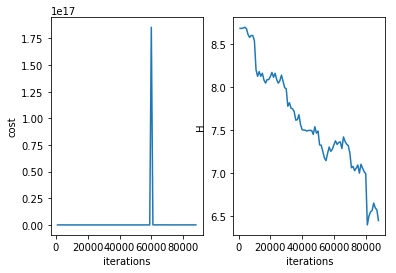

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 89000 
H 6.3894775863992
cost 34255482580918.043
system.D 3


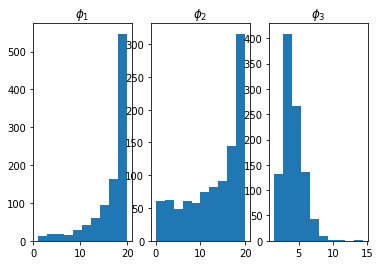

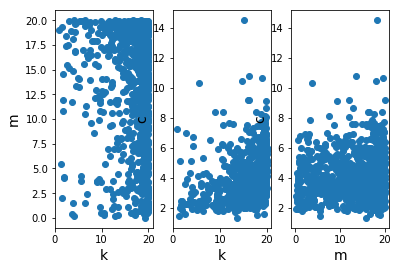

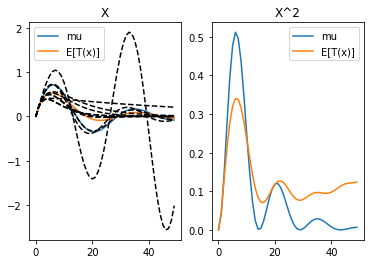

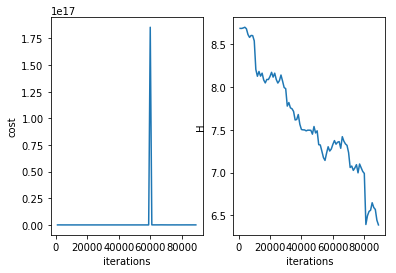

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 90000 
H 6.402100279200819
cost 37835845686982.9
system.D 3


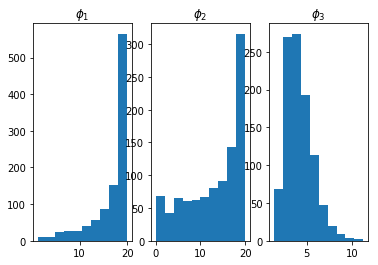

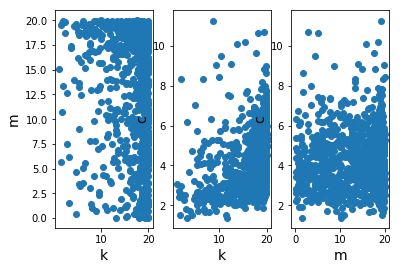

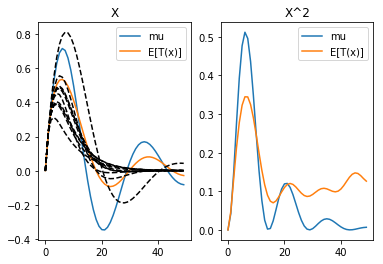

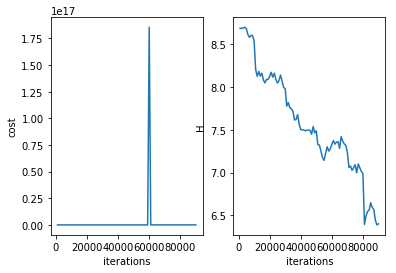

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 10
resetting optimizer
aug lag it 9
lambda [ 0.00000000e+00  1.36296176e+11 -2.60209415e+11 -8.26746966e+11
 -1.37151129e+12 -1.78456233e+12 -2.00901055e+12 -2.02391455e+12
 -1.83458625e+12 -1.46438374e+12 -9.49795241e+11 -3.33751912e+11
  3.36175004e+11  1.01530643e+12  1.65878846e+12  2.23331156e+12
  2.70401817e+12  3.05852526e+12  3.27114304e+12  3.35943674e+12
  3.29439890e+12  3.13771541e+12  2.83830416e+12  2.49511763e+12
  2.05112196e+12  1.61154683e+12  1.11980941e+12  6.79468560e+11
  2.29326426e+11 -1.32689062e+11 -4.75665667e+11 -7.09169624e+11
 -9.11433038e+11 -9.99253477e+11 -1.05949911e+12 -1.01418074e+12
 -9.57139067e+11 -8.12422621e+11 -6.78809349e+11 -4.78685694e+11
 -3.14154001e+11 -1.02210998e+11  5.22237715e+10  2.41065776e+11
  3.55463670e+11  4.99665331e+11  5.5

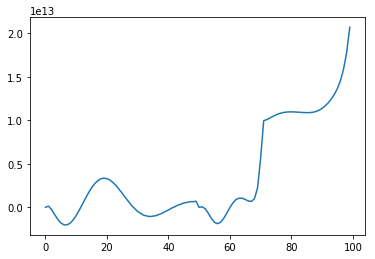

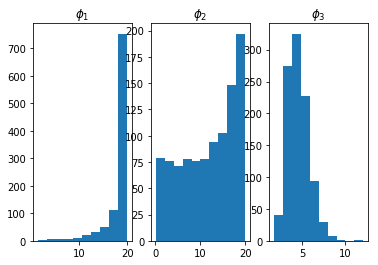

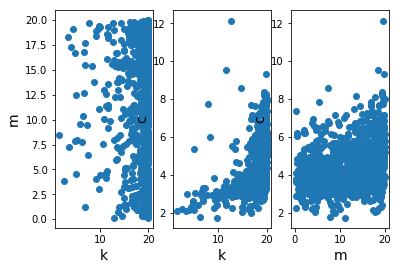

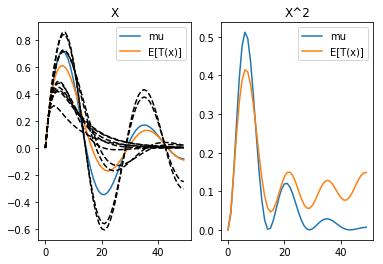

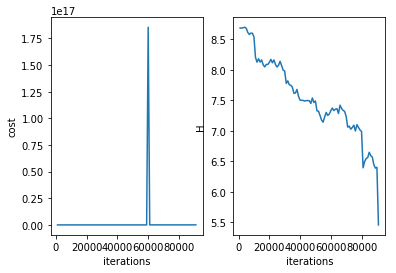

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 92000 
H 5.307862826241099
cost 101496471708681.47
system.D 3


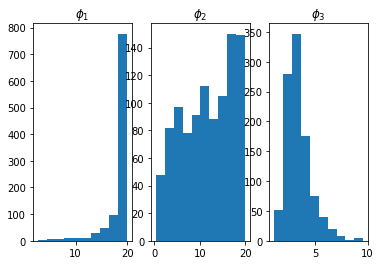

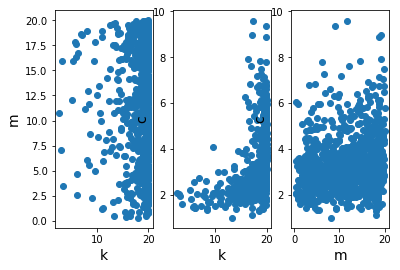

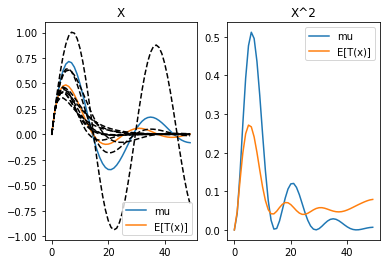

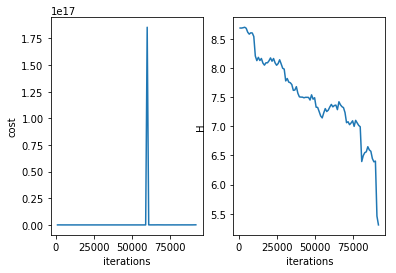

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 93000 
H 5.345265159816152
cost 146334445231376.12
system.D 3


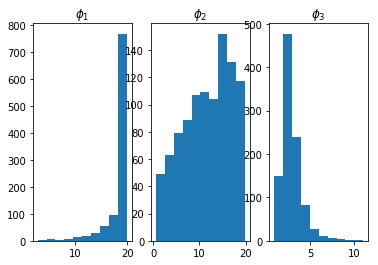

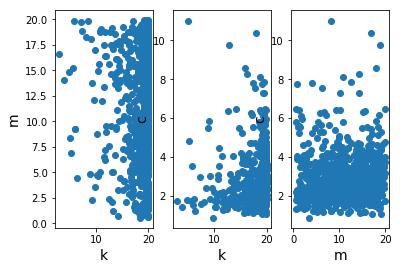

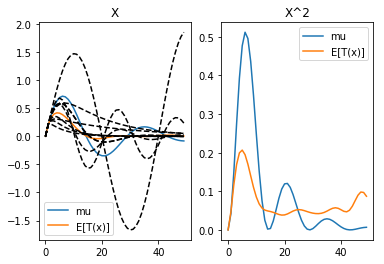

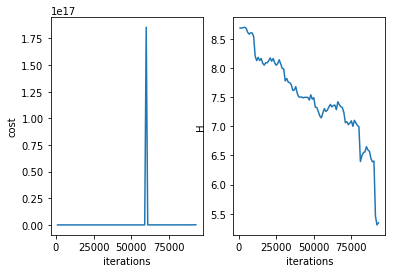

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 94000 
H 5.296623151741238
cost 226384778582595.12
system.D 3


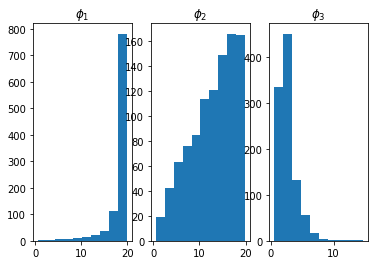

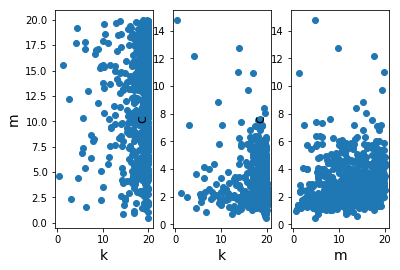

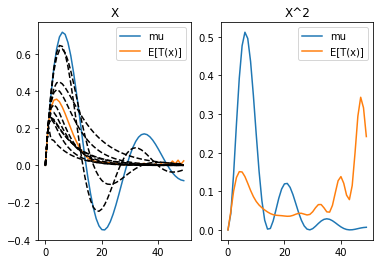

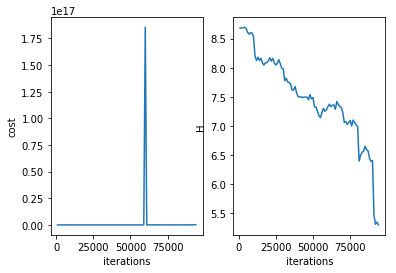

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 95000 
H 5.221159276855896
cost 191338397454550.56
system.D 3


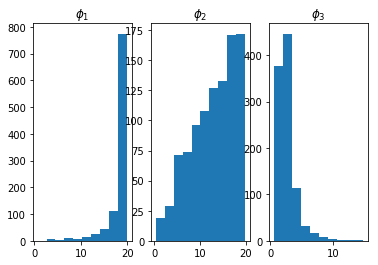

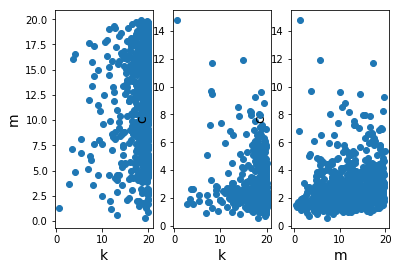

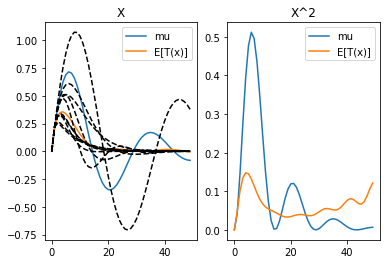

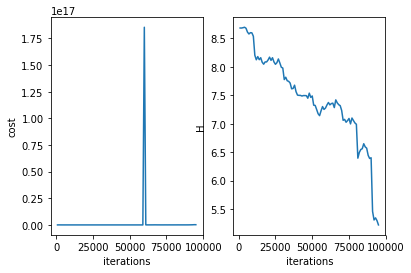

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 96000 
H 5.227423813669511
cost 175678917292710.2
system.D 3


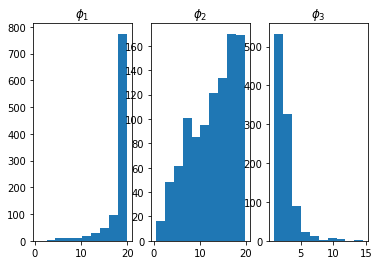

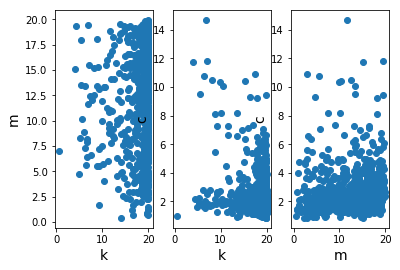

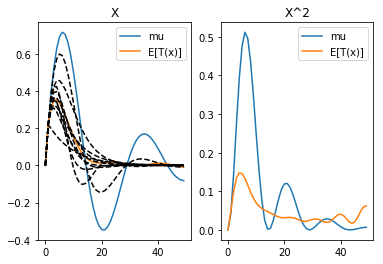

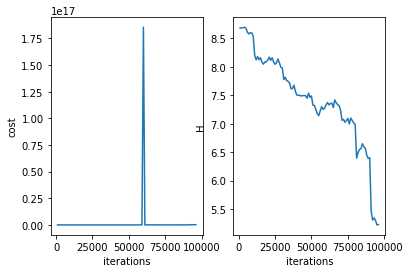

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 97000 
H 5.180647144095685
cost 1.5835571375678837e+21
system.D 3


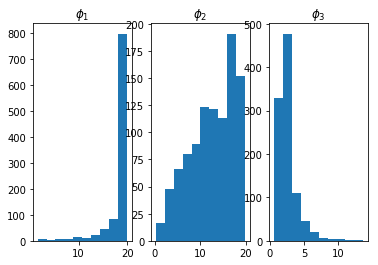

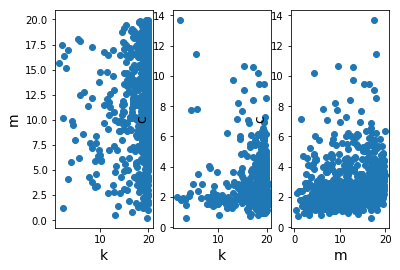

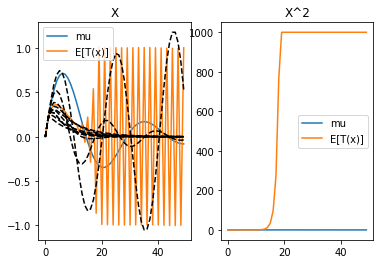

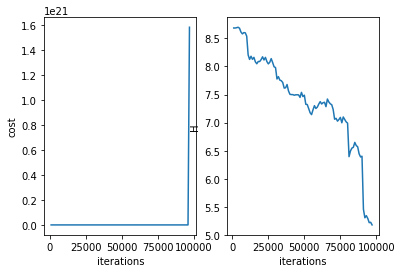

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 98000 
H 5.218261520033415
cost 165948499643702.4
system.D 3


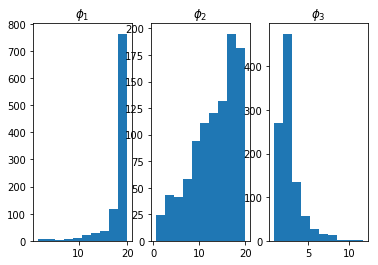

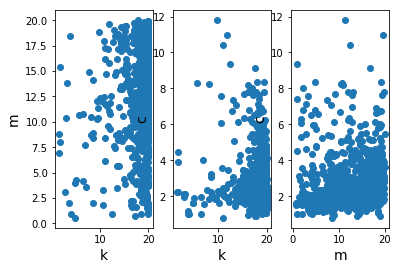

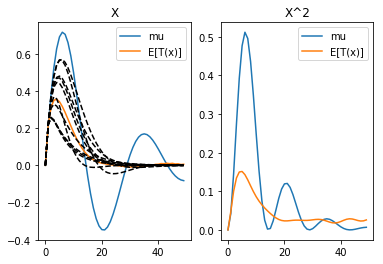

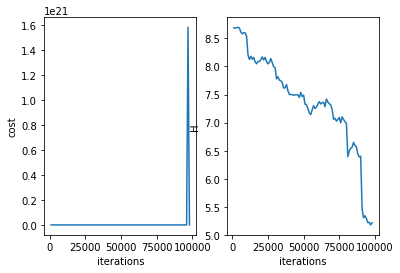

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 99000 
H 5.1670896594611895
cost 149065997262185.97
system.D 3


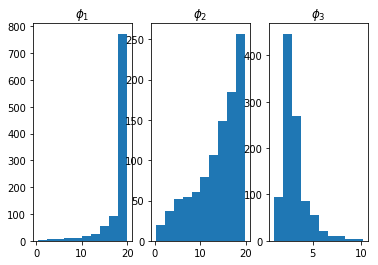

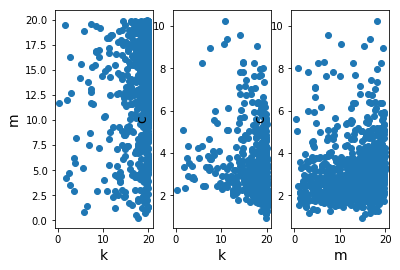

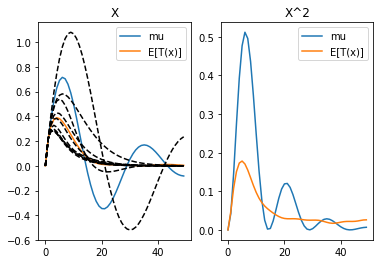

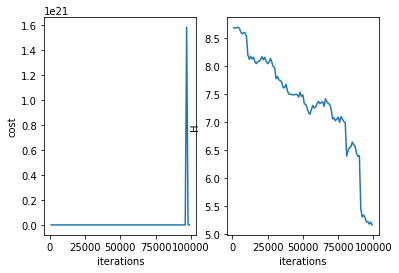

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 100000 
H 5.098761003632244
cost 151982989001888.2
system.D 3


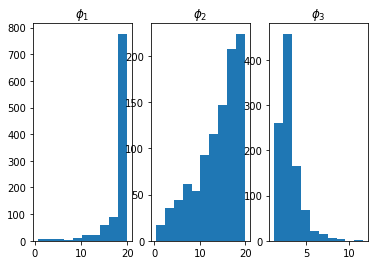

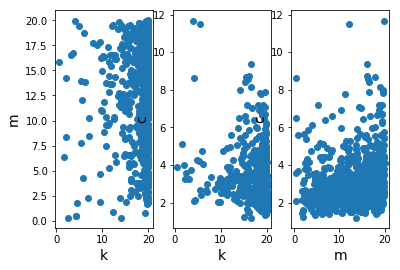

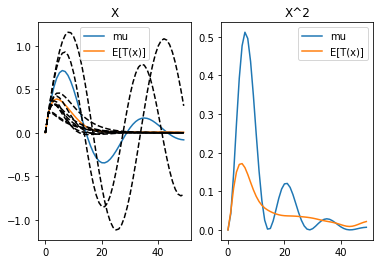

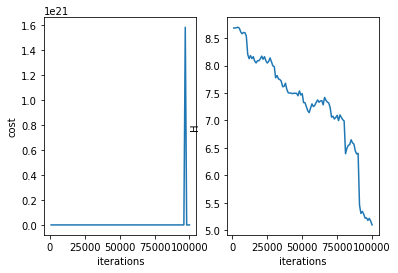

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 11
resetting optimizer
aug lag it 10
lambda [ 0.00000000e+00  1.36296176e+12 -5.88254424e+12 -1.57125021e+13
 -2.52738734e+13 -3.30187929e+13 -3.81436258e+13 -4.03189701e+13
 -3.95451951e+13 -3.60579622e+13 -3.02600113e+13 -2.26631348e+13
 -1.38424484e+13 -4.39060378e+12  5.11221137e+12  1.41378352e+13
  2.22194607e+13  2.89924874e+13  3.41699212e+13  3.76045719e+13
  3.91995898e+13  3.90412684e+13  3.71868922e+13  3.39153528e+13
  2.94062865e+13  2.40417360e+13  1.80646830e+13  1.18837422e+13
  5.73201327e+12 -2.34906911e+10 -5.21999238e+12 -9.58149220e+12
 -1.30528134e+13 -1.54720472e+13 -1.69014004e+13 -1.72887000e+13
 -1.67980547e+13 -1.54603166e+13 -1.35084404e+13 -1.10166165e+13
 -8.24669299e+12 -5.27429816e+12 -2.35391249e+12  4.72407506e+11
  2.98230665e+12  5.19017486e+12  6.

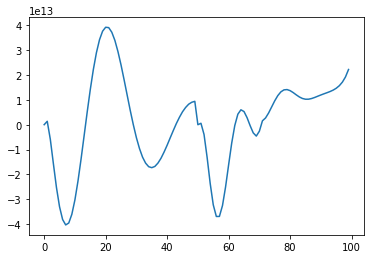

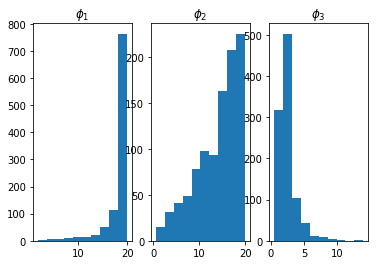

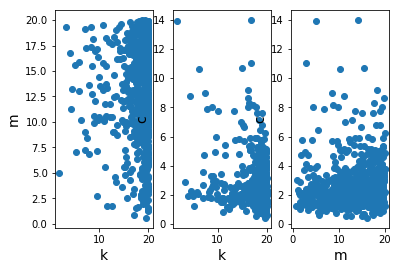

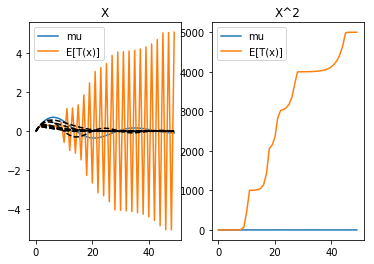

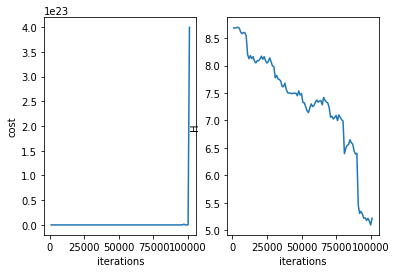

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 102000 
H 5.241929570651368
cost 1283358334283166.0
system.D 3


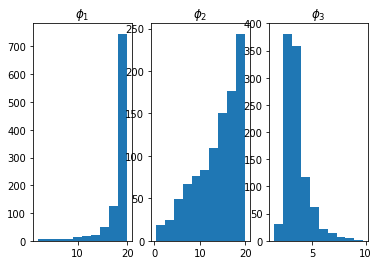

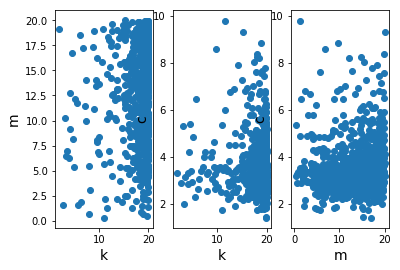

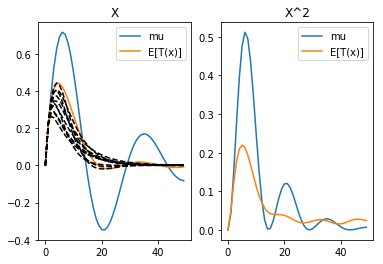

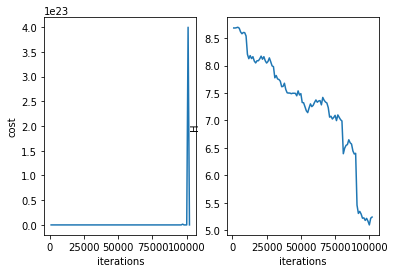

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 103000 
H 5.318255779397216
cost 1185290041689509.8
system.D 3


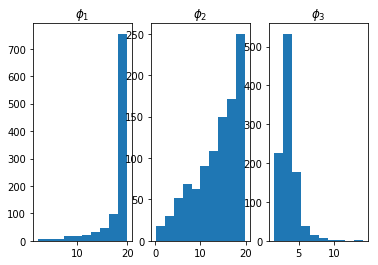

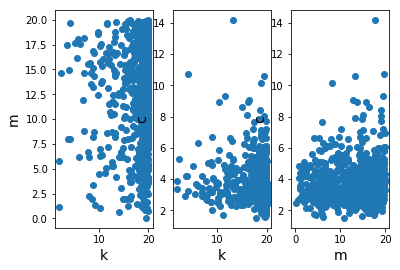

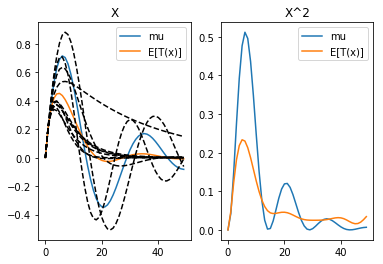

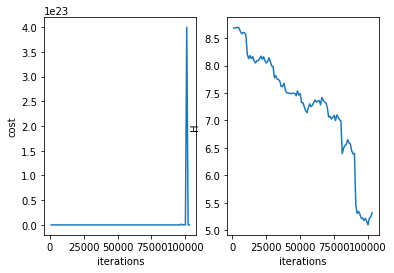

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 104000 
H 5.295648231396586
cost 1238866431361279.2
system.D 3


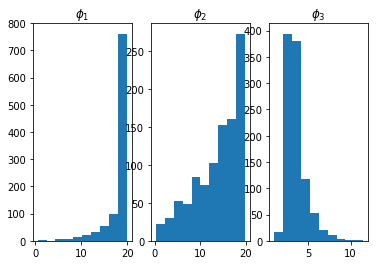

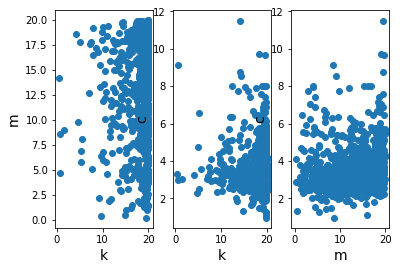

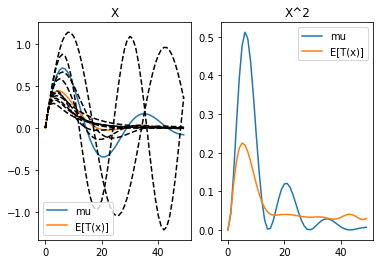

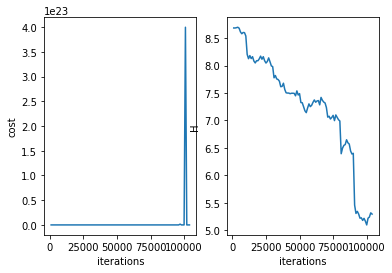

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 105000 
H 5.3926663250291895
cost 1175769631390411.5
system.D 3


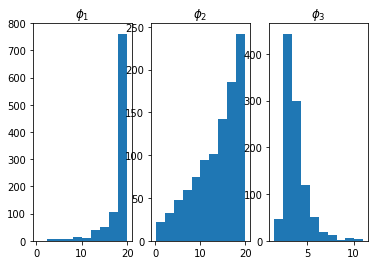

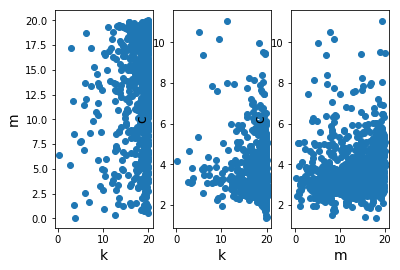

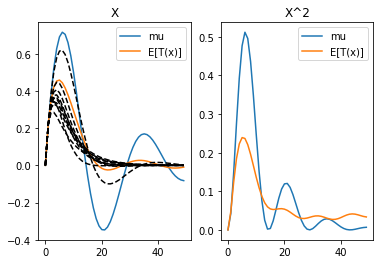

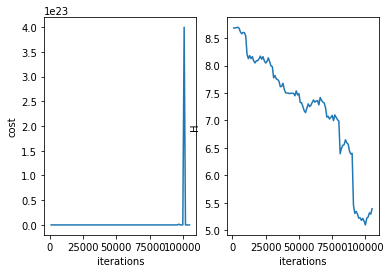

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 106000 
H 5.309999586820198
cost 1204465604582603.0
system.D 3


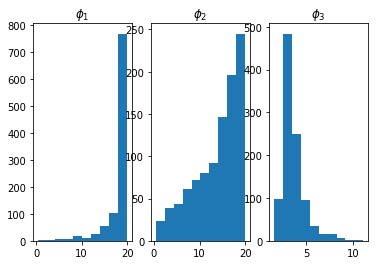

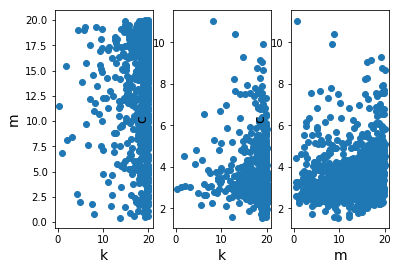

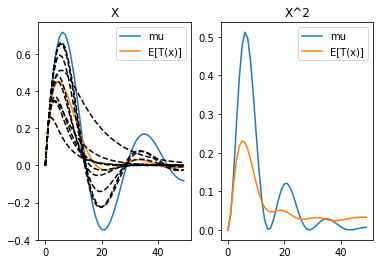

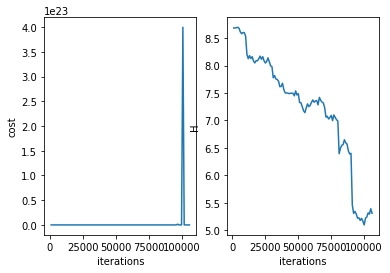

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 107000 
H 5.226407415515001
cost 1292077512350553.5
system.D 3


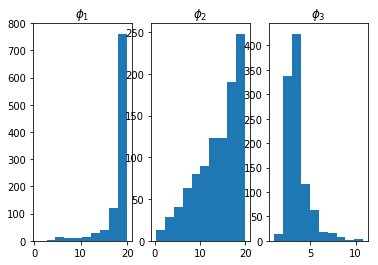

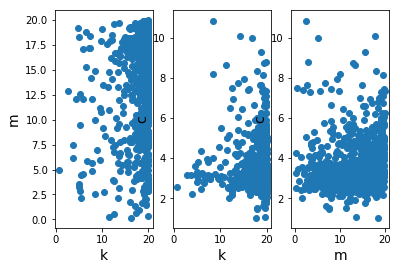

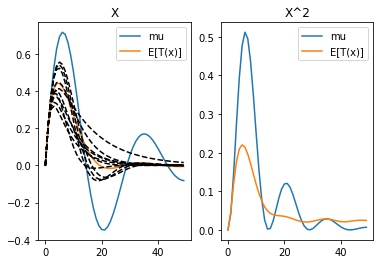

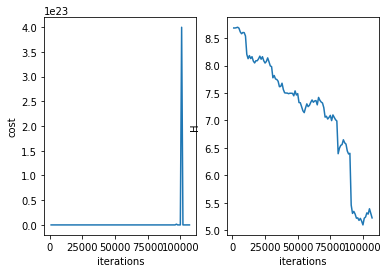

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 108000 
H 5.270411462320868
cost 1206451245348958.0
system.D 3


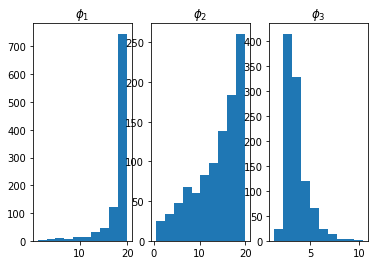

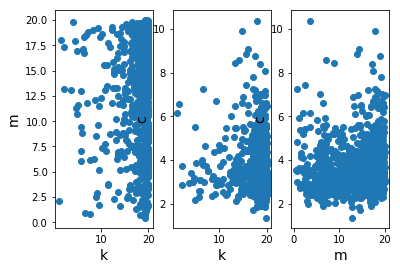

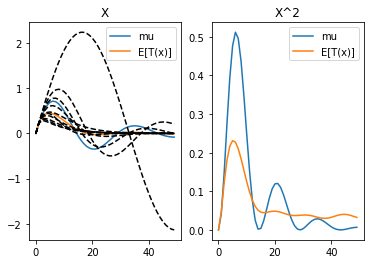

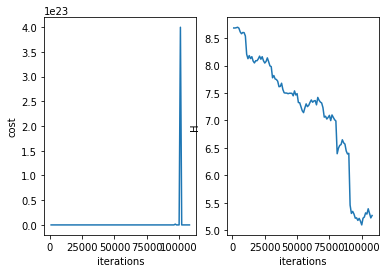

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 109000 
H 5.305252346303725
cost 1198089935853101.5
system.D 3


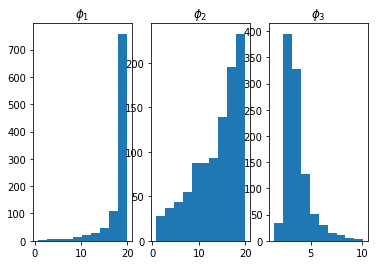

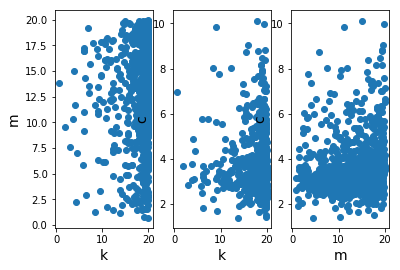

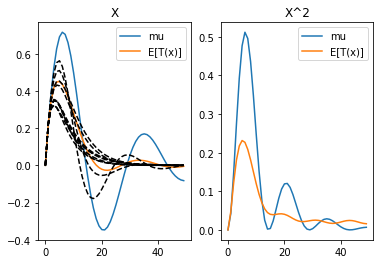

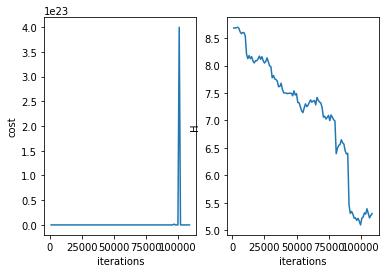

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 110000 
H 5.299524663725982
cost 1179286785263906.0
system.D 3


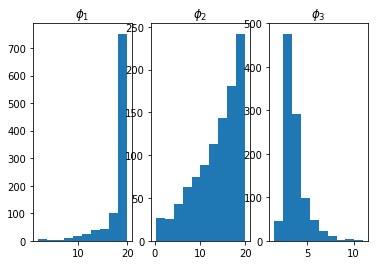

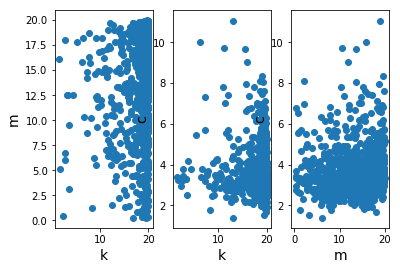

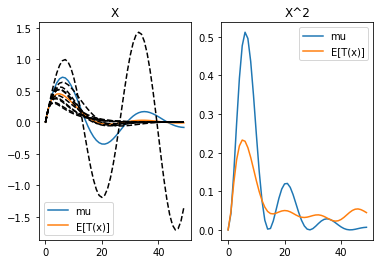

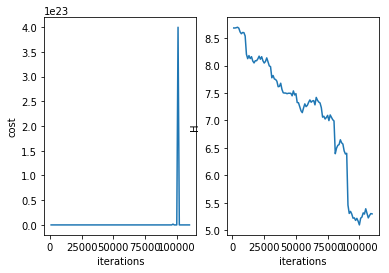

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 12
resetting optimizer
aug lag it 11
lambda [ 0.00000000e+00  1.36296176e+13 -4.16421895e+13 -1.22704994e+14
 -2.04440138e+14 -2.71948288e+14 -3.16953714e+14 -3.35775914e+14
 -3.28047224e+14 -2.95798595e+14 -2.42746767e+14 -1.73699857e+14
 -9.40537958e+13 -9.35571656e+12  7.50530733e+13  1.54339990e+14
  2.24389880e+14  2.81982081e+14  3.24841398e+14  3.51719655e+14
  3.62275593e+14  3.57134730e+14  3.37570764e+14  3.05625602e+14
  2.63643295e+14  2.14421024e+14  1.60719922e+14  1.05432317e+14
  5.11193939e+13  2.20127791e+11 -4.53637471e+13 -8.40022381e+13
 -1.14698284e+14 -1.36763932e+14 -1.50133969e+14 -1.54992518e+14
 -1.52054913e+14 -1.42159543e+14 -1.26538863e+14 -1.06392307e+14
 -8.31681186e+13 -5.81294608e+13 -3.26664107e+13 -7.86022287e+12
  1.51587595e+13  3.56529069e+13  5.

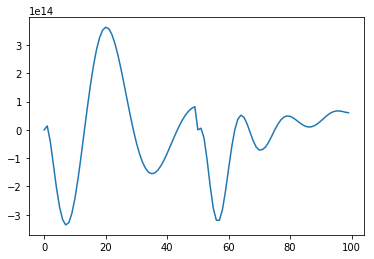

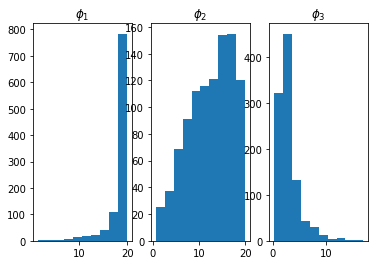

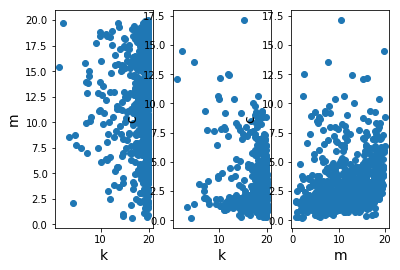

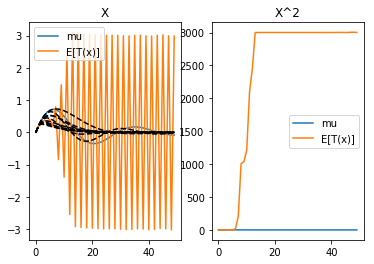

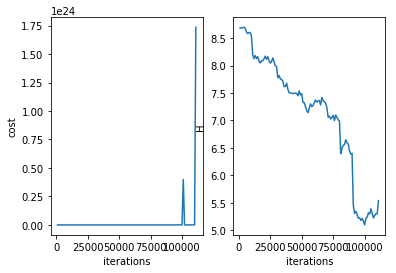

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 112000 
H 5.337957821516955
cost 1.4868916102969454e+16
system.D 3


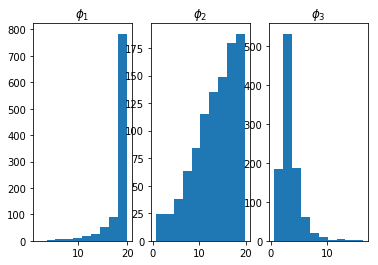

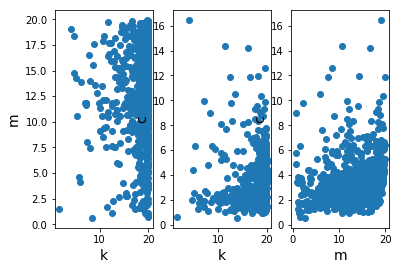

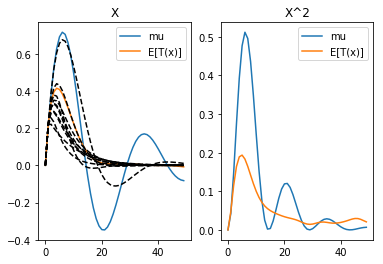

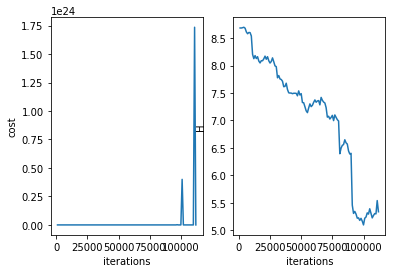

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 113000 
H 5.31829820521715
cost 1.5070068869278514e+16
system.D 3


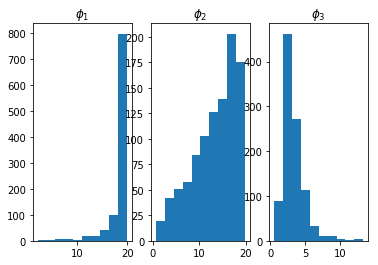

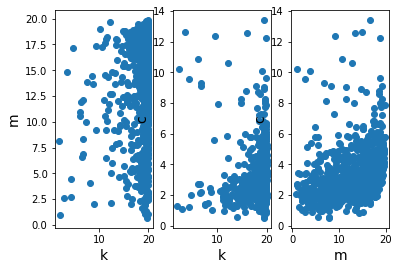

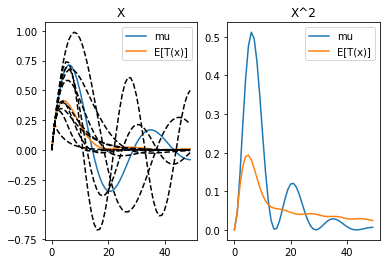

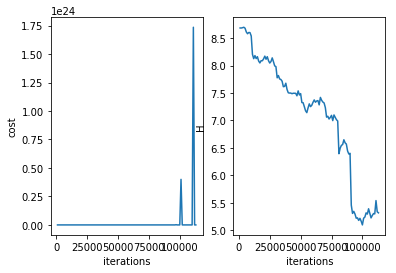

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 114000 
H 5.296308959340462
cost 1.6918050091122654e+23
system.D 3


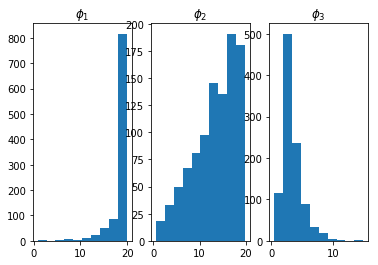

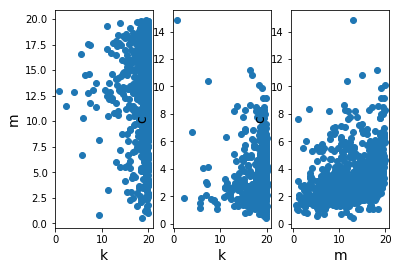

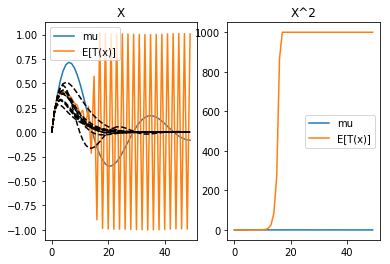

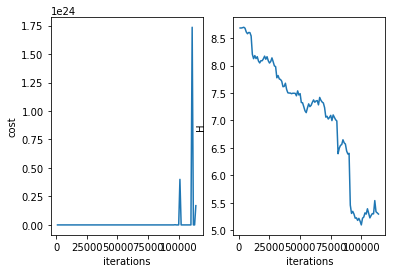

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 115000 
H 5.522388192434931
cost 1.86780305101207e+23
system.D 3


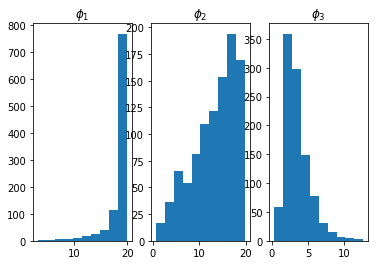

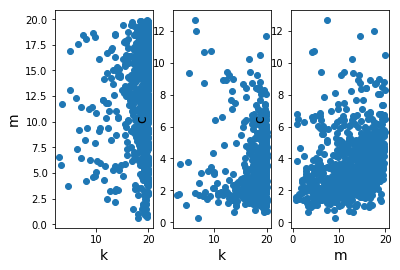

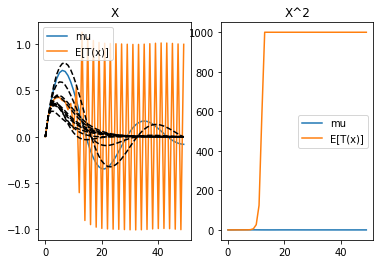

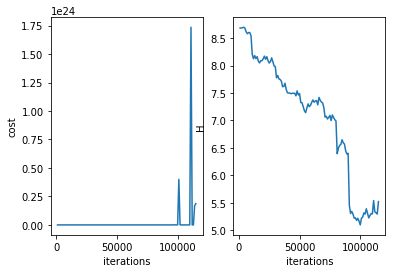

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 116000 
H 5.460731223122348
cost 1.464336651903881e+16
system.D 3


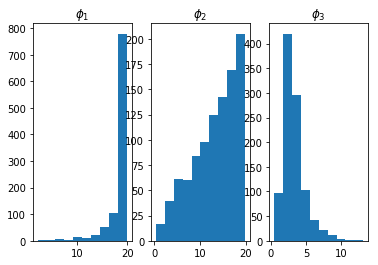

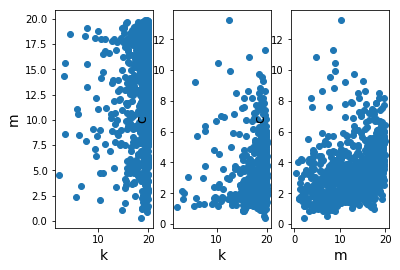

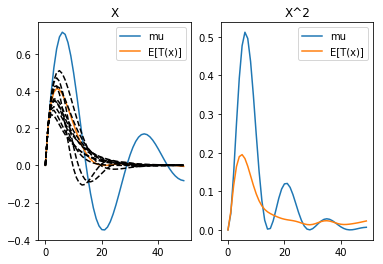

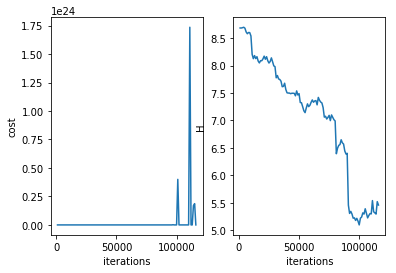

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 117000 
H 5.4070770176883025
cost 1.976229705855146e+23
system.D 3


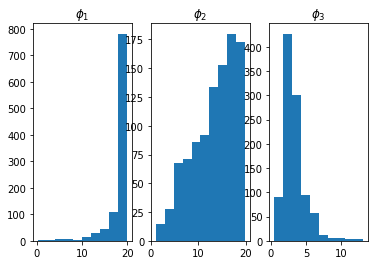

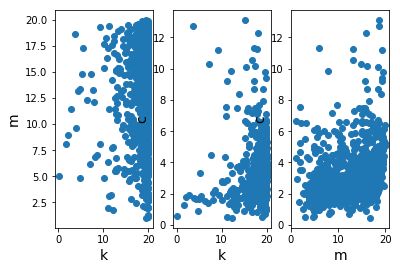

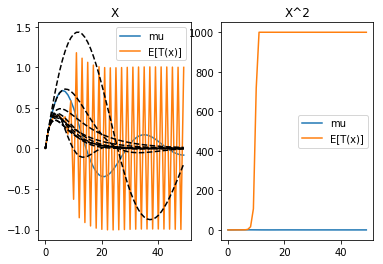

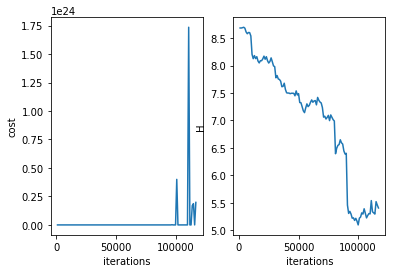

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 118000 
H 5.394645792434006
cost 1.4802025387208202e+16
system.D 3


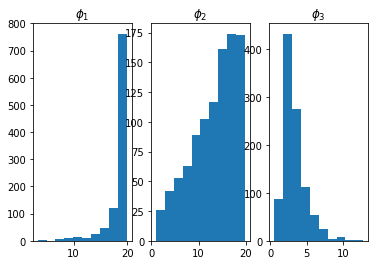

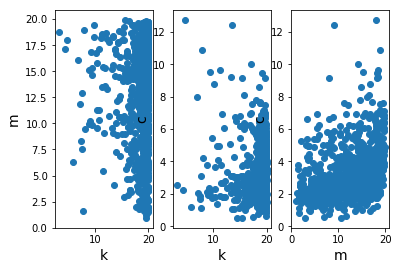

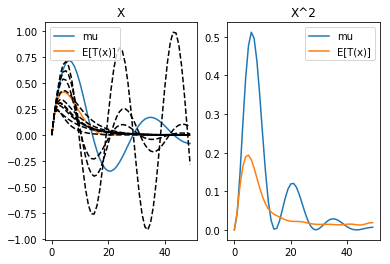

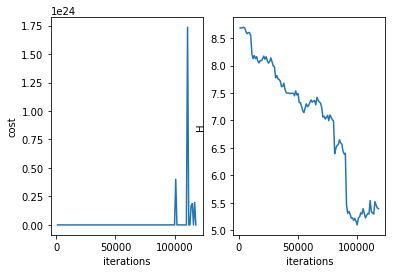

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 119000 
H 5.276182223238439
cost 1.321582037607663e+16
system.D 3


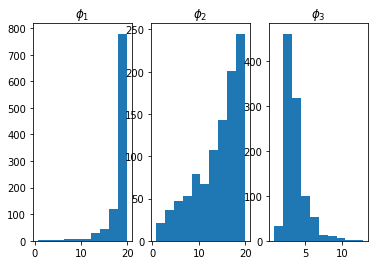

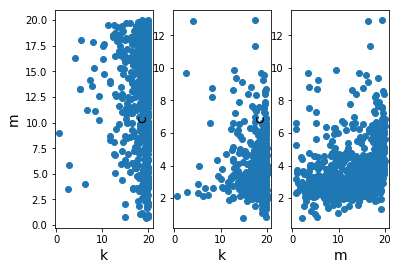

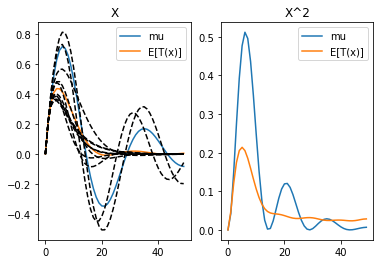

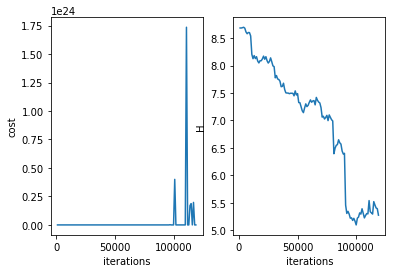

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 120000 
H 5.218253738265118
cost 1.3693880956298632e+16
system.D 3


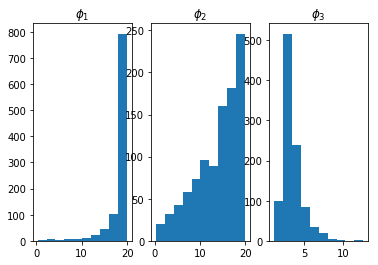

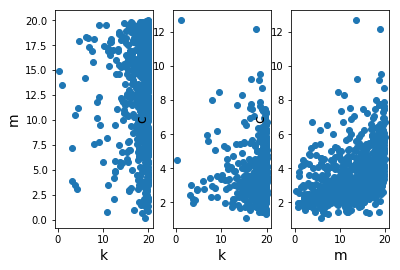

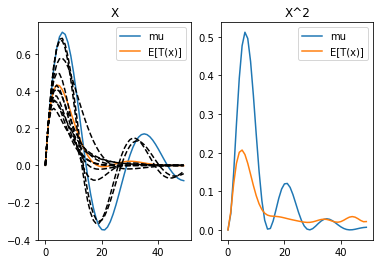

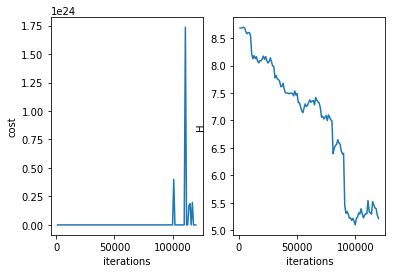

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 13
resetting optimizer
aug lag it 12
lambda [ 0.00000000e+00  1.36296176e+14 -4.35851749e+14 -1.28582868e+15
 -2.15727888e+15 -2.89389040e+15 -3.40640552e+15 -3.65256942e+15
 -3.62428022e+15 -3.33836703e+15 -2.82941939e+15 -2.14386880e+15
 -1.33496145e+15 -4.58451586e+14  4.31026955e+14  1.28295248e+15
  2.05323469e+15  2.70593176e+15  3.21428904e+15  3.56128710e+15
  3.73951161e+15  3.75078268e+15  3.60505096e+15  3.31944957e+15
  2.91655315e+15  2.42312354e+15  1.86815942e+15  1.28161674e+15
  6.92577202e+14  1.28220945e+14 -3.87646436e+14 -8.35173447e+14
 -1.19943269e+15 -1.47045786e+15 -1.64366989e+15 -1.71937822e+15
 -1.70272001e+15 -1.60272119e+15 -1.43188506e+15 -1.20497316e+15
 -9.38430661e+14 -6.49078639e+14 -3.53580504e+14 -6.72318436e+13
  1.96347401e+14  4.26181267e+14  6.

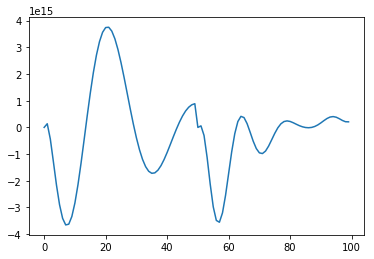

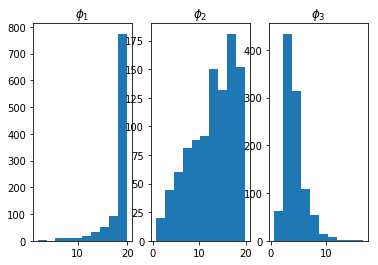

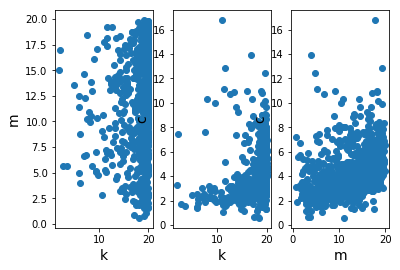

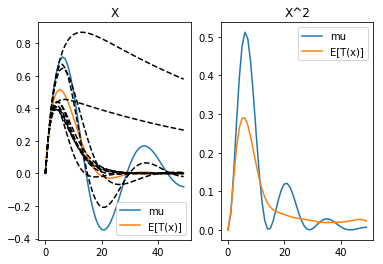

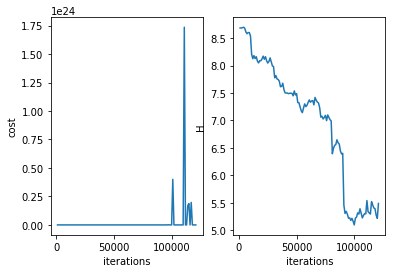

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 122000 
H 4.474728299600853
cost 7.819433579282552e+24
system.D 3


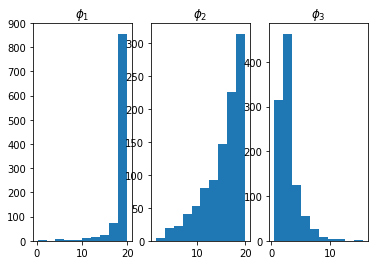

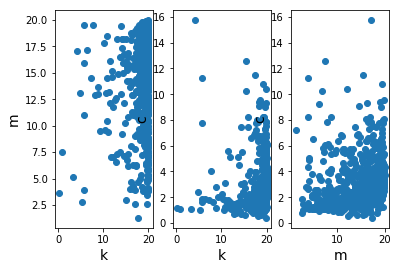

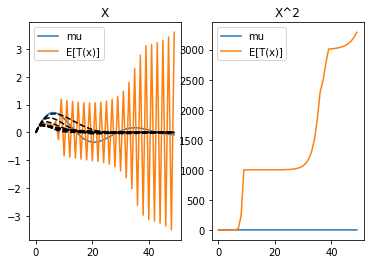

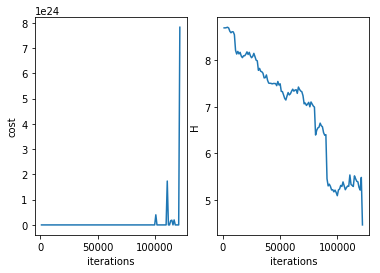

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 123000 
H 4.750404816889851
cost 1.538149540159027e+17
system.D 3


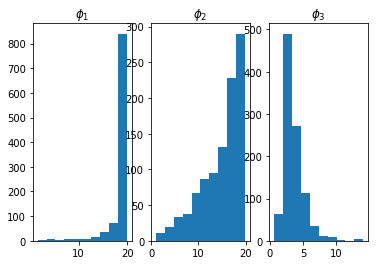

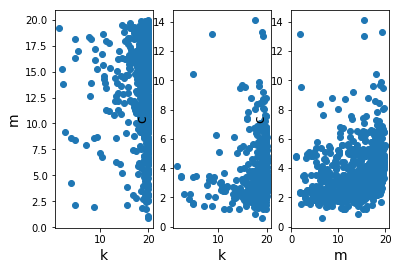

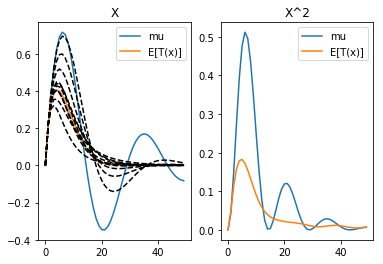

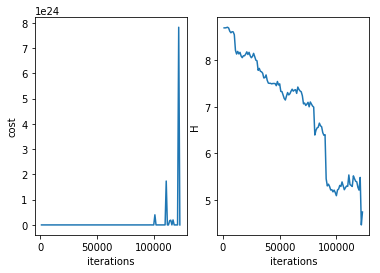

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 124000 
H 4.661628743477912
cost 1.5976934560535258e+17
system.D 3


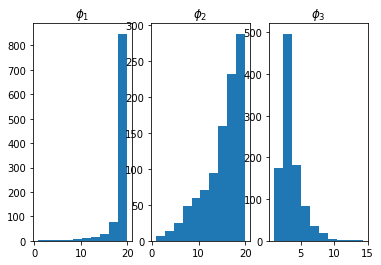

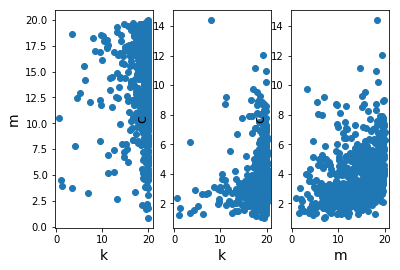

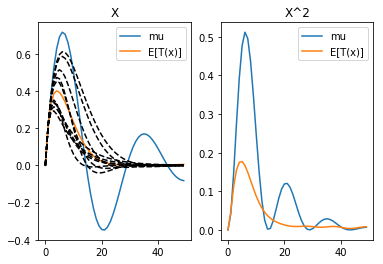

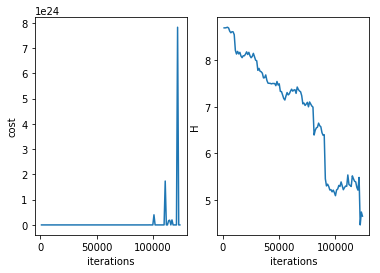

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 125000 
H 4.787328312675213
cost 1.5238192062617523e+17
system.D 3


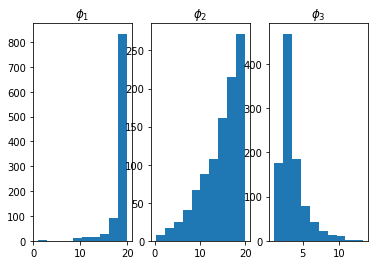

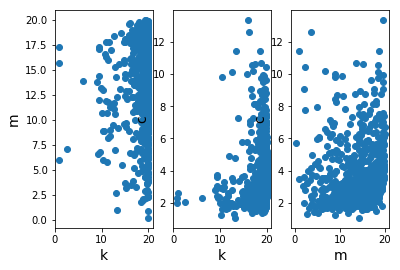

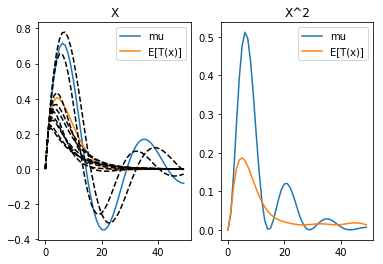

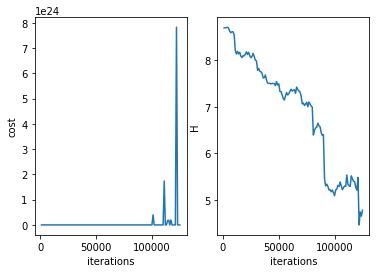

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 126000 
H 4.6241933336584475
cost 1.598525406639233e+17
system.D 3


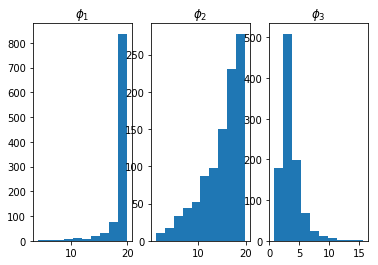

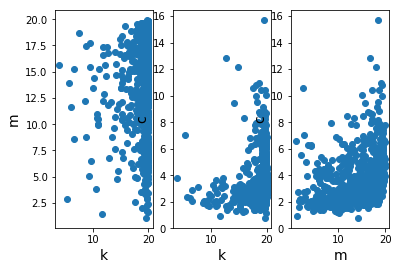

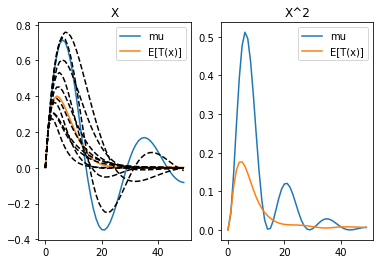

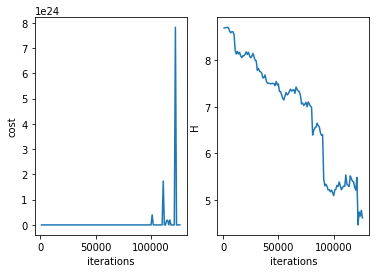

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 127000 
H 4.601276520731742
cost 1.620673312683803e+17
system.D 3


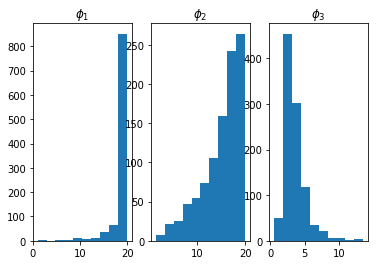

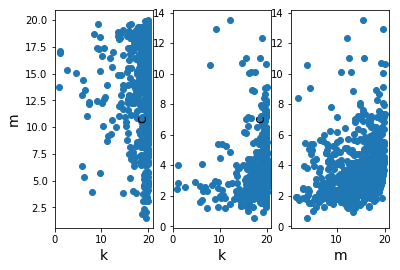

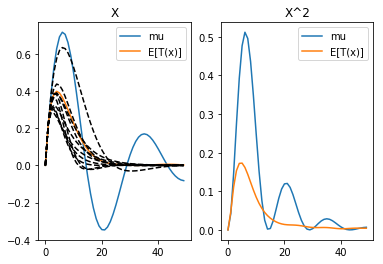

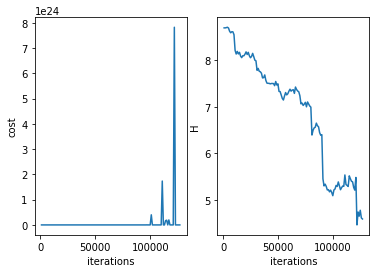

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 128000 
H 4.662506647216918
cost 1.588028936638533e+17
system.D 3


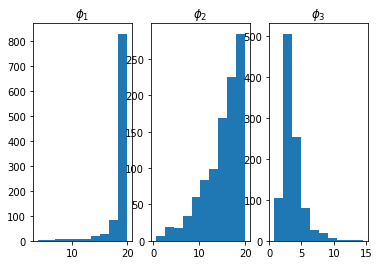

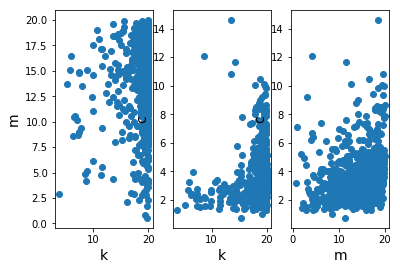

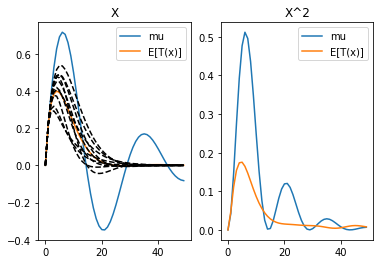

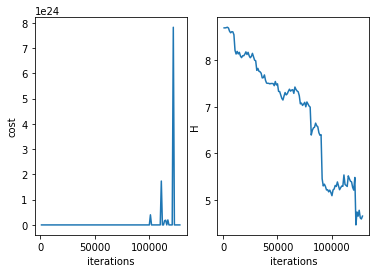

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 129000 
H 4.660748962394546
cost 1.587217772942565e+17
system.D 3


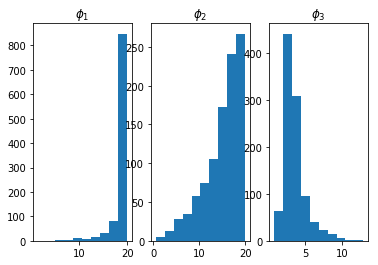

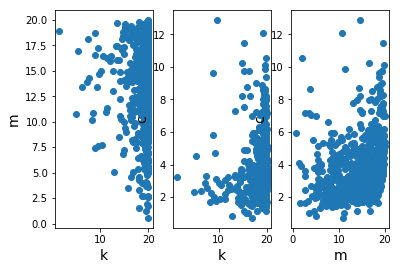

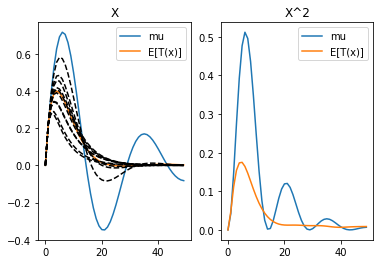

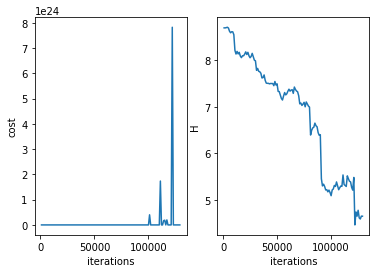

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 130000 
H 4.701802565490472
cost 4.617914370272657e+17
system.D 3


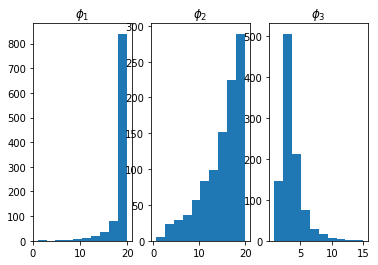

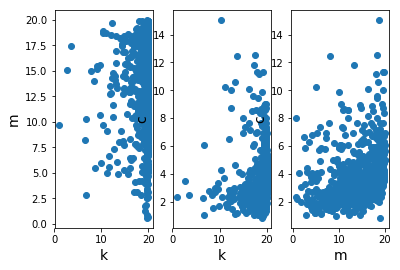

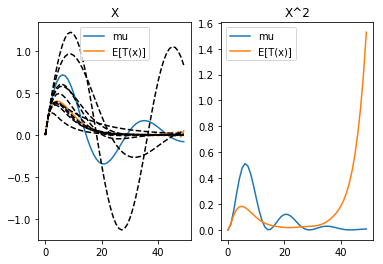

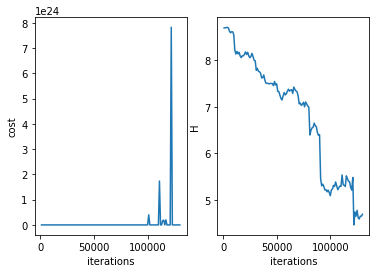

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 14
resetting optimizer
aug lag it 13
lambda [ 0.00000000e+00  1.36296176e+15 -5.41466310e+15 -1.49763523e+16
 -2.45395507e+16 -3.22959168e+16 -3.74945599e+16 -3.95887674e+16
 -3.87565782e+16 -3.50346024e+16 -2.90941961e+16 -2.12100257e+16
 -1.22943748e+16 -2.62234472e+15  6.82190130e+15  1.59381345e+16
  2.37727413e+16  3.05209318e+16  3.52968821e+16  3.86615434e+16
  3.97723927e+16  3.95860012e+16  3.72256304e+16  3.40485500e+16
  2.90257122e+16  2.39145763e+16  1.73881477e+16  1.16179466e+16
  4.81647877e+15 -3.84211185e+14 -6.40583250e+15 -1.00616122e+16
 -1.45929438e+16 -1.61045231e+16 -1.88620415e+16 -1.80388396e+16
 -1.91625957e+16 -1.61748135e+16 -1.61557830e+16 -1.14270508e+16
 -1.09902808e+16 -5.05763579e+15 -5.02934055e+15  1.60231305e+15
  4.17251167e+14  7.40285891e+15  4.

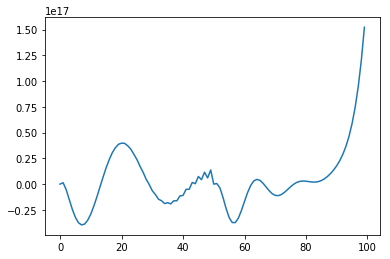

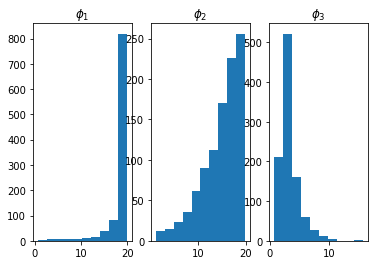

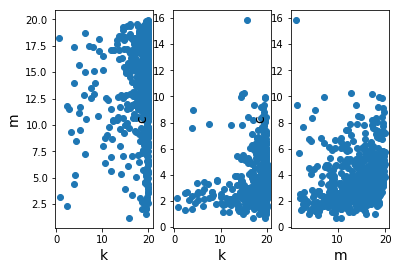

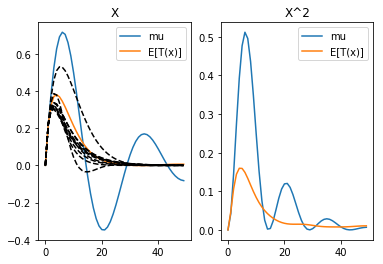

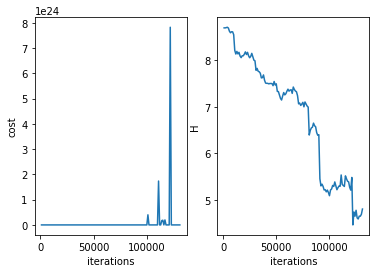

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 132000 
H 4.7233670003469195
cost 1.6479273632962427e+18
system.D 3


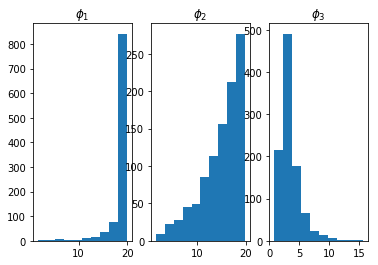

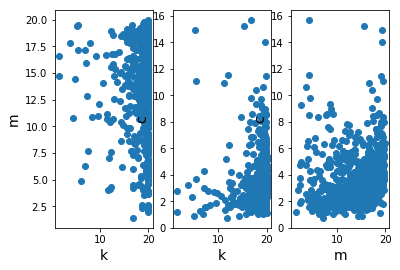

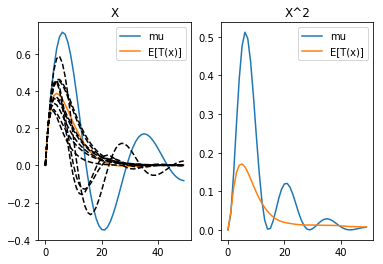

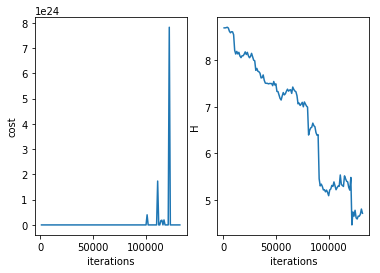

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 133000 
H 4.6583508601973955
cost 1.6951957628122063e+18
system.D 3


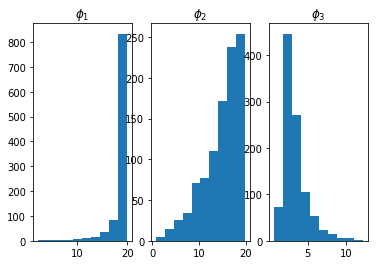

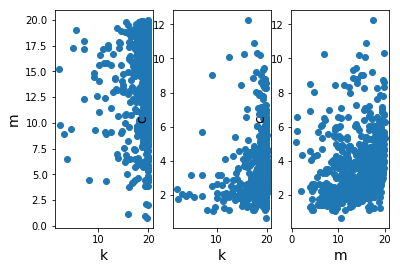

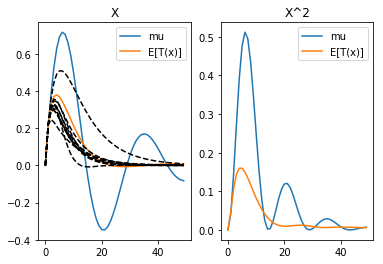

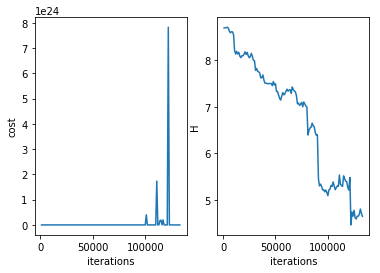

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 134000 
H 4.630022785111164
cost 1.7349979345206643e+18
system.D 3


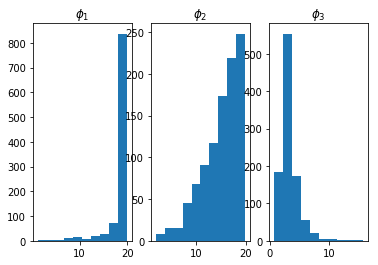

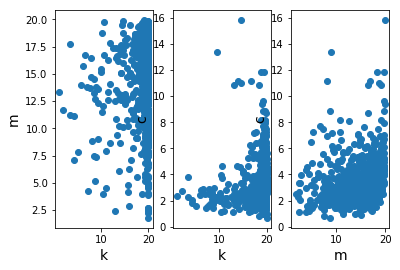

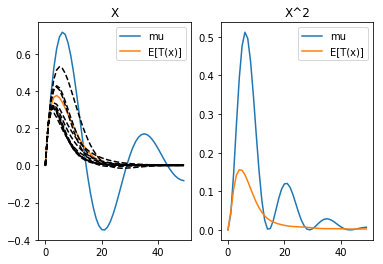

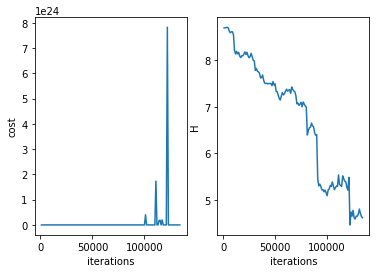

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 135000 
H 4.786918452778547
cost 1.7223817711836646e+18
system.D 3


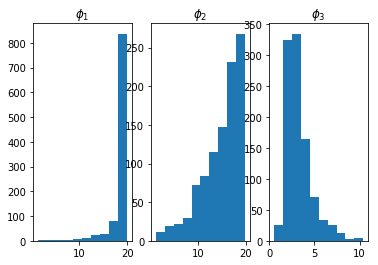

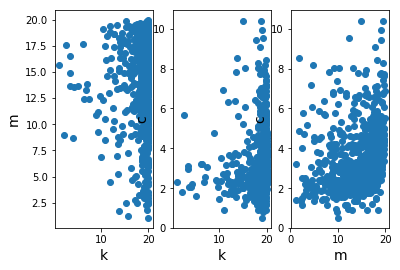

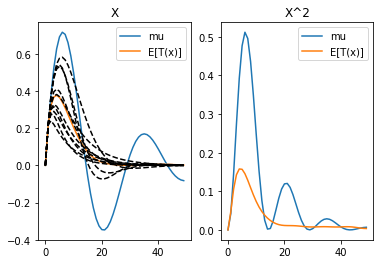

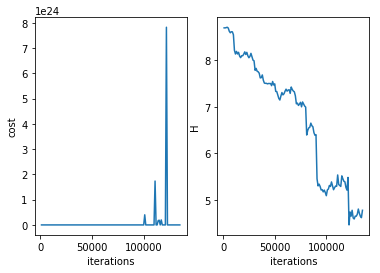

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 136000 
H 4.73689794460898
cost 1.6603002501584932e+18
system.D 3


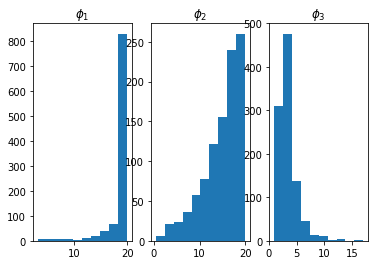

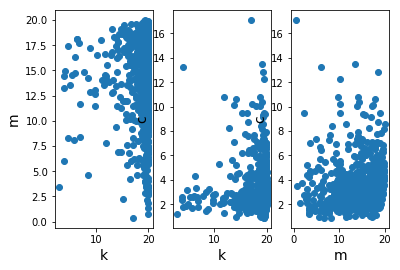

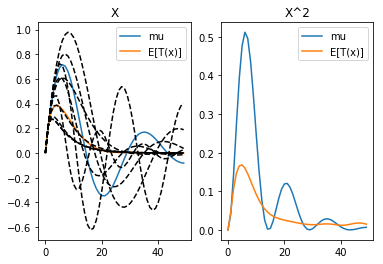

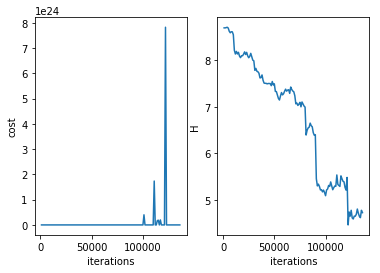

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 137000 
H 4.627084024311093
cost 1.689025793773462e+18
system.D 3


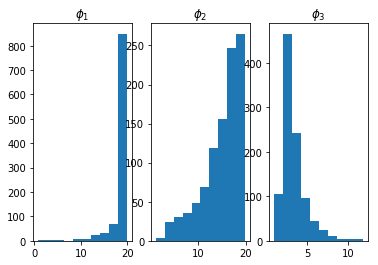

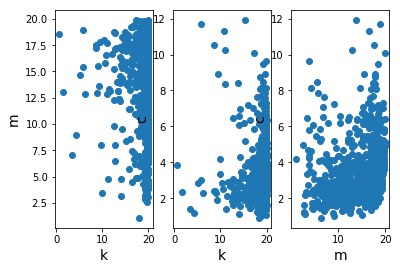

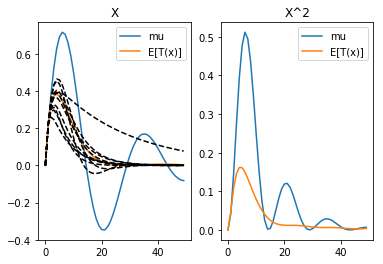

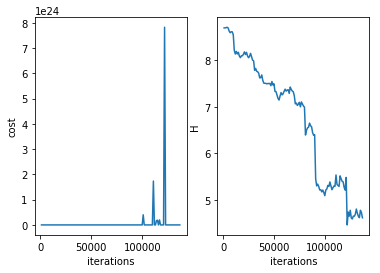

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 138000 
H 4.911342232019202
cost 1.7041023854985654e+18
system.D 3


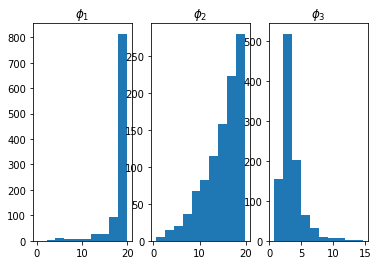

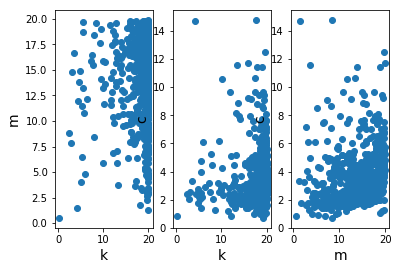

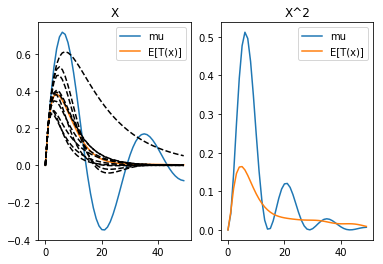

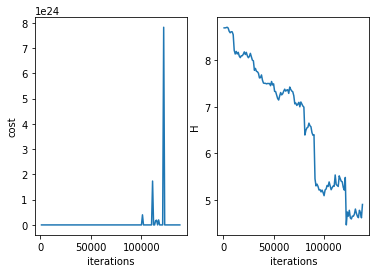

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 139000 
H 4.702768179370641
cost 1.74762708032402e+18
system.D 3


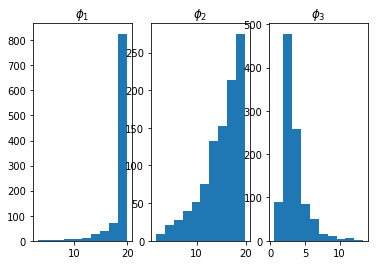

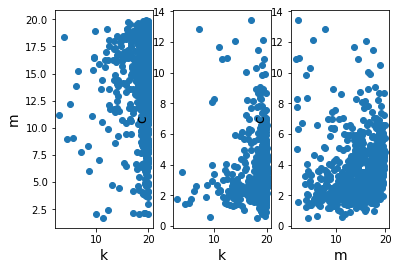

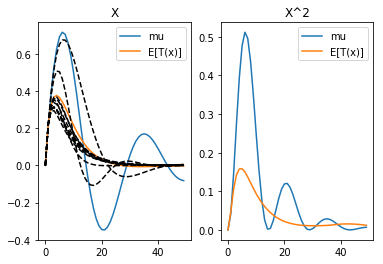

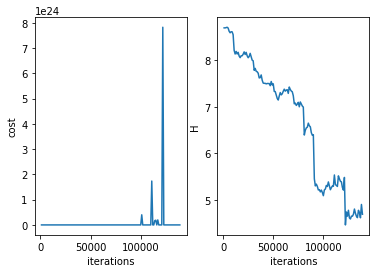

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 140000 
H 4.713449182776936
cost 1.7464128034579712e+18
system.D 3


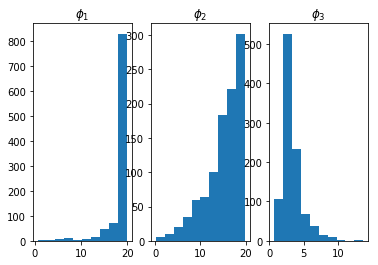

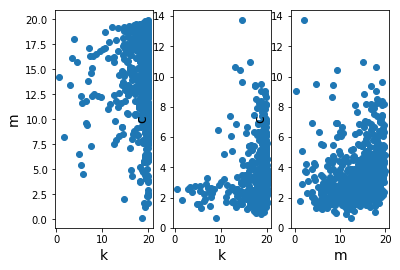

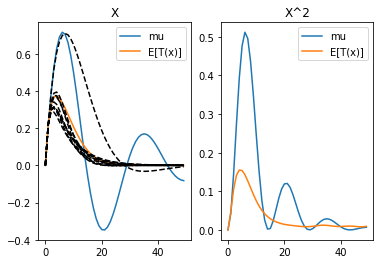

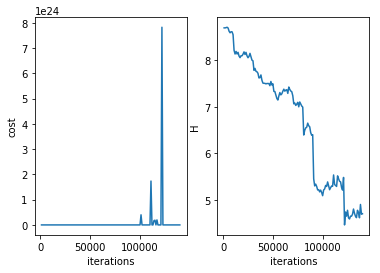

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 15
resetting optimizer
aug lag it 14
lambda [ 0.00000000e+00  1.36296176e+16 -6.51740870e+16 -1.72385439e+17
 -2.76901406e+17 -3.60497227e+17 -4.14865386e+17 -4.36197383e+17
 -4.25340851e+17 -3.84961017e+17 -3.20238156e+17 -2.36713253e+17
 -1.41214293e+17 -3.98610847e+16  6.07063816e+16  1.55376576e+17
  2.38902996e+17  3.08154949e+17  3.59885743e+17  3.93343197e+17
  4.07337557e+17  4.03402935e+17  3.82020449e+17  3.46565353e+17
  2.98508936e+17  2.42436118e+17  1.79995863e+17  1.16332386e+17
  5.24766899e+16 -6.39419407e+15 -6.05338551e+16 -1.05033968e+17
 -1.41907726e+17 -1.66540070e+17 -1.82977440e+17 -1.86640639e+17
 -1.83719682e+17 -1.69164294e+17 -1.51329899e+17 -1.23993945e+17
 -9.77077185e+16 -6.42420580e+16 -3.64875393e+16 -3.29104452e+15
  1.97628685e+16  4.77271359e+16  6.

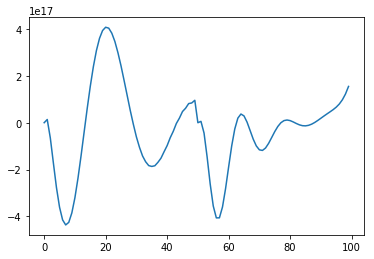

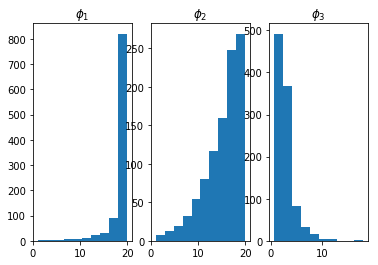

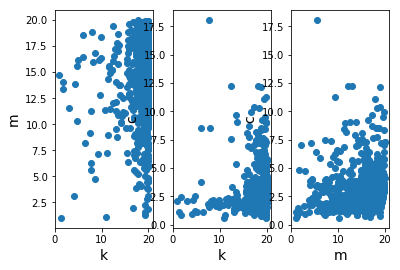

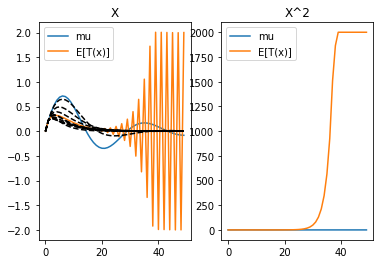

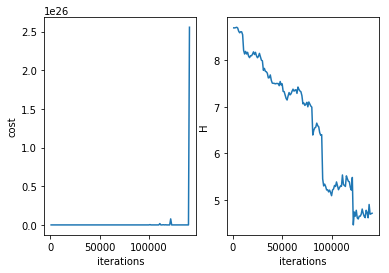

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 142000 
H 4.710093055486443
cost 2.2692959474727463e+27
system.D 3


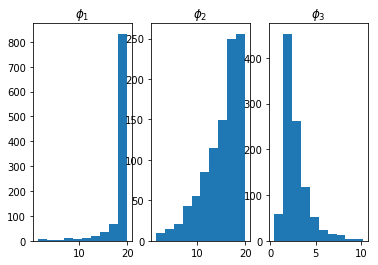

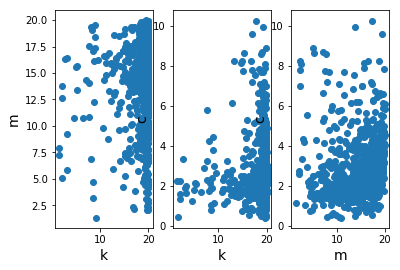

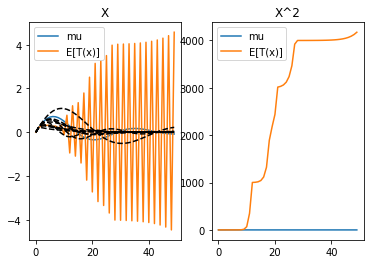

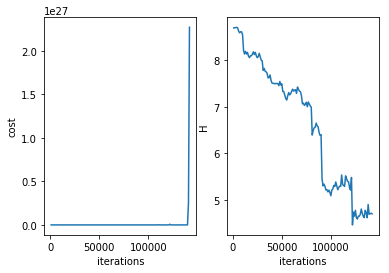

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 143000 
H 4.566301493134719
cost 8.83685415708579e+25
system.D 3


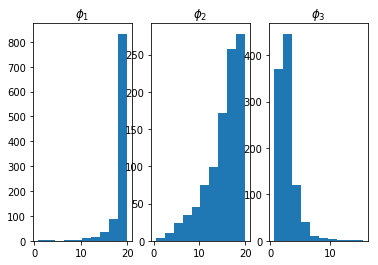

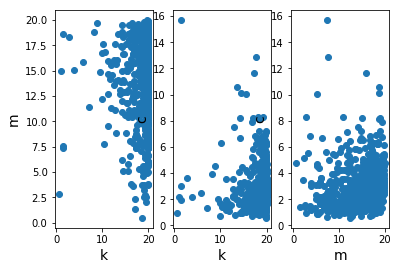

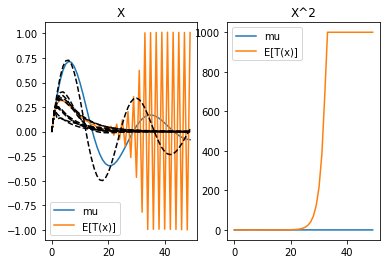

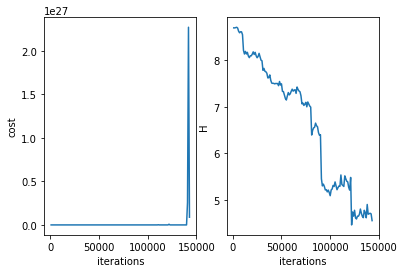

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 144000 
H 4.609004684496813
cost 1.4872744802436316e+26
system.D 3


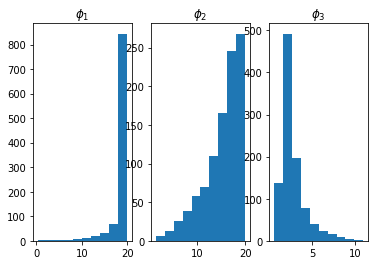

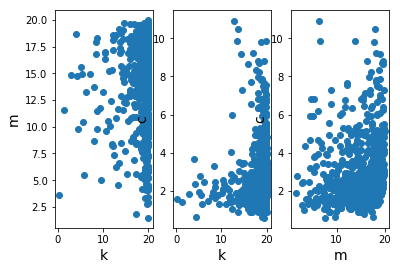

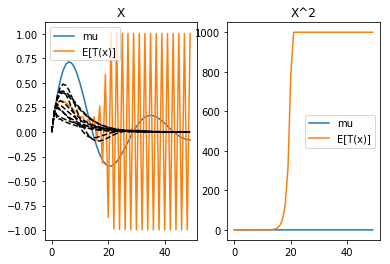

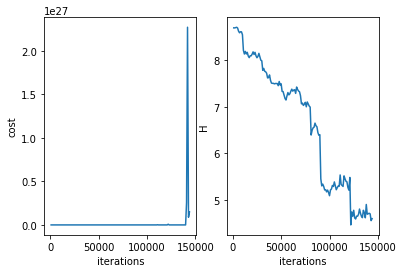

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 145000 
H 4.870715621777786
cost 1.5080788858561546e+19
system.D 3


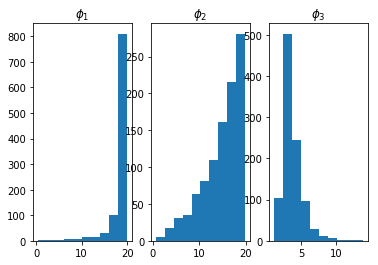

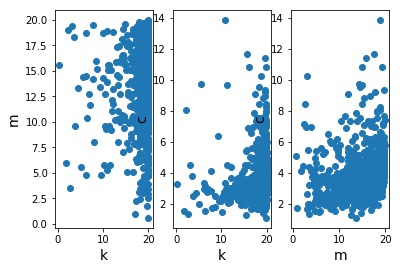

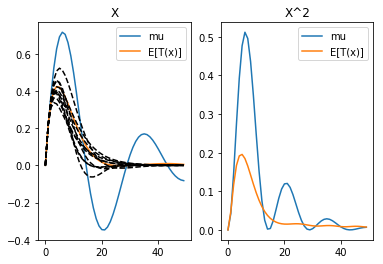

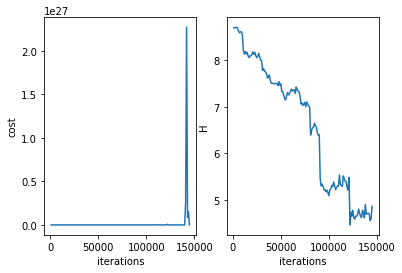

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 146000 
H 4.84929482565437
cost 1.4684190178380515e+19
system.D 3


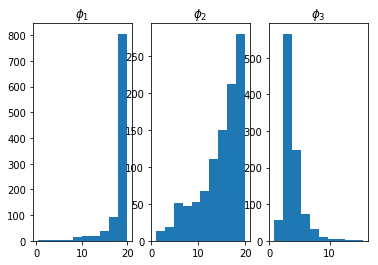

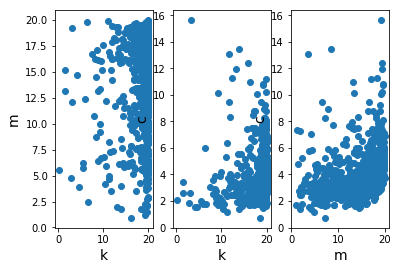

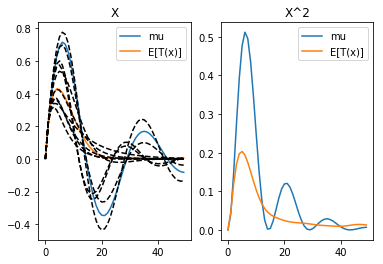

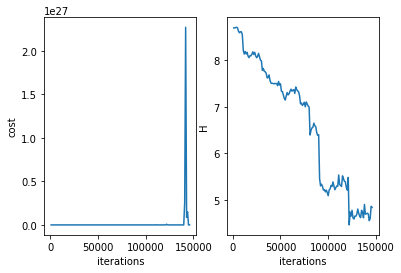

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 147000 
H 4.71648772090202
cost 1.4871391577993632e+19
system.D 3


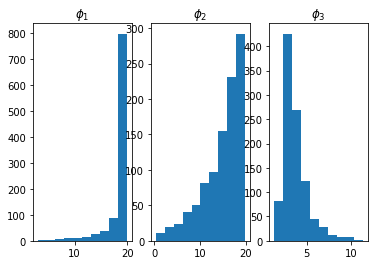

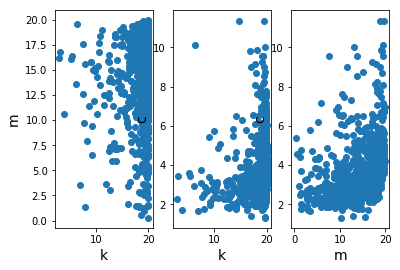

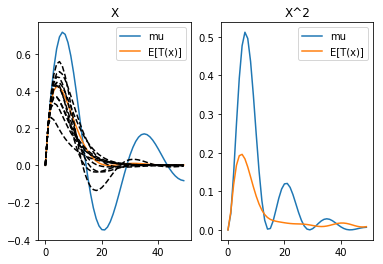

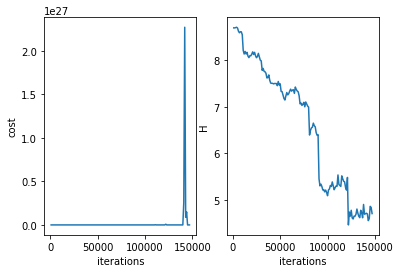

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 148000 
H 4.681351123058455
cost 1.5055684714633398e+19
system.D 3


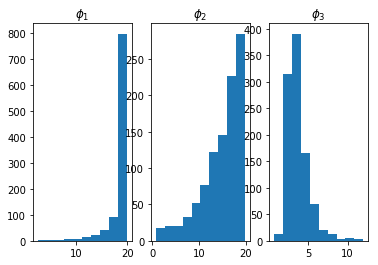

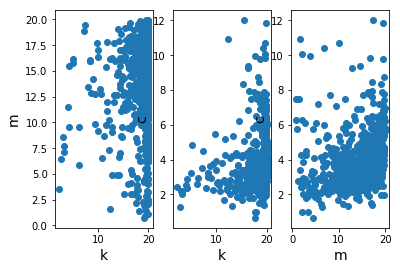

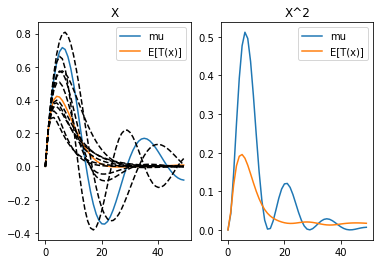

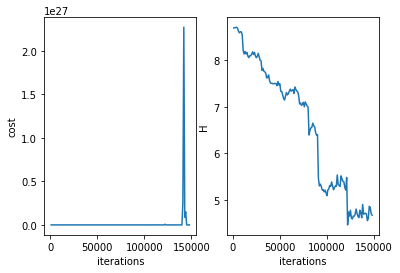

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 149000 
H 4.564765487179508
cost 1.5385153645296116e+19
system.D 3


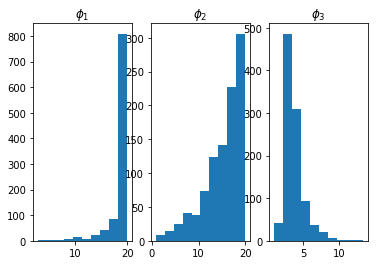

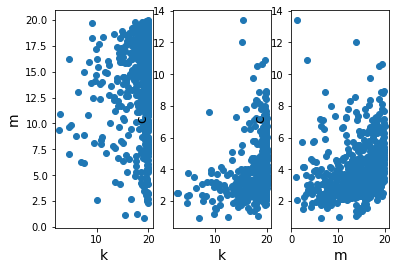

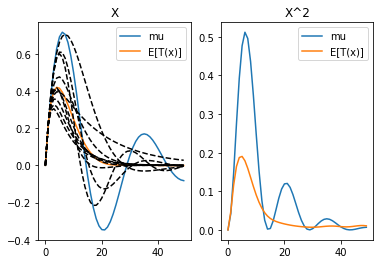

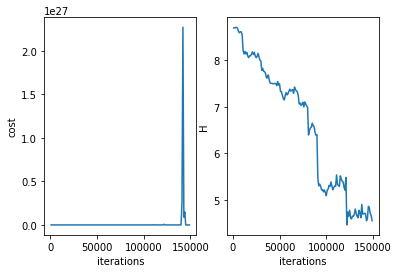

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 150000 
H 4.690555030776253
cost 1.5051511339174803e+19
system.D 3


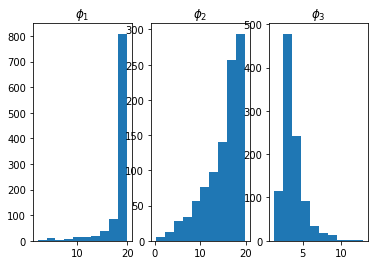

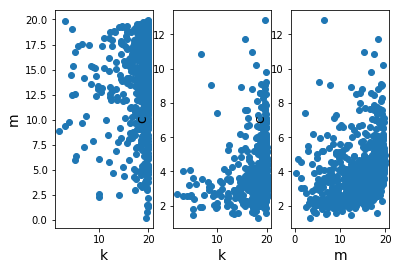

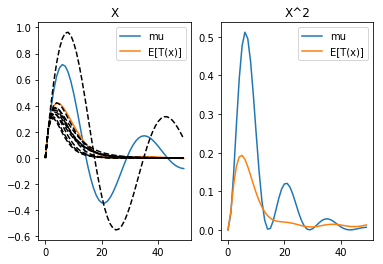

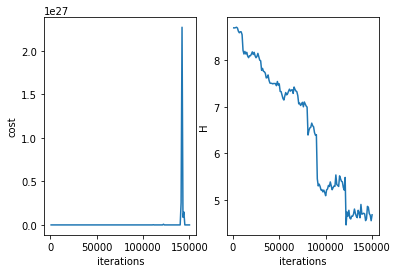

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 16
resetting optimizer
aug lag it 15
lambda [ 0.00000000e+00  1.36296176e+17 -4.87819204e+17 -1.40389545e+18
 -2.33094541e+18 -3.09830085e+18 -3.61174943e+18 -3.82883332e+18
 -3.74596707e+18 -3.38604732e+18 -2.79166611e+18 -2.01681059e+18
 -1.12261882e+18 -1.71021259e+17  7.77656920e+17  1.66965835e+18
  2.45834357e+18  3.10797079e+18  3.59233720e+18  3.89765274e+18
  4.01932419e+18  3.96436410e+18  3.74648271e+18  3.38862269e+18
  2.91656760e+18  2.36228344e+18  1.75620231e+18  1.13207849e+18
  5.17965560e+17 -5.67236984e+16 -5.71739927e+17 -1.00607536e+18
 -1.35043651e+18 -1.59381038e+18 -1.73861784e+18 -1.78306881e+18
 -1.74001705e+18 -1.61427219e+18 -1.42647522e+18 -1.18429874e+18
 -9.12981241e+17 -6.18993736e+17 -3.29233676e+17 -4.52554717e+16
  2.06433922e+17  4.32103455e+17  6.

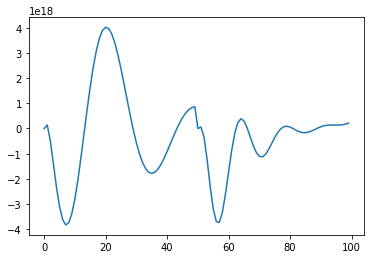

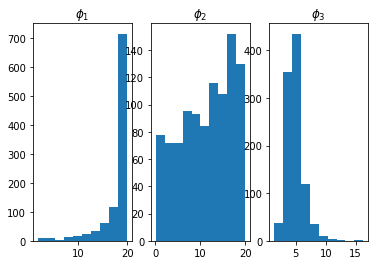

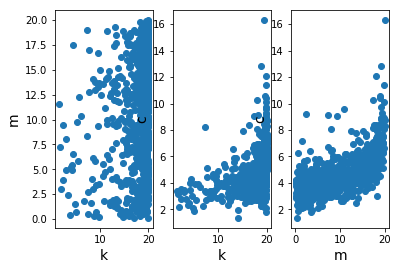

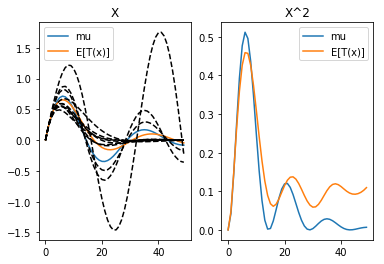

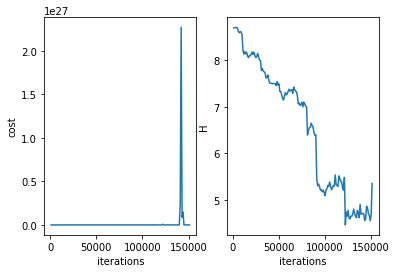

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 152000 
H 5.240428837927171
cost 3.766133719426402e+19
system.D 3


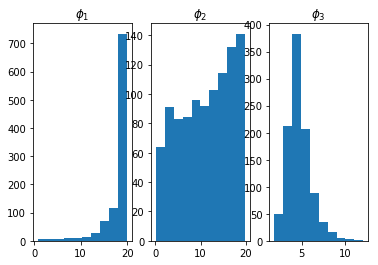

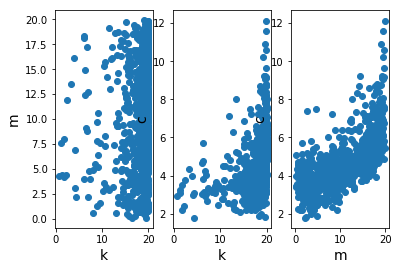

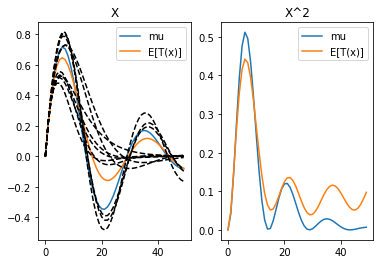

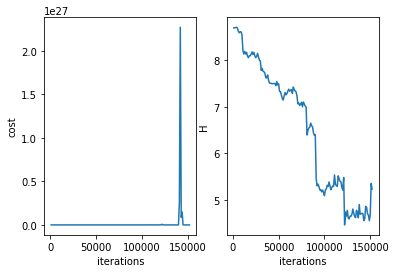

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 153000 
H 5.01342822138494
cost 6.194678022616534e+19
system.D 3


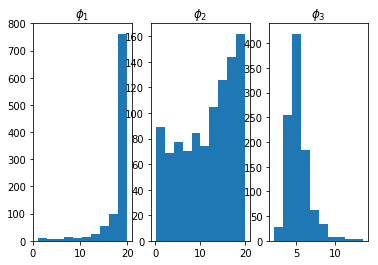

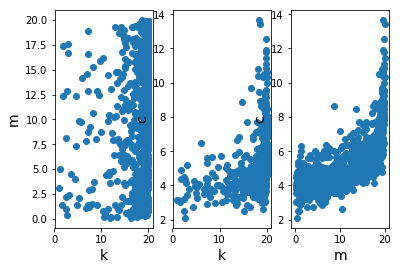

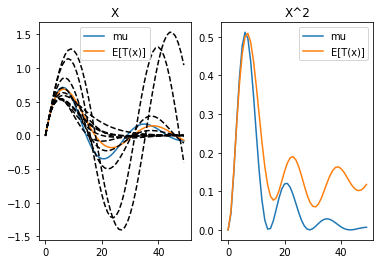

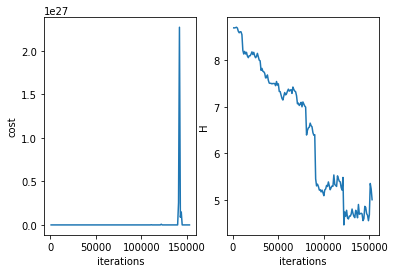

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 154000 
H 4.8221402403717715
cost 5.060954416700388e+19
system.D 3


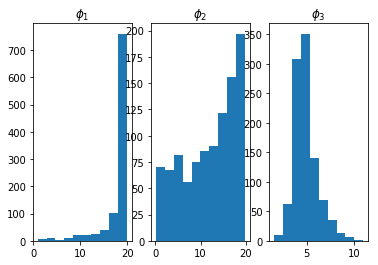

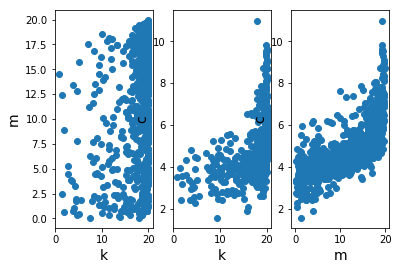

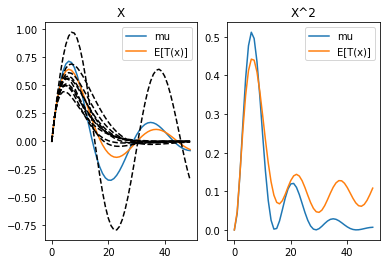

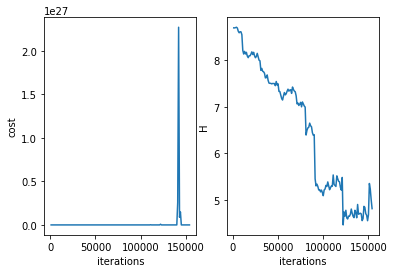

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 155000 
H 4.7203385815477
cost 4.438574335648898e+19
system.D 3


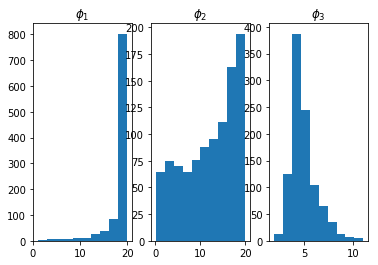

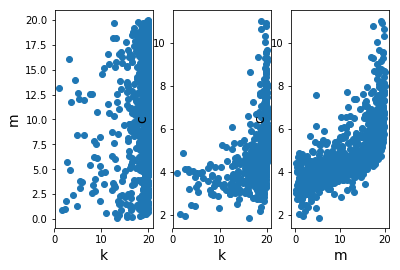

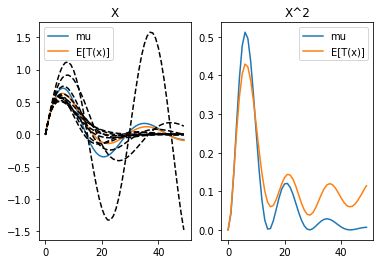

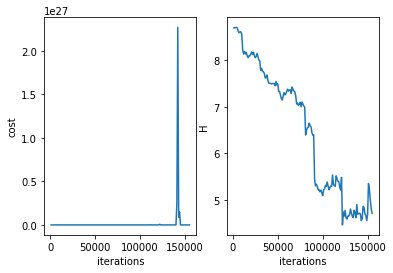

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 156000 
H 4.676035510625756
cost 4.652016794515776e+19
system.D 3


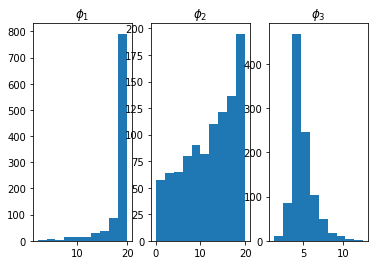

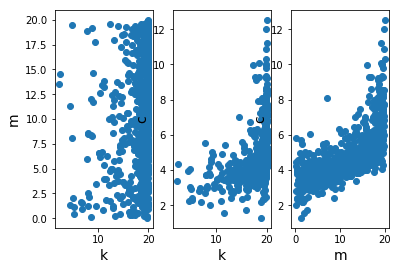

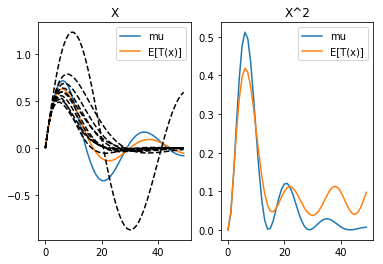

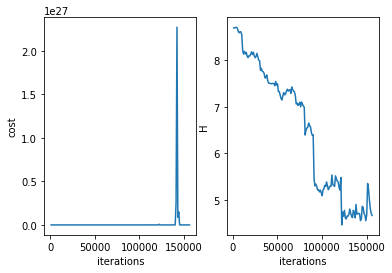

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 157000 
H 4.802927068852709
cost 4.336417888209234e+19
system.D 3


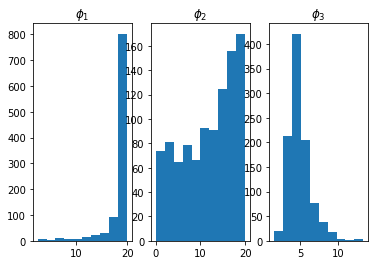

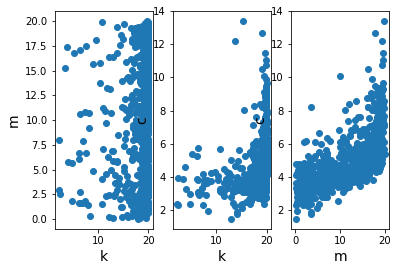

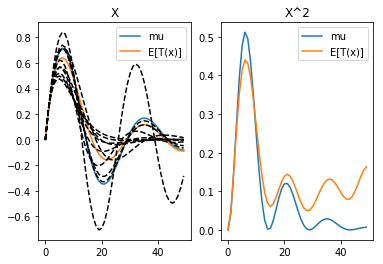

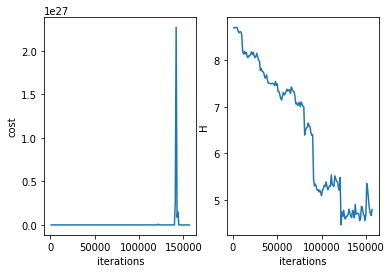

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 158000 
H 4.65933225937732
cost 1.1463377458409864e+21
system.D 3


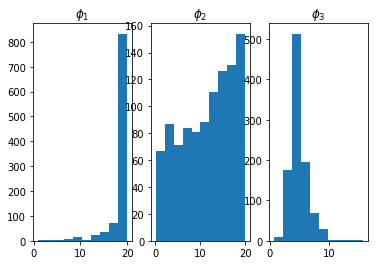

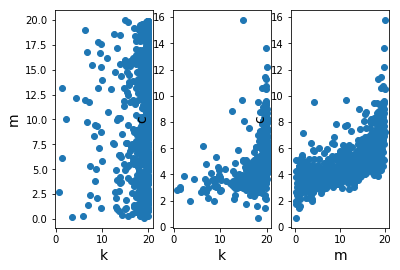

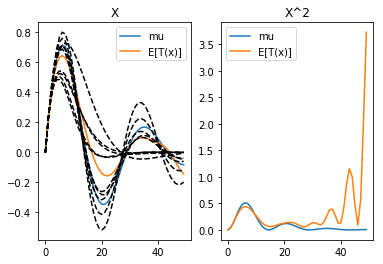

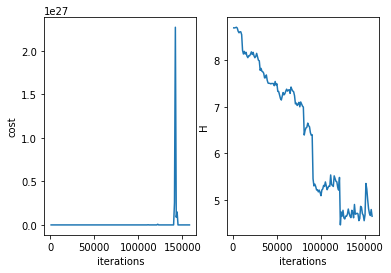

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 159000 
H 4.528195494878097
cost 8.20062816944071e+19
system.D 3


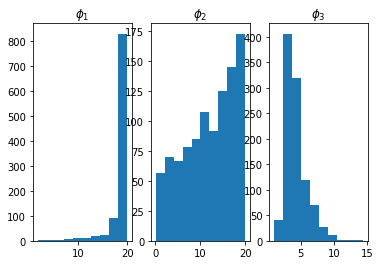

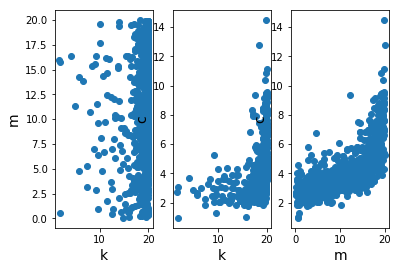

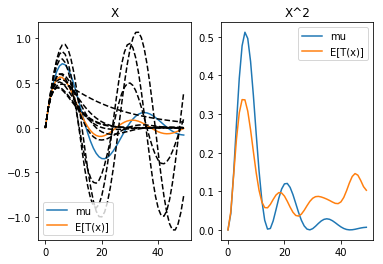

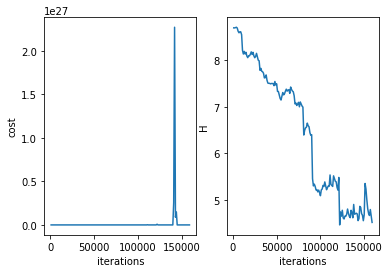

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 160000 
H 4.655442650184174
cost 4.137873044213973e+19
system.D 3


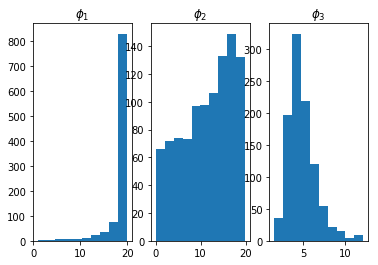

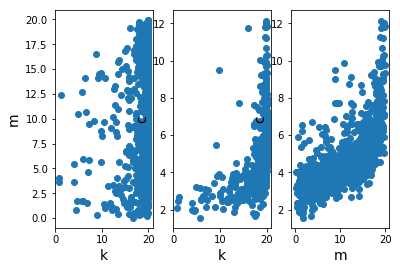

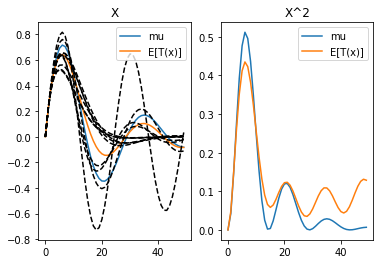

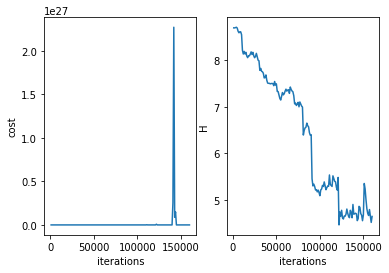

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 17
resetting optimizer
aug lag it 16
lambda [ 0.00000000e+00  1.36296176e+18 -1.71497522e+17 -3.11055576e+18
 -6.36026816e+18 -9.14368511e+18 -1.09549201e+19 -1.15159222e+19
 -1.07399826e+19 -8.69226384e+18 -5.55414341e+18 -1.58586461e+18
  2.90548740e+18  7.59763879e+18  1.21773892e+19  1.63633562e+19
  1.99198645e+19  2.26695391e+19  2.44964018e+19  2.53492169e+19
  2.52353068e+19  2.42172101e+19  2.23999672e+19  1.99245361e+19
  1.69516966e+19  1.36557635e+19  1.02078955e+19  6.77309612e+18
  3.49480014e+18  4.97225110e+17 -2.12808546e+18 -4.31352230e+18
 -6.02743766e+18 -7.25884673e+18 -8.02956794e+18 -8.37272885e+18
 -8.34726688e+18 -8.01071221e+18 -7.43866826e+18 -6.69202355e+18
 -5.84412715e+18 -4.94189047e+18 -4.04331030e+18 -3.17095721e+18
 -2.36242882e+18 -1.61359211e+18 -9.

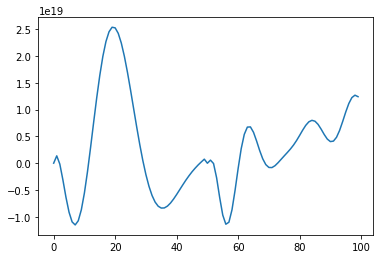

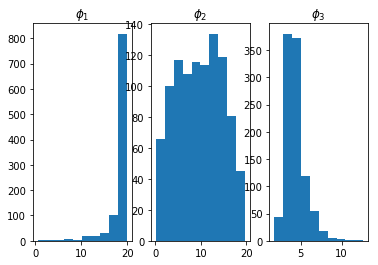

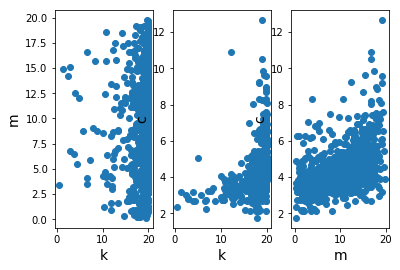

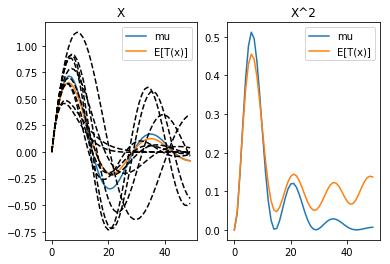

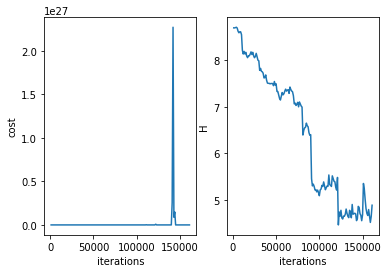

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 162000 
H 4.70918577165715
cost 2.3736157802788782e+20
system.D 3


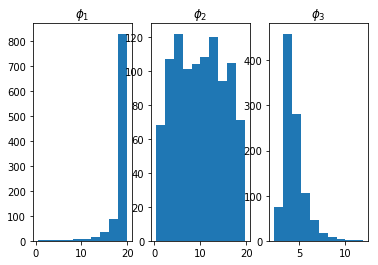

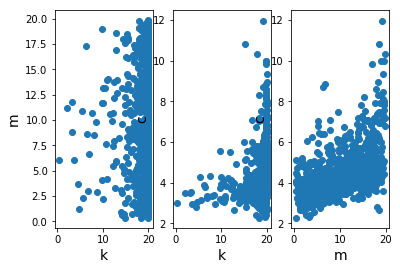

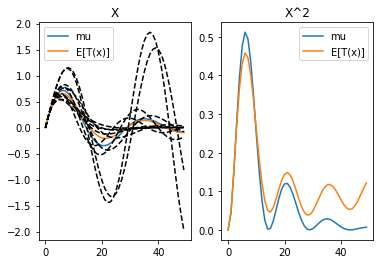

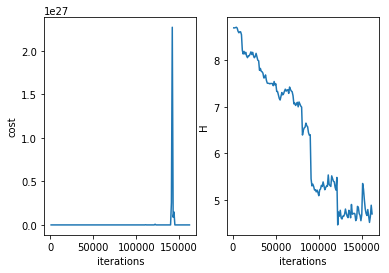

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 163000 
H 4.808656556594631
cost 2.4591333727319002e+20
system.D 3


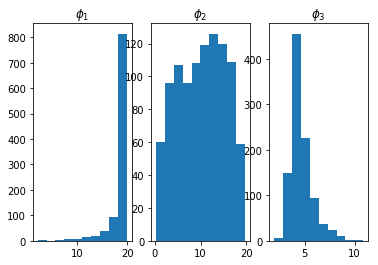

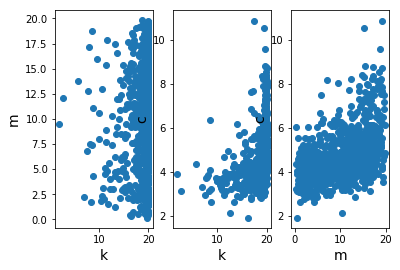

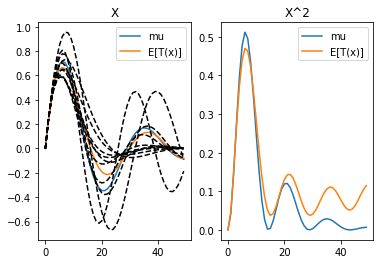

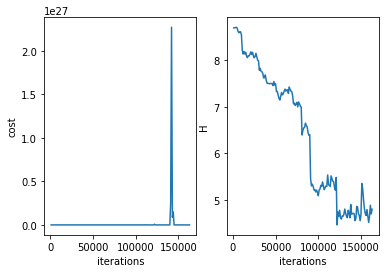

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 164000 
H 4.7255607792482355
cost 2.3496715242598207e+20
system.D 3


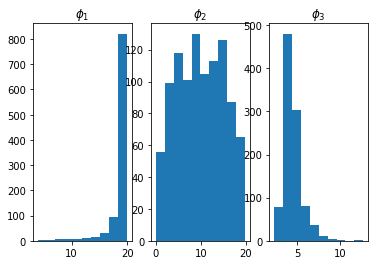

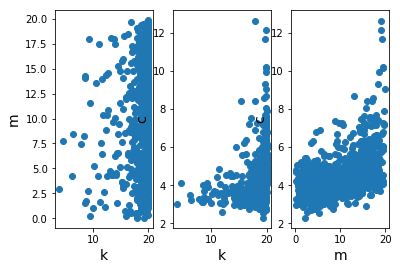

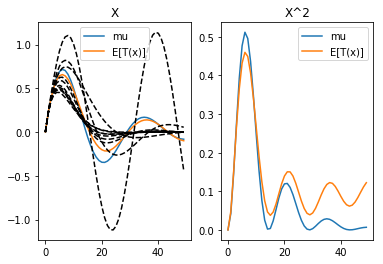

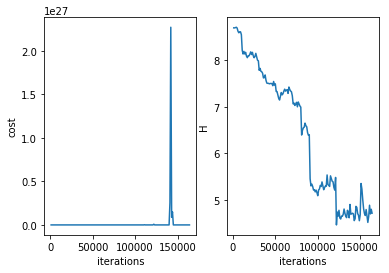

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 165000 
H 4.825427773472236
cost 2.554827735295184e+20
system.D 3


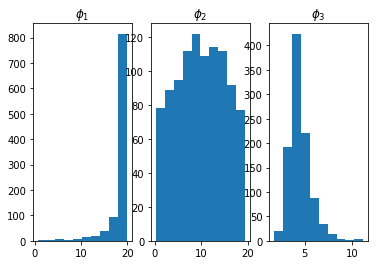

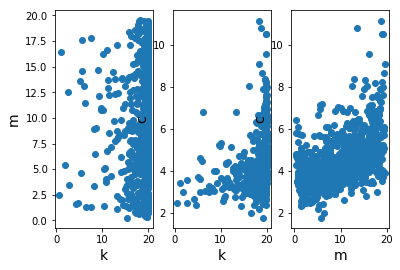

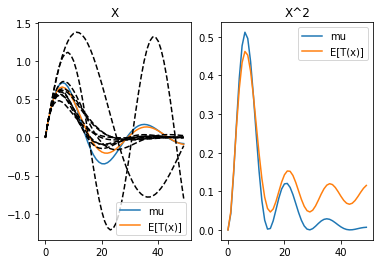

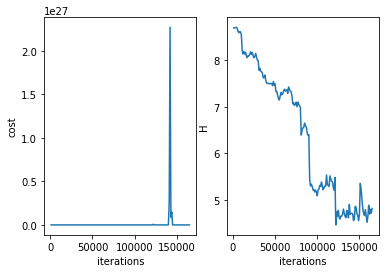

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 166000 
H 4.721999621016008
cost 2.4789780745803163e+20
system.D 3


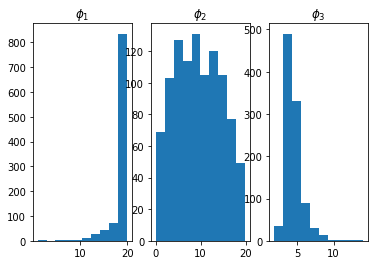

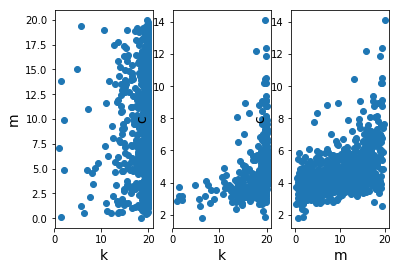

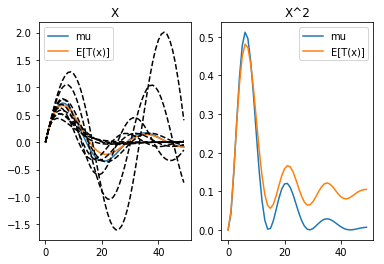

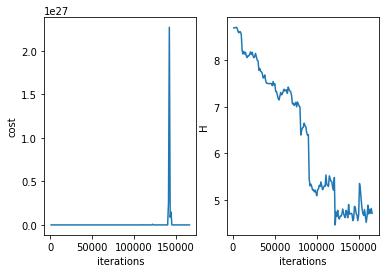

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 167000 
H 4.418391729578097
cost 2.0887484230424822e+20
system.D 3


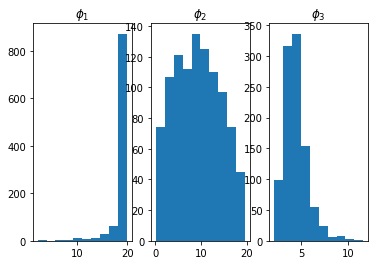

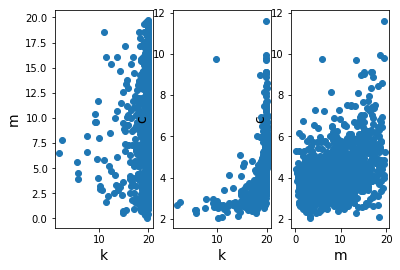

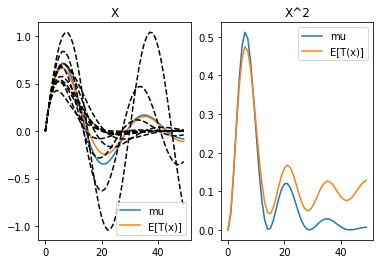

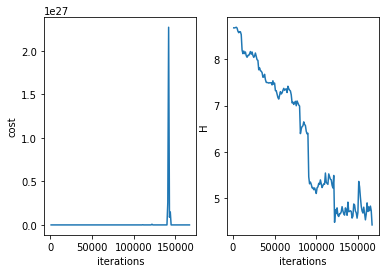

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 168000 
H 4.473462344055873
cost 3.595791974240708e+20
system.D 3


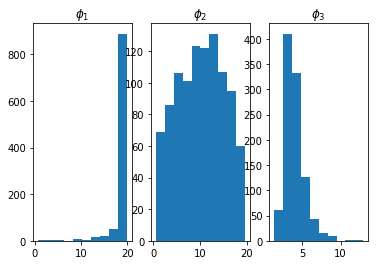

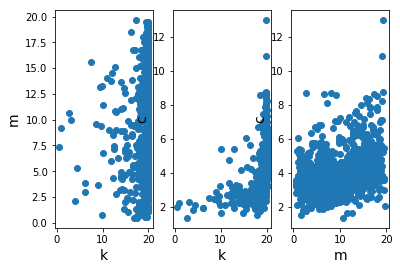

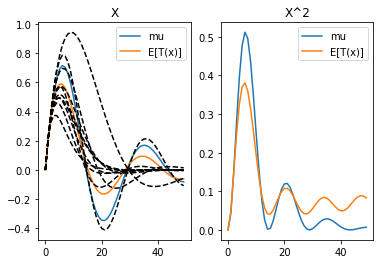

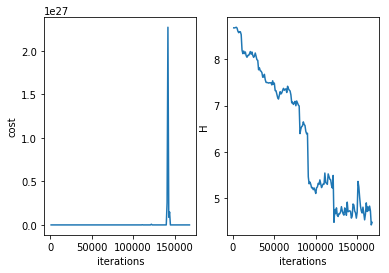

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 169000 
H 4.501629094004436
cost 2.0590155664675473e+28
system.D 3


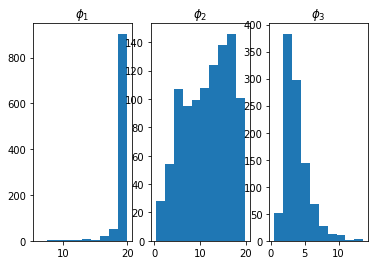

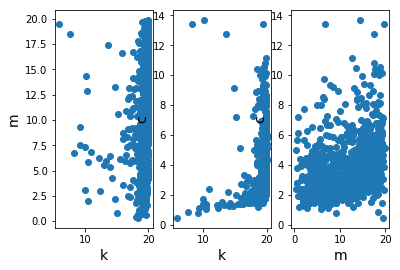

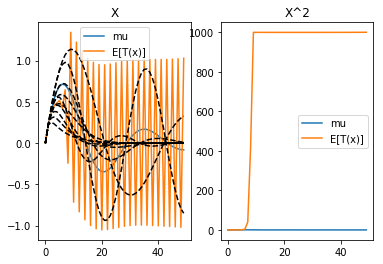

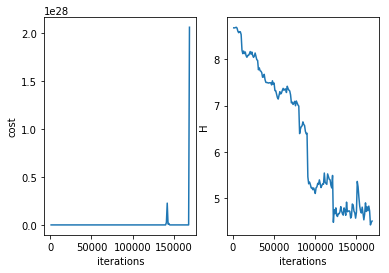

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 170000 
H 4.363428822402624
cost 9.419537501878147e+20
system.D 3


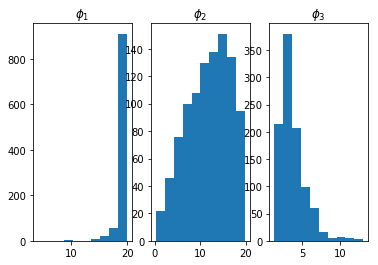

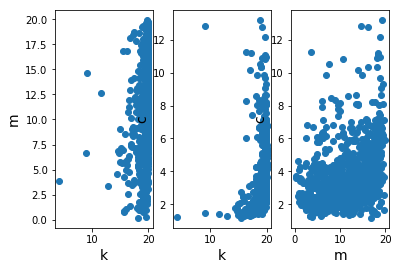

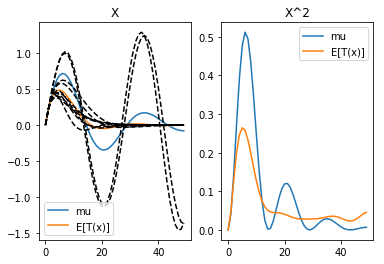

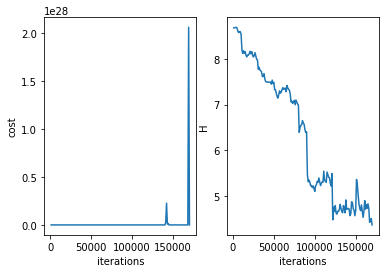

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 18
resetting optimizer
aug lag it 17
lambda [ 0.00000000e+00  1.36296176e+19 -2.49197037e+19 -8.67061841e+19
 -1.53922777e+20 -2.14105899e+20 -2.59134405e+20 -2.84272928e+20
 -2.87583604e+20 -2.69382714e+20 -2.31752455e+20 -1.78071920e+20
 -1.12578775e+20 -3.99612570e+19  3.50039287e+19  1.07766075e+20
  1.74253787e+20  2.31070871e+20  2.75625330e+20  3.06202481e+20
  3.21976037e+20  3.22975138e+20  3.10002237e+20  2.84525574e+20
  2.48539324e+20  2.04419571e+20  1.54764389e+20  1.02249861e+20
  4.94827258e+19 -1.11464321e+18 -4.74162288e+19 -8.76604657e+19
 -1.20515852e+20 -1.45095684e+20 -1.60977504e+20 -1.68167946e+20
 -1.67085153e+20 -1.58484156e+20 -1.43417128e+20 -1.23133224e+20
 -9.90339517e+19 -7.25616118e+19 -4.51666262e+19 -1.81962424e+19
  7.11189065e+18  2.97334752e+19  4.

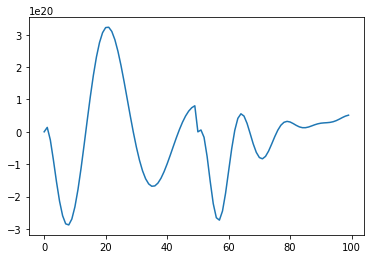

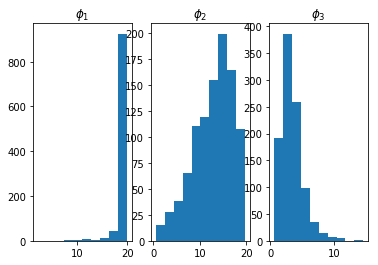

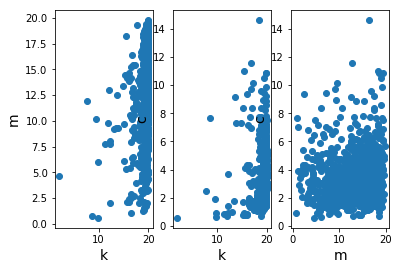

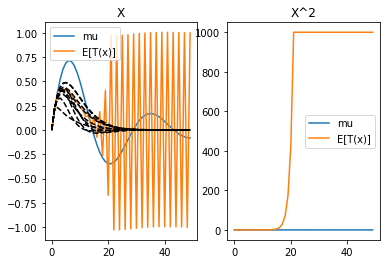

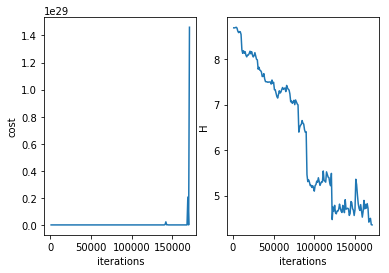

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 172000 
H 4.316266730139078
cost 6.78660345741451e+29
system.D 3


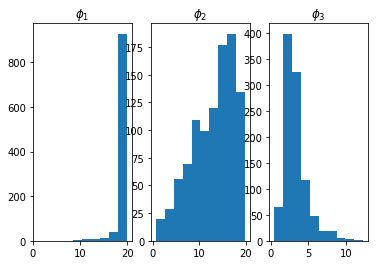

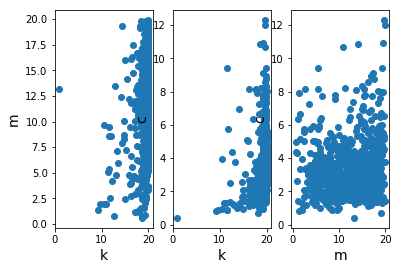

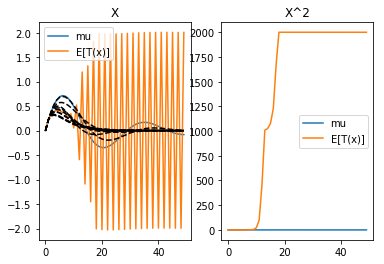

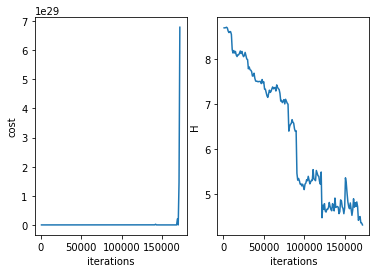

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 173000 
H 4.06087359505391
cost 1.225093856985787e+22
system.D 3


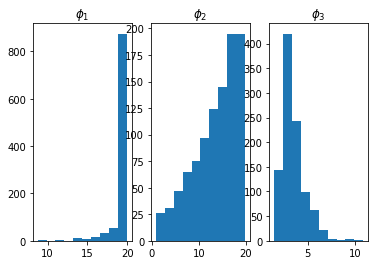

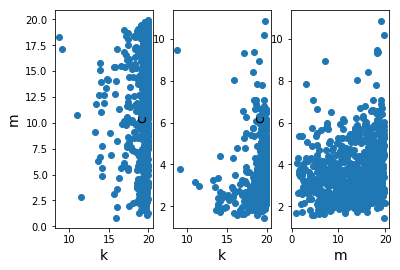

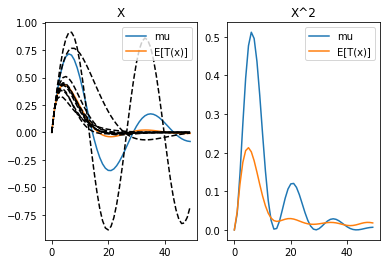

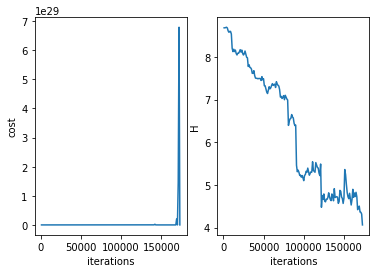

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 174000 
H 4.1243137808569115
cost 1.269823035568921e+22
system.D 3


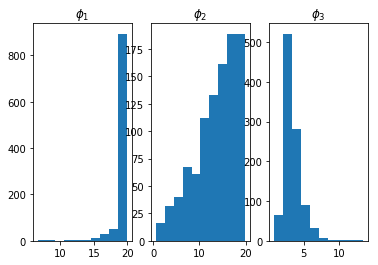

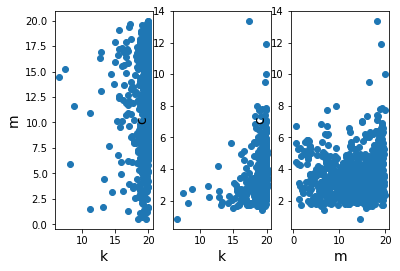

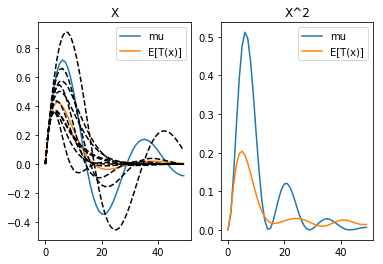

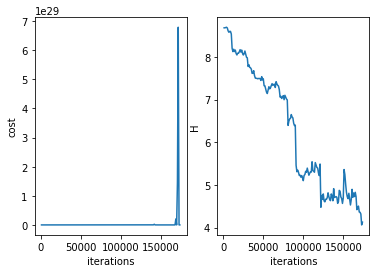

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 175000 
H 4.270554637706254
cost 1.2081258394796603e+22
system.D 3


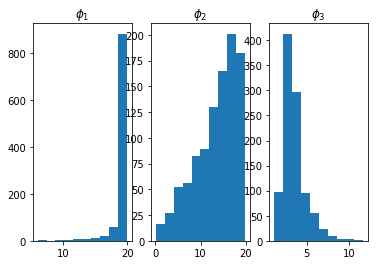

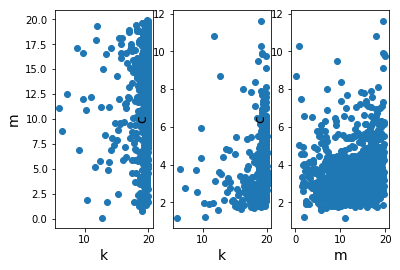

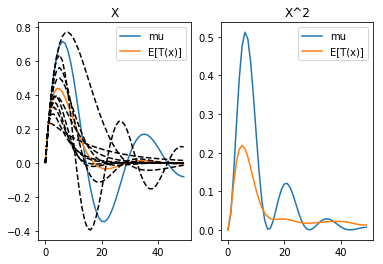

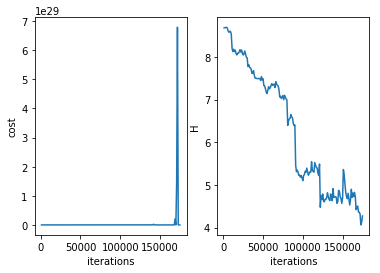

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 176000 
H 4.095517319155115
cost 1.2517626715971508e+22
system.D 3


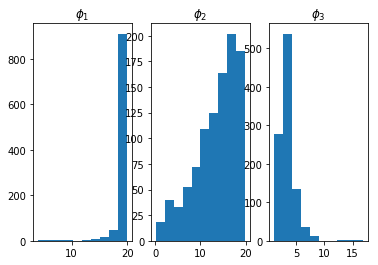

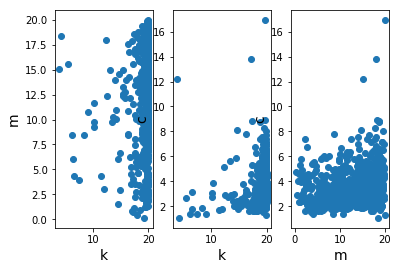

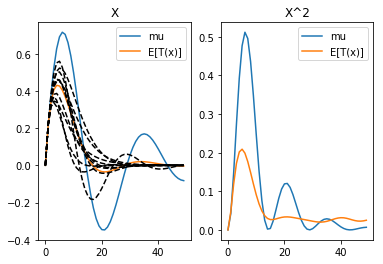

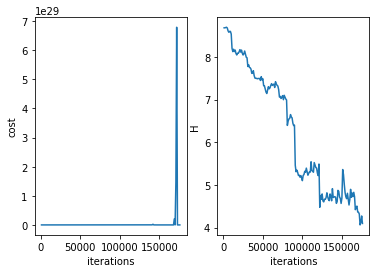

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 177000 
H 4.172550553759869
cost 1.2455399306327019e+22
system.D 3


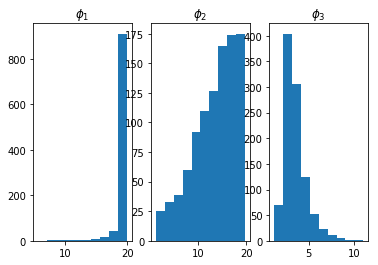

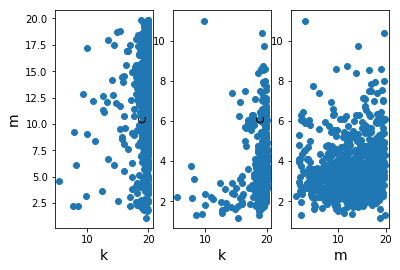

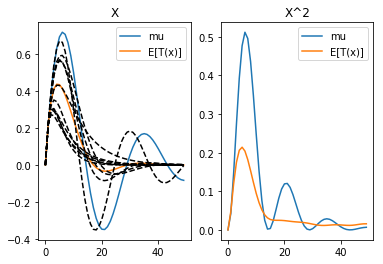

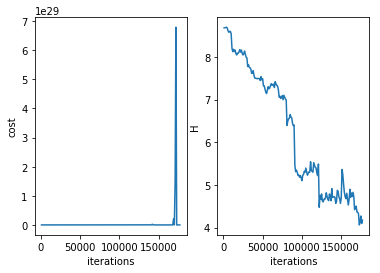

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 178000 
H 4.246312277635648
cost 1.213811285207521e+22
system.D 3


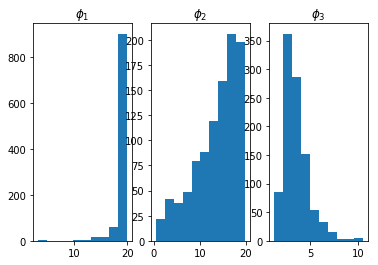

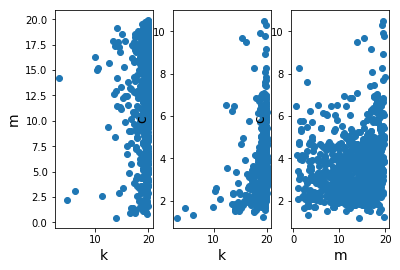

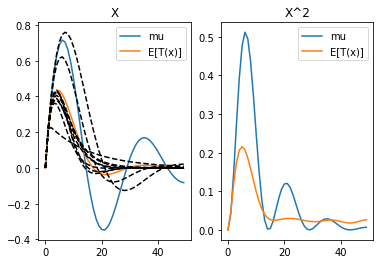

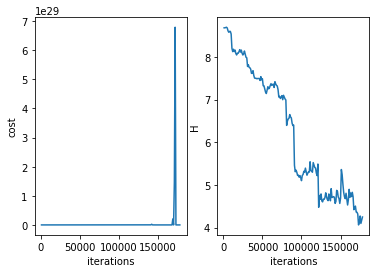

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 179000 
H 4.13280396235678
cost 1.2762134962949736e+22
system.D 3


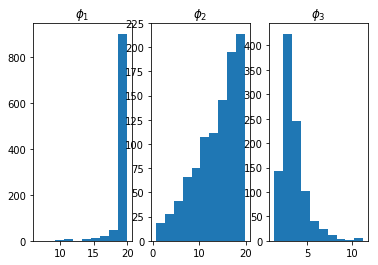

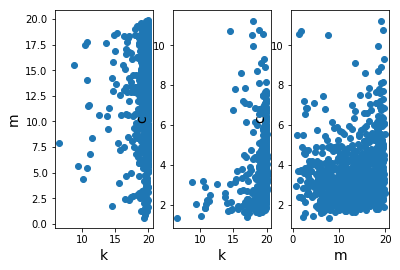

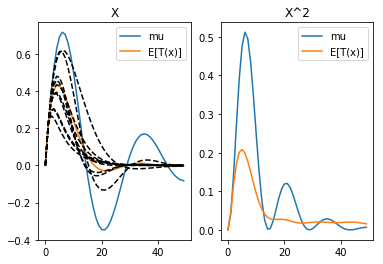

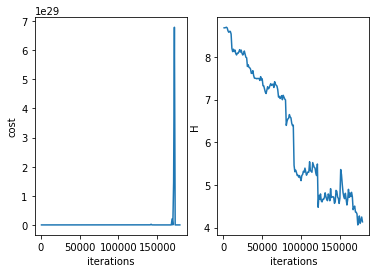

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 180000 
H 4.122932011757406
cost 1.296686058781588e+22
system.D 3


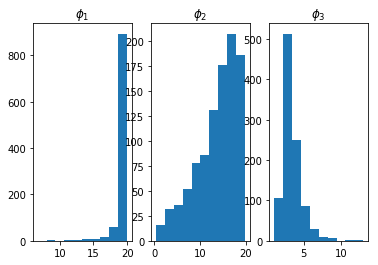

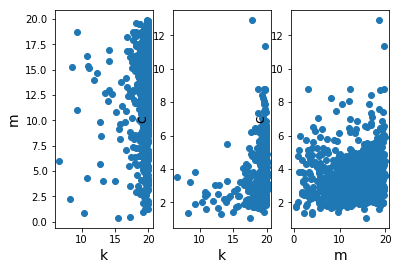

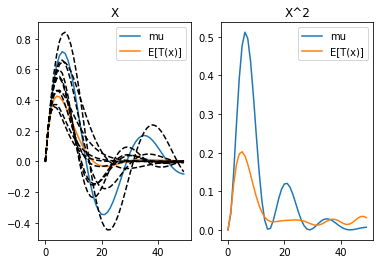

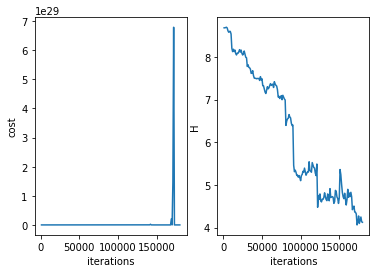

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 19
resetting optimizer
aug lag it 18
lambda [ 0.00000000e+00  1.36296176e+20 -4.41224906e+20 -1.29502867e+21
 -2.17179746e+21 -2.91528240e+21 -3.43577412e+21 -3.69017511e+21
 -3.66997123e+21 -3.39207163e+21 -2.89161196e+21 -2.21584835e+21
 -1.41891666e+21 -5.57319027e+20  3.13877603e+20  1.14413810e+21
  1.88983945e+21  2.51595150e+21  2.99703704e+21  3.31762833e+21
  3.47203589e+21  3.46368273e+21  3.30404314e+21  3.01129876e+21
  2.60879485e+21  2.12341086e+21  1.58391332e+21  1.01939269e+21
  4.57823495e+20 -7.51704705e+19 -5.57342221e+20 -9.70577841e+20
 -1.30141617e+21 -1.54128614e+21 -1.68652949e+21 -1.73816907e+21
 -1.70152085e+21 -1.58560497e+21 -1.40248056e+21 -1.16644319e+21
 -8.93235337e+20 -5.99180679e+20 -3.00419659e+20 -1.21178558e+19
  2.52143559e+20  4.80975496e+20  6.

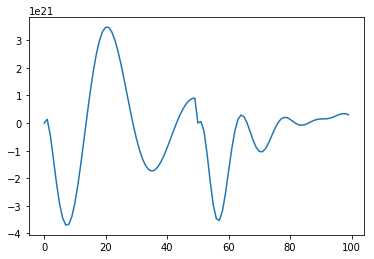

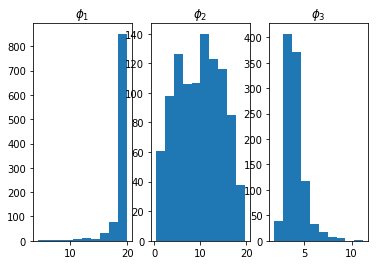

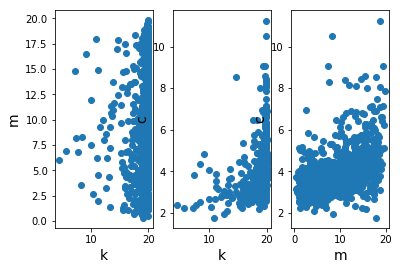

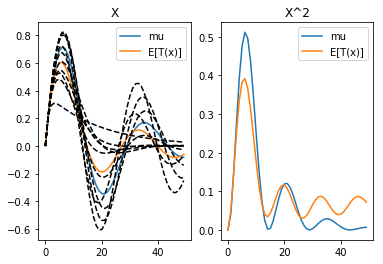

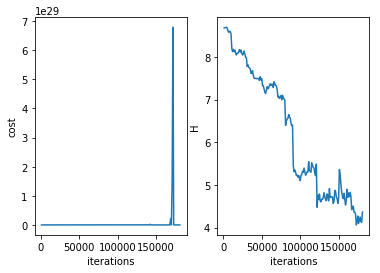

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 182000 
H 4.423557647964528
cost 3.366535748156905e+22
system.D 3


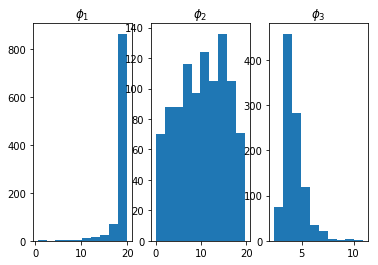

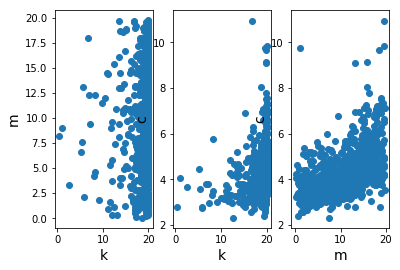

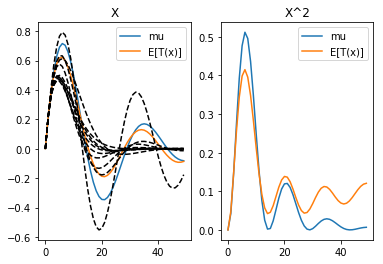

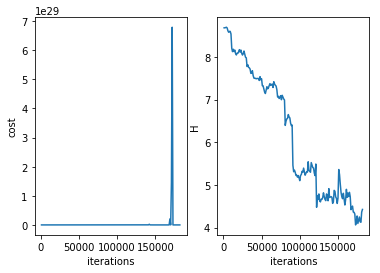

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 183000 
H 4.339606751117825
cost 2.6430757987494624e+22
system.D 3


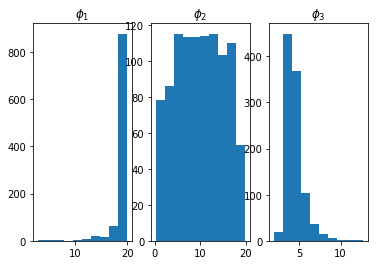

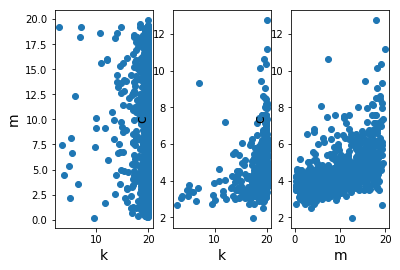

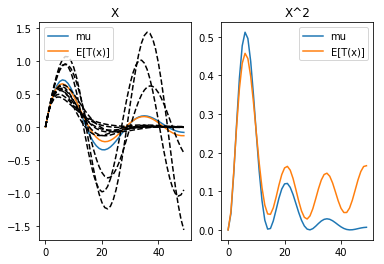

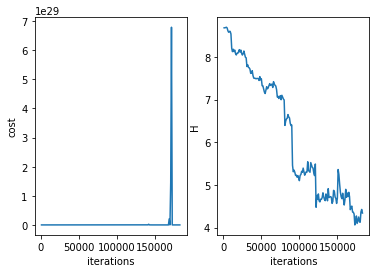

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 184000 
H 4.342931456898735
cost 2.3936220167388376e+22
system.D 3


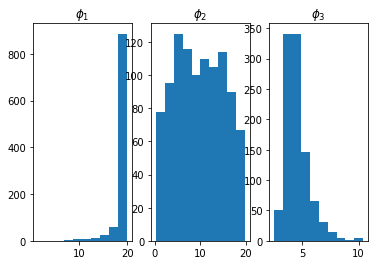

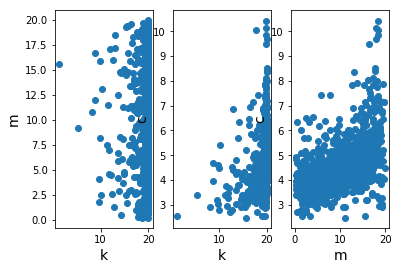

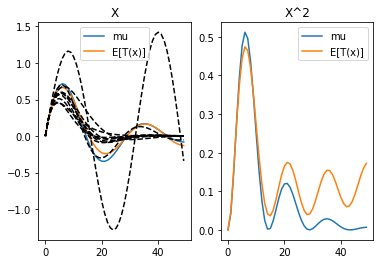

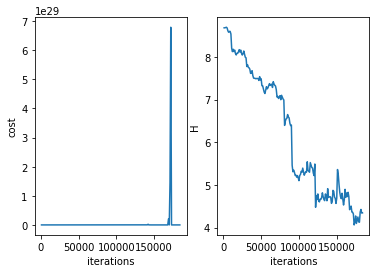

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 185000 
H 4.573740647238728
cost 2.308431637762529e+22
system.D 3


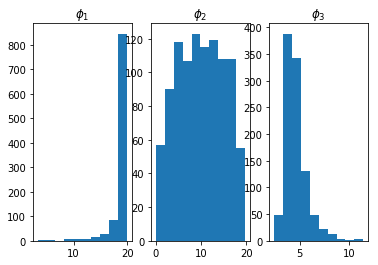

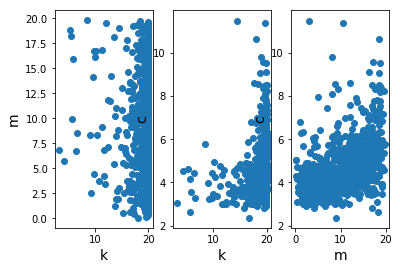

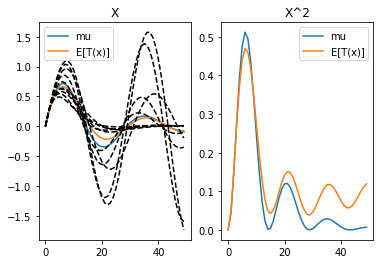

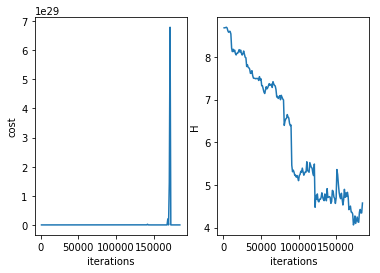

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 186000 
H 4.476873513807821
cost 2.0023790845928436e+22
system.D 3


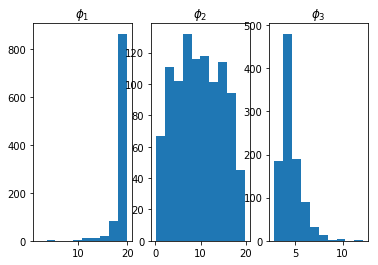

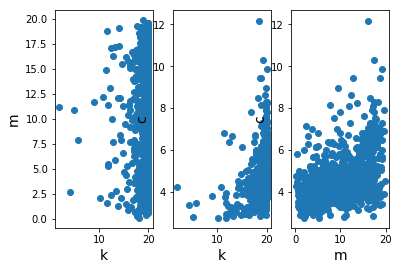

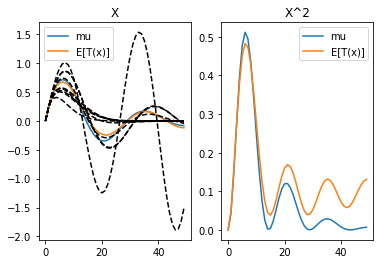

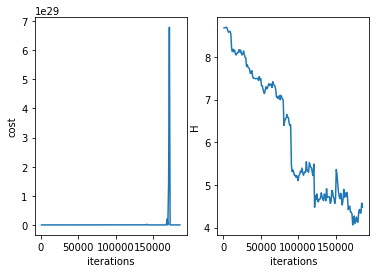

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 187000 
H 4.35266692378095
cost 1.937425690160738e+22
system.D 3


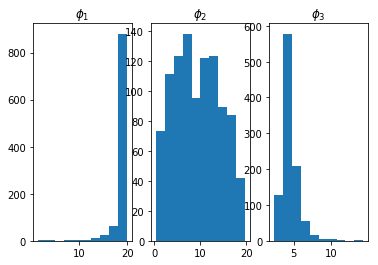

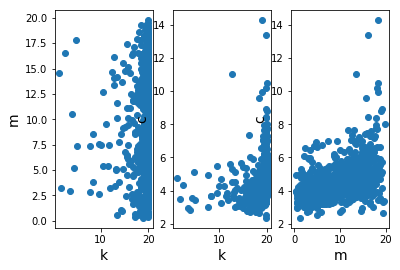

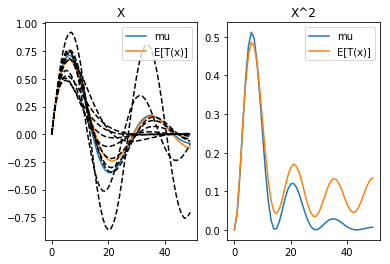

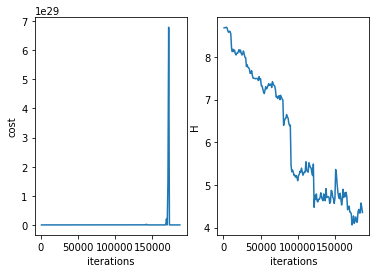

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 188000 
H 4.402845712081167
cost 3.855748007546471e+22
system.D 3


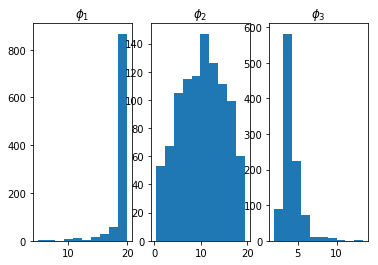

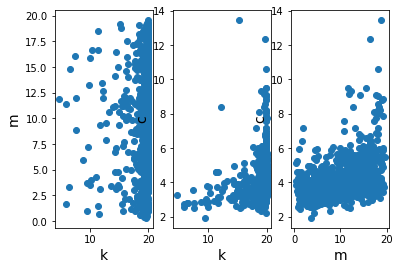

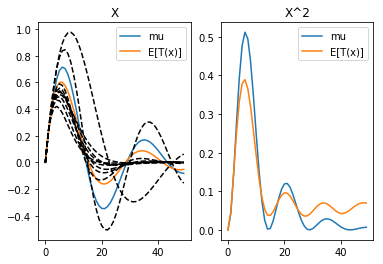

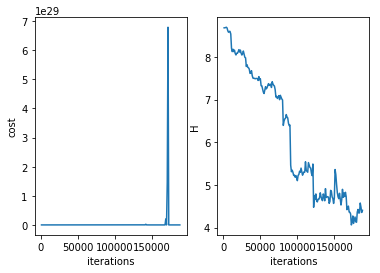

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 189000 
H 4.376271581448855
cost 2.4657707715691857e+22
system.D 3


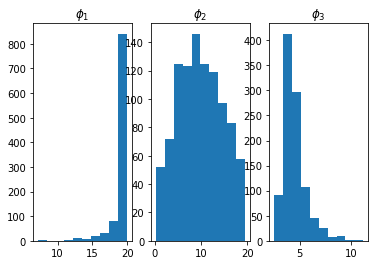

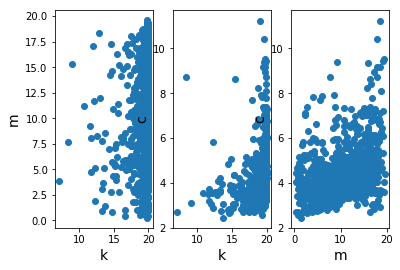

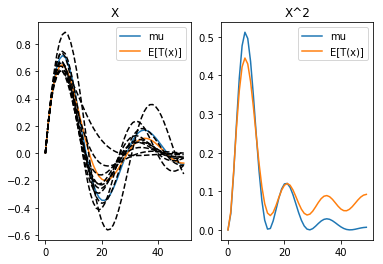

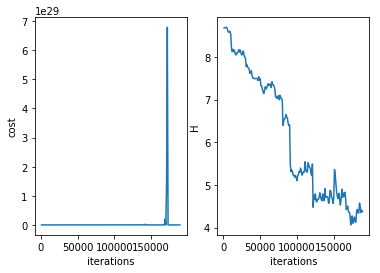

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 190000 
H 4.401715522514183
cost 2.0541178331561705e+22
system.D 3


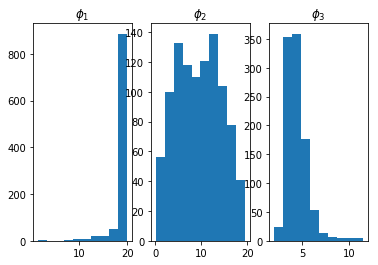

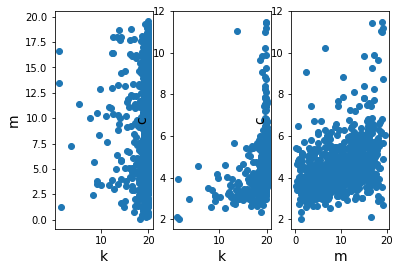

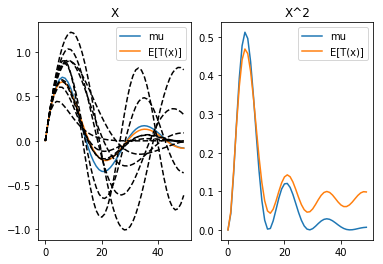

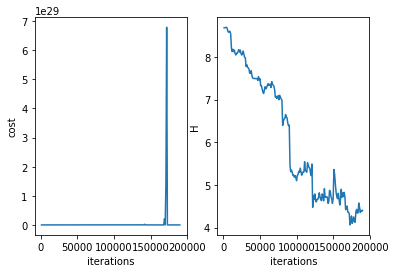

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/
AL iteration 20
resetting optimizer
aug lag it 19
lambda [ 0.00000000e+00  1.36296176e+21  2.63113971e+20 -2.03918409e+21
 -4.65429270e+21 -6.95547002e+21 -8.53385099e+21 -9.16270818e+21
 -8.76683919e+21 -7.39243635e+21 -5.17753485e+21 -2.32333955e+21
  9.32652845e+20  4.34087475e+21  7.66047109e+21  1.06760935e+22
  1.32103808e+22  1.51320687e+22  1.63598876e+22  1.68626329e+22
  1.66559311e+22  1.57963664e+22  1.43736727e+22  1.25017435e+22
  1.03091566e+22  7.92988395e+21  5.49472370e+21  3.12392422e+21
  9.21291656e+20 -1.03000004e+21 -2.66986836e+21 -3.96206577e+21
 -4.89340212e+21 -5.47162763e+21 -5.72231619e+21 -5.68500403e+21
 -5.40897811e+21 -4.94894857e+21 -4.36097498e+21 -3.69878401e+21
 -3.01077280e+21 -2.33769373e+21 -1.71122369e+21 -1.15325925e+21
 -6.76068332e+20 -2.82999747e+20  3.

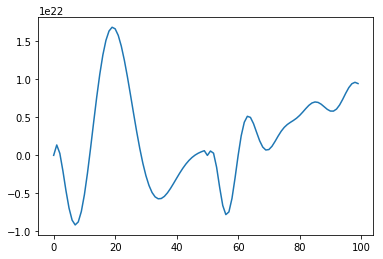

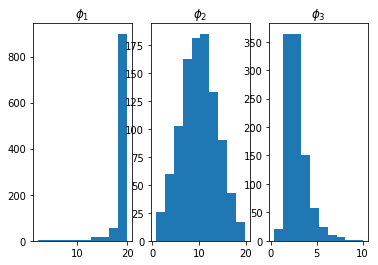

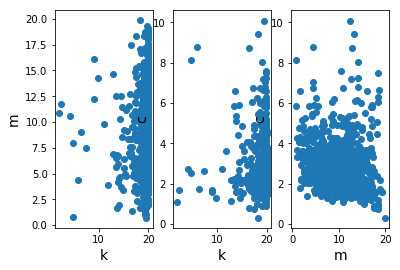

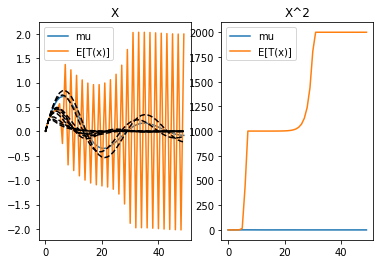

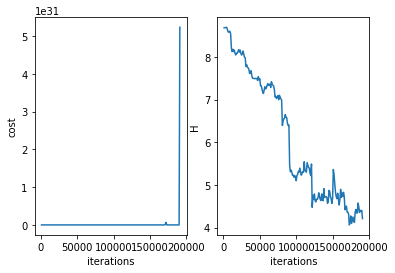

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 192000 
H 3.8700665748929377
cost 1.1576518162160215e+24
system.D 3


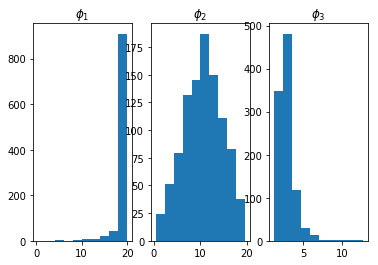

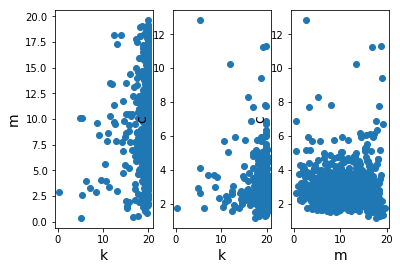

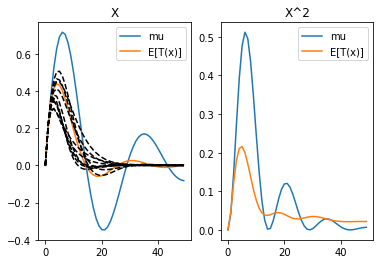

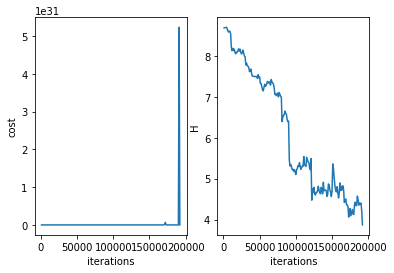

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 193000 
H 3.899770459618921
cost 1.1199561138904264e+24
system.D 3


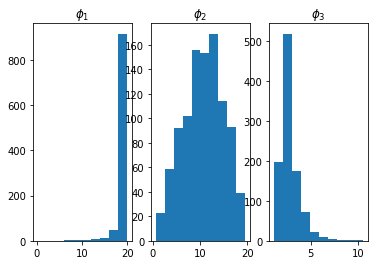

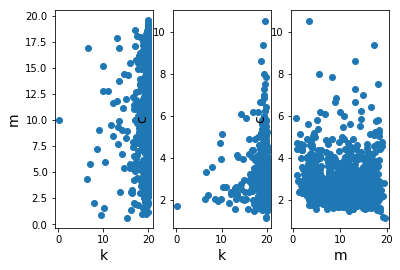

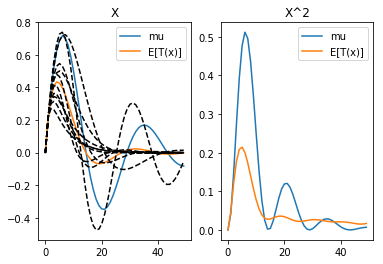

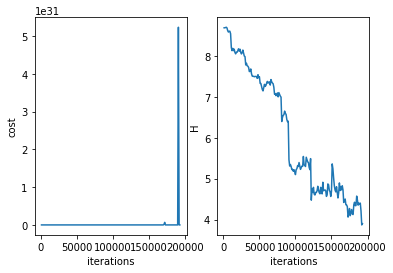

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 194000 
H 3.7771104869239727
cost 1.1407916262730314e+24
system.D 3


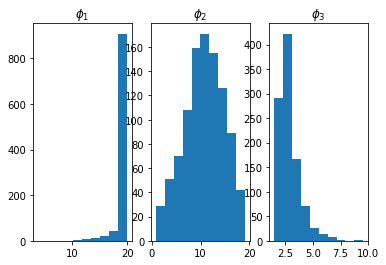

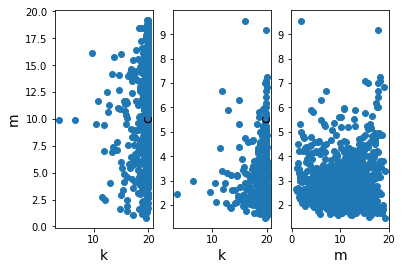

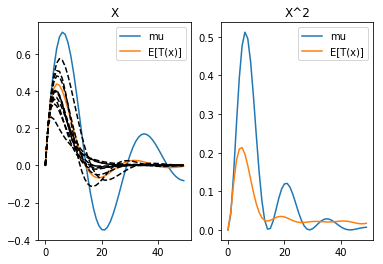

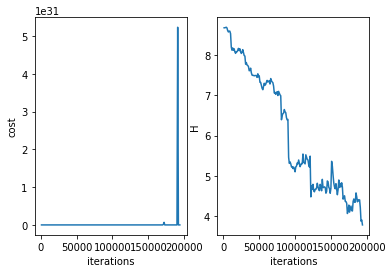

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 195000 
H 3.8115065288993666
cost 1.1160356755723351e+24
system.D 3


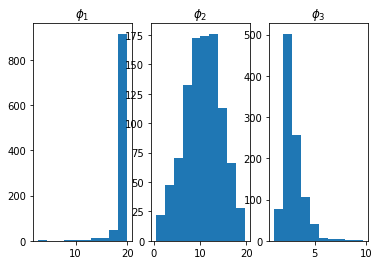

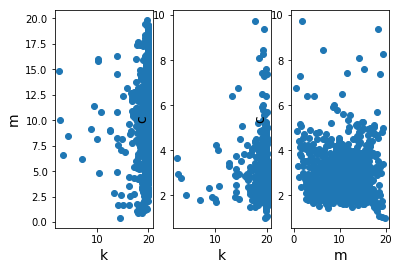

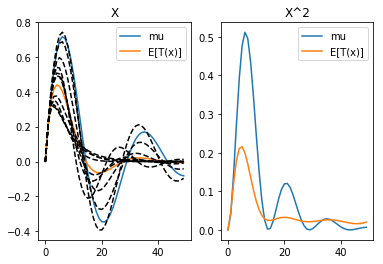

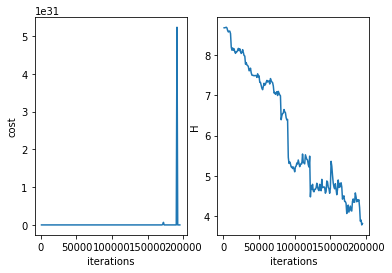

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 196000 
H 3.8074997958835306
cost 1.1508146915226993e+24
system.D 3


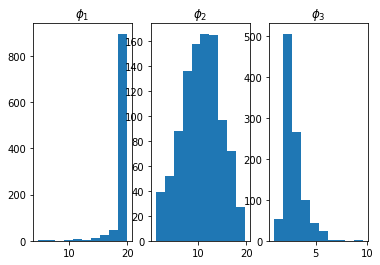

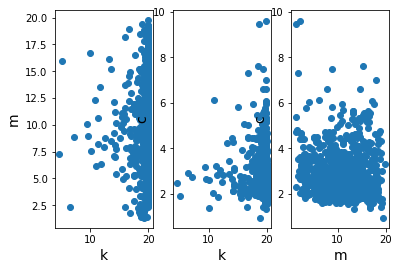

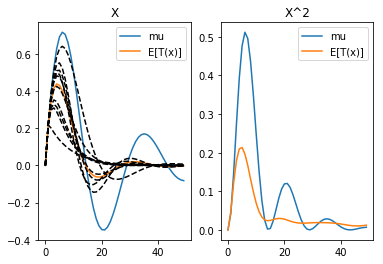

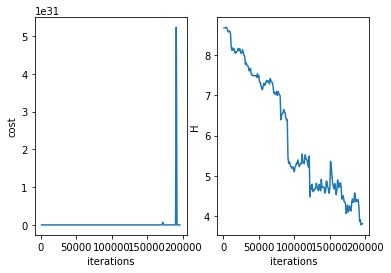

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 197000 
H 3.905486602955417
cost 1.1564970843666814e+24
system.D 3


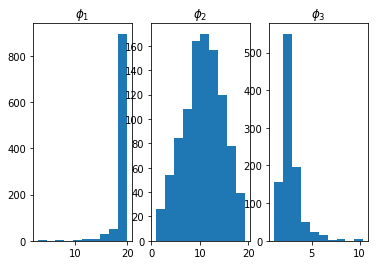

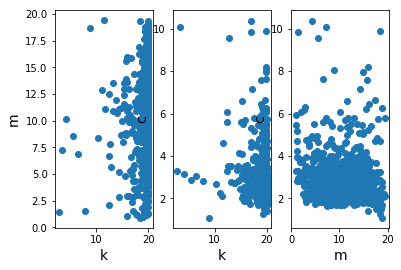

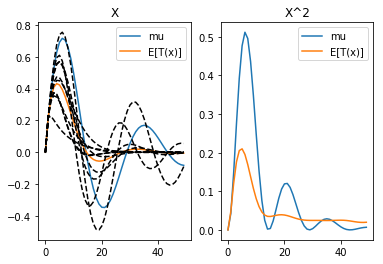

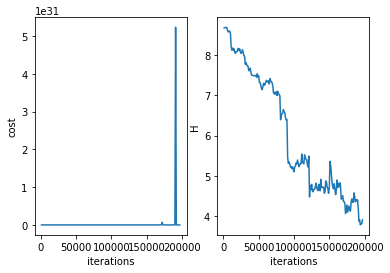

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 198000 
H 3.843532645320718
cost 1.1143541235046067e+24
system.D 3


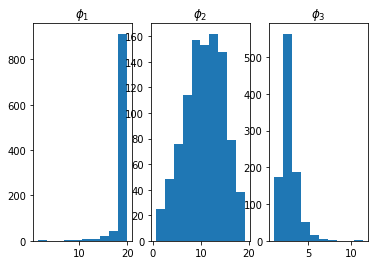

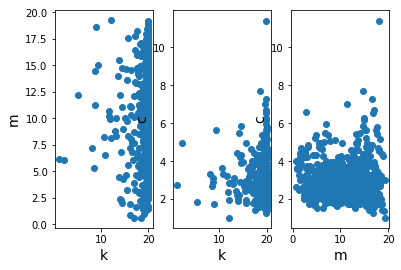

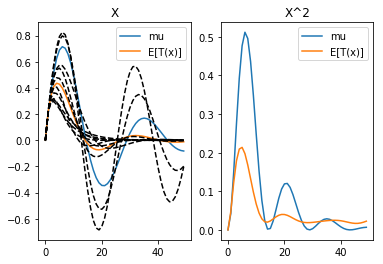

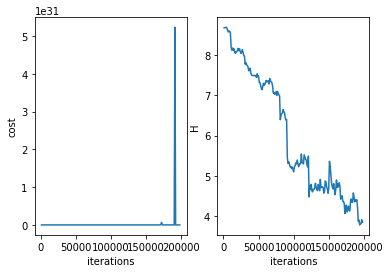

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 199000 
H 3.958954337041717
cost 1.1280383254068696e+24
system.D 3


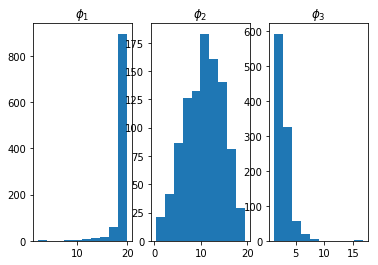

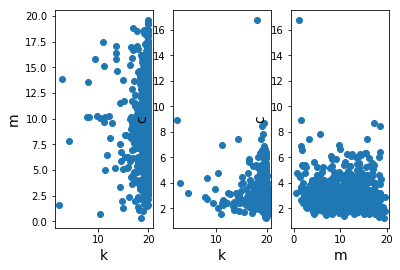

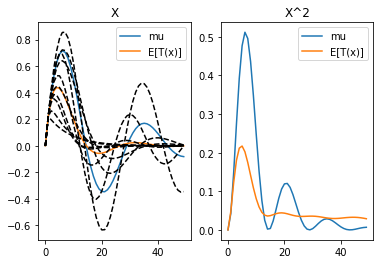

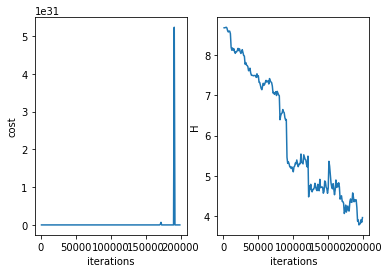

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
******************************************
it = 200000 
H 3.9726657928685145
cost 1.117552782150868e+24
system.D 3


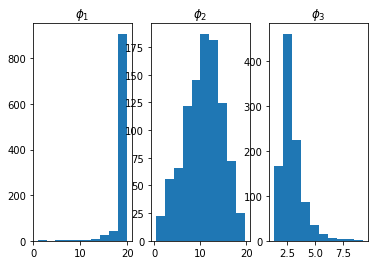

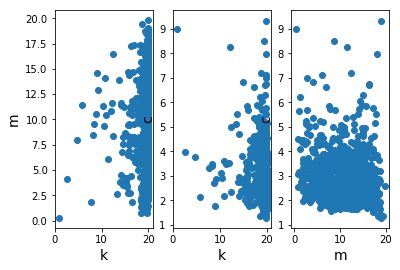

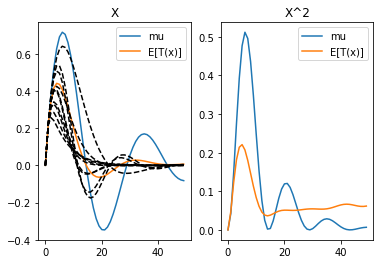

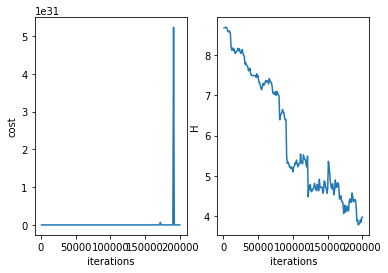

saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/  ...
******************************************
saving to results//tb/damped_harmonic_oscillator_D=3_T=50_flow=4P_rs=0/


In [18]:
behavior_str = 'trajectory';
random_seed = 0;

TIF_flow_type = 'PlanarFlowLayer';
nlayers = 4;
flow_dict = {'latent_dynamics':None, \
             'TIF_flow_type':TIF_flow_type, \
             'repeats':nlayers};

n = 1000;
k_max = 20;
c_init = 1e5;
check_rate = 1000;
max_iters = 10000;
lr_order = -3;


system_class = system_from_str(system_str);
system = system_class(behavior_str, T, dt, init_conds, bounds);

np.random.seed(0);

behavior = {'mu':mu, 'Sigma':Sigma};
print(behavior)
print(init_conds)

cost, phi, T_x = train_dsn(system, behavior, n, flow_dict, \
                       k_max=k_max, c_init=c_init, lr_order=lr_order, check_rate=check_rate, \
                       max_iters=max_iters, random_seed=random_seed);

